##### FINAL VERSION OF SCRIPT -  
Katrina Kalantar
April 2018

Analysis for mBAL microbe study

# Set-up

In [1]:
run_description = 'Running with Meningitis Pathogen List, NO water correction, Z-score > 1, dual RNA-seq (no DNA)'

## Environment Setup

In [2]:
# set the width of the jupyter notebook so we don't waste so much valuable browser real-estate!
#from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:95% !important; }</style>"))

In [3]:
# required libraries
from collections import Counter
import csv
import glob
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
from pylab import *
import random
import seaborn as sns
import sklearn
import statistics
import scipy
import scipy.stats
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn import preprocessing
from sklearn.metrics import roc_curve
import sys, os.path
import warnings; warnings.simplefilter('ignore')
import ecopy

# import microbial analysis and plotting functions 
# developed by me, but moved to external scripts for simplicity in .ipynb
scripts_dir = './scripts/'
sys.path.append(scripts_dir)
import IDseq_pathogen_functions2 
import IDseq_plotting_functions

#https://tonysyu.github.io/raw_content/matplotlib-style-gallery/gallery.html
plt.style.use('fivethirtyeight')   
%matplotlib inline  

## Import Data

### Curated List of Top Respiratory Pathogens (and viruses)
Manually currated from papers and the NCBI taxonomy database

The **list_of_viruses_in_dictionary** contains all microbes which are listed as "Viruses". The **full_respiratory_microbes_list** contains all microbes identified as "likely pathogenic" in the respiratory tract.

In [4]:
# a priori curated list of all viruses
# to obtain this list (of all viruses in the samples), I ran `grep Viruses` 
# in all .csv report files in BM_4
v = open('./reference/viruses_bangldesh_uniq.txt', 'r').readlines()
list_of_viruses_in_dictionary = [i.strip() for i in v]

# Curated list of top respiratory pathogens
resp_mic = open('./reference/pathogens_bangladesh_official.txt', 'r').readlines()
full_respiratory_microbes_list = [i.strip() for i in resp_mic]

### Global Variables

In [5]:
data_directory =  '070518'
output_directory = '071818_RNA'  

topX = 25 # because all microbes identified in culture are present among the top 15 microbes


# read in metadata to get RNA and DNA file names
metadata = pd.read_csv(
    './data/' + data_directory +
    '/combined_metadata.tsv',
    sep='\t',
    header=0,
    index_col=0)

print(metadata.shape)
print(len(metadata['sample_name_DNA']))
print(len(metadata['sample_name_RNA']))

metadata = metadata[metadata.index.notnull()]

# remove rows with null DNA filenames; some samples were missing DNA-seq data
#metadata = metadata[metadata['sample_name_DNA']
#                    .notnull()]  

# remove rows with null RNA filenames; no RNA-seq files should be missing
metadata = metadata[metadata['sample_name_RNA']
                    .notnull()] 

#print(metadata.head())
true_classification = ''

if('effective_group' in metadata.columns):
    # create the "true_classification" variable from the metadata  
    a = metadata[['sample_name_DNA','effective_group','organism']]
    b = metadata[['sample_name_RNA','effective_group','organism']]
    b.columns = ['sample_name_DNA','effective_group','organism']
    c = pd.concat([a,b])
    c.index = c['sample_name_DNA']
    c.sort_values(by='sample_name_DNA',inplace=True)
    c = c[c['sample_name_DNA'] != 'n/a']
    c = c[['effective_group','organism']]
    true_classification = c

else:
    effective_group = [2 for i in range(len(metadata.index))]
    organism = ['' for i in range(len(metadata.index))]
    c = pd.concat([metadata['sample_name_DNA'],metadata['sample_name_RNA']], axis=1)
    c['effective_group'] = pd.Series(effective_group, index = metadata.index)
    c['organism'] = pd.Series(organism, index = metadata.index)
    true_classification = c
    
print(true_classification.shape)
print(true_classification.head())

file_pairs_dict = pd.concat([metadata['sample_name_DNA'].fillna('none'),metadata['sample_name_RNA'].fillna('none')], axis=1)

'''
file_pairs_dict = dict(
    zip(metadata['sample_name_DNA'].fillna('none'), metadata['sample_name_RNA'].fillna('none')
        ))  #create dictionary mapping RNAfilename with associated DNAfilename

# create a reverse dictionary for file look-up from RNA:DNA later on
file_pairs_dict
file_pairs_dict_rev = {}
for i in file_pairs_dict.keys():
    file_pairs_dict_rev[file_pairs_dict[i]] = i
'''

description_file = open('./output/' + output_directory + '/run_description.txt','w')
description_file.write(run_description)
description_file.close()


(97, 58)
97
97
(194, 2)
                     effective_group                  organism
sample_name_DNA                                               
CHRF_DNA_0002_C_S4                 1  Streptococcus pneumoniae
CHRF_DNA_0003_C_S12                1  Streptococcus pneumoniae
CHRF_DNA_0004_C_S20                1  Streptococcus pneumoniae
CHRF_DNA_0005_C_S28                1   Enterobacter hormaechei
CHRF_DNA_0006_C_S36                4                       NaN


In [6]:
print([i for i in file_pairs_dict.index])

['CHRF_0000', 'CHRF_0001', 'CHRF_0002', 'CHRF_0003', 'CHRF_0004', 'CHRF_0005', 'CHRF_0006', 'CHRF_0007', 'CHRF_0008', 'CHRF_0009', 'CHRF_0010', 'CHRF_0011', 'CHRF_0012', 'CHRF_0013', 'CHRF_0014', 'CHRF_0015', 'CHRF_0016', 'CHRF_0017', 'CHRF_0018', 'CHRF_0019', 'CHRF_0020', 'CHRF_0021', 'CHRF_0022', 'CHRF_0023', 'CHRF_0024', 'CHRF_0025', 'CHRF_0026', 'CHRF_0027', 'CHRF_0028', 'CHRF_0029', 'CHRF_0030', 'CHRF_0031', 'CHRF_0032', 'CHRF_0033', 'CHRF_0034', 'CHRF_0035', 'CHRF_0036', 'CHRF_0037', 'CHRF_0038', 'CHRF_0039', 'CHRF_0040', 'CHRF_0041', 'CHRF_0042', 'CHRF_0043', 'CHRF_0044', 'CHRF_0045', 'CHRF_0046', 'CHRF_0047', 'CHRF_0048', 'CHRF_0049', 'CHRF_0050', 'CHRF_0051', 'CHRF_0052', 'CHRF_0053', 'CHRF_0054', 'CHRF_0055', 'CHRF_0056', 'CHRF_0057', 'CHRF_0058', 'CHRF_0059', 'CHRF_0060', 'CHRF_0061', 'CHRF_0062', 'CHRF_0063', 'CHRF_0064', 'CHRF_0065', 'CHRF_0066', 'CHRF_0067', 'CHRF_0068', 'CHRF_0069', 'CHRF_0070', 'CHRF_0071', 'CHRF_0072', 'CHRF_0073', 'CHRF_0074', 'CHRF_0075', 'CHRF_0076'

In [7]:
# write the microbes used for this particular analysis to the output directory
open('./output/' + output_directory + '/USED.viruses.txt', 'w').write(
    '\n'.join(list_of_viruses_in_dictionary));
open('./output/' + output_directory + '/USED.known_respiratory_pathogens.txt',
     'w').write('\n'.join(full_respiratory_microbes_list));

# Run Analysis

Run the main functions to generate scores required for all further plotting steps.

In [8]:
# create the output file that will containg the top 20 microbes for each sample 
# with the caveat that all microbes must be present on both RNA-seq and 
# DNA-seq (with the exception of RNA viruses)
f = open('./output/' + output_directory + '/TableS4.csv', 'w')
f.close()

f = open('./output/' + output_directory + '/TableS4_lowcount.csv', 'w')
f.close()

dna_genus_water_subtraction = None #compute_water_subtraction(merge_dna)
rna_genus_water_subtraction = None #compute_water_subtraction(merge_rna)

# run the main function to load microbial data into the data structure for downstream analysis
main_output = IDseq_pathogen_functions2.main('data/' + data_directory, 
                                      'rr007_dna_reports', 'rapid-response-007_reports',
                                      file_pairs_dict, output_directory,
                                      metadata, subtract_dna = dna_genus_water_subtraction, 
                                            subtract_rna = rna_genus_water_subtraction, expect_DNA=False, expect_RNA = True)#True) 
bacterial = main_output[0]
viral = main_output[1]
full = main_output[2]

list_of_files = list(
    bacterial.keys())  # create list of RNA files for accessing the outputs




./data/070518/rapid-response-007_reports/chrf_rna_0000_s97.csv
./data/070518/rr007_dna_reports/none.csv
      tax_id                                               name common_name  \
0 -201667166  Non-genus-specific reads in family Stachybotry...         NaN   
1 -101667166  Non-species-specific reads in family Stachybot...         NaN   
2       1301                                      Streptococcus         NaN   
3 -100001301  Non-species-specific reads in genus Streptococcus         NaN   
4      28037                                Streptococcus mitis         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -201667166       1667166     Eukaryota   
1          1     -101667166   -201667166       1667166     Eukaryota   
2          2           -100         1301          1300      Bacteria   
3          1     -100001301         1301          1300      Bacteria   
4          1          28037         1301          1300    

         tax_id                                               name  \
0          1301                                      Streptococcus   
1          1313                           Streptococcus pneumoniae   
2    -100001301  Non-species-specific reads in genus Streptococcus   
3         28037                                Streptococcus mitis   
4          1311                           Streptococcus agalactiae   
5          1303                               Streptococcus oralis   
6          1314                             Streptococcus pyogenes   
7          1338                          Streptococcus intermedius   
8          1308                         Streptococcus thermophilus   
9        257758                     Streptococcus pseudopneumoniae   
10         1307                                 Streptococcus suis   
11       113107                            Streptococcus australis   
12         1318                        Streptococcus parasanguinis   
13      1095727     

DNA
      tax_id                                               name common_name  \
0     687331                                   Alphatorquevirus         NaN   
1     687355                               Torque teno virus 16         NaN   
2 -100687331  Non-species-specific reads in genus Alphatorqu...         NaN   
3     687340                                Torque teno virus 1         NaN   
4     687360                               Torque teno virus 21         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       687331        687329       Viruses   
1          1         687355       687331        687329       Viruses   
2          1     -100687331       687331        687329       Viruses   
3          1         687340       687331        687329       Viruses   
4          1         687360       687331        687329       Viruses   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0        

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          41.1
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          28.5
NT_rpm RNA                          41.1
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          28.5
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                 10.5
NT_zscore DNA                              14.5
genus_NT_rpm DNA                           17.4
genus_NT_zscore DNA                        -0.3
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                    8
NT_rpm RNA         

RNA HEAD
(530, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria       447237   137.4       99.0         156.4   
9       Bacteria       392733    15.0       99.0          21.9   
11      Bacteria         2034    11.5       99.0          46.6   
12      Bacteria         2034     5.8       50.8          46.6   
13      Bacteria         2034     3.2       39.3          46.6   

    genus_NT_zscore                           name  NR_rpm  
0              99.0  Frondihabitans sp. PAMC 28766     2.7  
9              99.0             Terriglobus roseus     4.4  
11             86.7        Curtobacterium sp. 9128     0.1  
12             86.7   Curtobacterium sp. MR_MD2014     0.1  
13             86.7        Curtobacterium pusillum     0.1  
RNA HEAD2
(79, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria       447237       137.4           99.0             156.4   
9       Bacteria       392733        15.0    

category_name                          Bacteria
genus_taxid                                 118
NT_rpm DNA                                  1.1
NT_zscore DNA                               1.6
genus_NT_rpm DNA                            1.1
genus_NT_zscore DNA                         0.3
name_x                 Planctomyces sp. SH-PL62
NR_rpm DNA                                  0.1
NT_rpm RNA                                  1.1
NT_zscore RNA                               1.6
genus_NT_rpm RNA                            1.1
genus_NT_zscore RNA                         0.3
name_y                 Planctomyces sp. SH-PL62
NR_rpm RNA                                  0.1
Name: 49, dtype: object
category_name                           Bacteria
genus_taxid                                29404
NT_rpm DNA                                   1.1
NT_zscore DNA                                1.2
genus_NT_rpm DNA                             1.7
genus_NT_zscore DNA                          1.4
name_x    

(17, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria          547        99.8           99.0             465.9   
63       Bacteria          544        36.4           99.0              40.1   
85       Bacteria      1330546         3.1           59.8               3.1   
88       Bacteria         1578        36.5           17.7              68.6   
122      Bacteria          848         2.3            6.0               6.2   

     genus_NT_zscore RNA                     name  NR_rpm RNA  
0                   99.0  Enterobacter hormaechei        11.2  
63                  50.9     Citrobacter freundii         4.6  
85                  42.2  Pluralibacter gergoviae         0.3  
88                   4.6  Lactobacillus crispatus        21.2  
122                  7.5  Fusobacterium nucleatum         2.6  
       tax_id                                               name  \
0      158836                            Enterobacter hormaechei 

DNA
      tax_id                                            name common_name  \
0         32                                      Myxococcus         NaN   
1         33                               Myxococcus fulvus         NaN   
2    1297742                             Myxococcus hansupus         NaN   
3      83455                           Myxococcus stipitatus         NaN   
4 -100000032  Non-species-specific reads in genus Myxococcus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100           32            31      Bacteria   
1          1             33           32            31      Bacteria   
2          1        1297742           32            31      Bacteria   
3          1          83455           32            31      Bacteria   
4          1     -100000032           32            31      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore    NR_r  \
0         0  8136.0      ...   

category_name                      Bacteria
genus_taxid                             547
NT_rpm DNA                                5
NT_zscore DNA                           1.2
genus_NT_rpm DNA                        5.4
genus_NT_zscore DNA                     0.6
name_x                 Enterobacter cloacae
NR_rpm DNA                              0.6
NT_rpm RNA                                5
NT_zscore RNA                           1.2
genus_NT_rpm RNA                        5.4
genus_NT_zscore RNA                     0.6
name_y                 Enterobacter cloacae
NR_rpm RNA                              0.6
Name: 5, dtype: object
category_name                                 Bacteria
genus_taxid                                      32067
NT_rpm DNA                                         1.2
NT_zscore DNA                                      3.9
genus_NT_rpm DNA                                   1.7
genus_NT_zscore DNA                                0.8
name_x                 Leptotri

A
B
C
D
E
F
inside convert_input
         tax_id                                               name  \
0         57493                                            Kocuria   
1        388357                                Kocuria turfanensis   
2    -100057493        Non-species-specific reads in genus Kocuria   
3       1811275                               Kocuria sp. ALBL_117   
4        446860                                      Kocuria flava   
5       1581242                               Kocuria sp. FXJ8.125   
6        259305                             uncultured Kocuria sp.   
7        136273                                    Kocuria polaris   
8          1275                                      Kocuria rosea   
9       1339234                                Kocuria sp. ZOR0020   
10       211891                             Kocuria sp. 2216.35.31   
11       388923                                    Kocuria sp. KY2   
12       510142                                  Kocuria 

category_name                     Bacteria
genus_taxid                          57493
NT_rpm DNA                            30.5
NT_zscore DNA                          5.5
genus_NT_rpm DNA                      75.1
genus_NT_zscore DNA                    3.5
name_x                 Kocuria turfanensis
NR_rpm DNA                             0.7
NT_rpm RNA                            30.5
NT_zscore RNA                          5.5
genus_NT_rpm RNA                      75.1
genus_NT_zscore RNA                    3.5
name_y                 Kocuria turfanensis
NR_rpm RNA                             0.7
Name: 0, dtype: object
category_name                     Bacteria
genus_taxid                            475
NT_rpm DNA                            10.8
NT_zscore DNA                          1.3
genus_NT_rpm DNA                      11.7
genus_NT_zscore DNA                    0.7
name_x                 Moraxella osloensis
NR_rpm DNA                             2.9
NT_rpm RNA                     

         tax_id                                               name  \
0    -200042364    Non-genus-specific reads in family Diatrypaceae   
1    -100042364  Non-species-specific reads in family Diatrypaceae   
2        110525                                      Kretzschmaria   
3        110526                               Kretzschmaria deusta   
4         97095                                             Eutypa   
5       1755186                               Eutypa sp. 1 NV-2015   
6       1812702                                    Eutypa linearis   
7         97096                                        Eutypa lata   
8        190937                               Eutypa sp. HKUCC 337   
9    -100097095         Non-species-specific reads in genus Eutypa   
10       140182                                  Eutypa consobrina   
11       252224                                 Eutypa sp. SMH3580   
12       216851                                   Faecalibacterium   
13          853     

category_name                              Bacteria
genus_taxid                                  133925
NT_rpm DNA                                      0.9
NT_zscore DNA                                   4.9
genus_NT_rpm DNA                                1.5
genus_NT_zscore DNA                             2.4
name_x                 Olsenella sp. oral taxon 807
NR_rpm DNA                                      0.1
NT_rpm RNA                                      0.9
NT_zscore RNA                                   4.9
genus_NT_rpm RNA                                1.5
genus_NT_zscore RNA                             2.4
name_y                 Olsenella sp. oral taxon 807
NR_rpm RNA                                      0.1
Name: 18, dtype: object
category_name                                   Bacteria
genus_taxid                                       294702
NT_rpm DNA                                           0.9
NT_zscore DNA                                          3
genus_NT_rpm DNA    

RNA HEAD
(215, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
12      Bacteria          914    21.8        5.8          42.9   
13      Bacteria          914     2.7        5.7          42.9   
22      Bacteria       242605    11.5        5.6          12.1   
23      Bacteria         1279    39.3        5.8          98.4   
24      Bacteria         1279     0.6       -0.2          98.4   

    genus_NT_zscore                          name  NR_rpm  
12              5.8       Nitrosomonas sp. Is79A3     0.2  
13              5.8            Nitrosomonas ureae     1.0  
22              5.6      Luteibacter rhizovicinus     0.1  
23              1.3  Staphylococcus saprophyticus     5.6  
24              1.3         Staphylococcus aureus    46.1  
RNA HEAD2
(41, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
12       Bacteria          914        21.8            5.8              42.9   
22       Bacteria       242605        11.5       

      tax_id                                             name common_name  \
0      12059                                      Enterovirus         NaN   
1     138949                                    Enterovirus B         NaN   
2 -100012059  Non-species-specific reads in genus Enterovirus         NaN   
3     363231                         Antwerp rhinovirus 98/99         NaN   
4     687332                                  Betatorquevirus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100        12059         12058       Viruses   
1          1         138949        12059         12058       Viruses   
2          1     -100012059        12059         12058       Viruses   
3          1         363231        12059         12058       Viruses   
4          2           -100       687332        687329       Viruses   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0         0  468.0     

       tax_id                             name     common_name  tax_level  \
0      138949                    Enterovirus B             NaN          1   
1      363231         Antwerp rhinovirus 98/99             NaN          1   
2       93678              TTV-like mini virus             NaN          1   
3     1535290     Torque teno mini virus ALA22             NaN          1   
4      687370         Torque teno mini virus 2             NaN          1   
5      687373         Torque teno mini virus 5             NaN          1   
6     2065038    Unnamed species taxon 2065038             NaN          1   
7      452438   uncultured Xylanibacterium sp.             NaN          1   
8      143224               Zobellia uliginosa             NaN          1   
9      103977              Papuacedrus papuana             NaN          1   
10     529580                Lysiana filifolia             NaN          1   
11      33871         Coriobacterium glomerans             NaN          1   

A
B
C
D
E
F
RNA shape in calculate_scores:
(1525, 29)
RNA HEAD
(99, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses        39744     0.7      100.0           0.7   
2        Viruses        10375     0.1      100.0           0.1   
11       Viruses       325455     0.1      100.0           0.1   
18      Bacteria          286     0.2        0.2           2.5   
39      Bacteria          286     0.1       -0.4           2.5   

    genus_NT_zscore                      name  NR_rpm  
0             100.0         Mumps rubulavirus     0.6  
2             100.0  Human gammaherpesvirus 4     0.1  
11              1.0     Gammapapillomavirus 7     0.1  
18             -0.9   Pseudomonas alcaligenes     0.1  
39             -0.9    Pseudomonas aeruginosa     0.3  
RNA HEAD2
(5, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         Viruses        39744         0.7          100.0               0.7   
2         Viruses    

DNA
      tax_id                                             name common_name  \
0       5052                                      Aspergillus         NaN   
1       5062                               Aspergillus oryzae         NaN   
2 -100005052  Non-species-specific reads in genus Aspergillus         NaN   
3       5059                               Aspergillus flavus         NaN   
4       5067                          Aspergillus parasiticus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         5052       1131492     Eukaryota   
1          1           5062         5052       1131492     Eukaryota   
2          1     -100005052         5052       1131492     Eukaryota   
3          1           5059         5052       1131492     Eukaryota   
4          1           5067         5052       1131492     Eukaryota   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  26004.0   

category_name                    Viruses
genus_taxid                        11019
NT_rpm DNA                        1398.4
NT_zscore DNA                         99
genus_NT_rpm DNA                  1830.1
genus_NT_zscore DNA                   99
name_x                 Chikungunya virus
NR_rpm DNA                         568.6
NT_rpm RNA                        1398.4
NT_zscore RNA                         99
genus_NT_rpm RNA                  1830.1
genus_NT_zscore RNA                   99
name_y                 Chikungunya virus
NR_rpm RNA                         568.6
Name: 0, dtype: object
category_name                            Viruses
genus_taxid                              1511911
NT_rpm DNA                                1172.3
NT_zscore DNA                                 99
genus_NT_rpm DNA                            1175
genus_NT_zscore DNA                           99
name_x                 Primate tetraparvovirus 1
NR_rpm DNA                                 333.9
NT_rpm RNA 

(207, 29)
RNA HEAD
(10, 8)
    category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0         Viruses   -200687329     2.3       99.0           NaN   
1         Viruses   -200687329     0.2      100.0           NaN   
3         Viruses       687332     1.2       99.0           2.7   
9        Bacteria         1301    23.5       33.4          29.7   
105      Bacteria        41275     0.4       -0.3           1.6   

     genus_NT_zscore                      name  NR_rpm  
0                NaN         Torque teno virus     2.3  
1                NaN    Torque teno midi virus     0.2  
3               99.0       TTV-like mini virus     0.6  
9                0.2  Streptococcus pneumoniae    19.0  
105             -0.2    Brevundimonas diminuta     0.2  
RNA HEAD2
(3, 8)
  category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Viruses   -200687329         2.3           99.0               NaN   
3       Viruses       687332         1.2           99.0  

DNA
      tax_id                                               name common_name  \
0    1511911                                    Tetraparvovirus         NaN   
1    1511913                          Primate tetraparvovirus 1         NaN   
2 -101511911  Non-species-specific reads in genus Tetraparvo...         NaN   
3    1511915                         Ungulate tetraparvovirus 2         NaN   
4    1511917                         Ungulate tetraparvovirus 4         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1511911         10780       Viruses   
1          1        1511913      1511911         10780       Viruses   
2          1     -101511911      1511911         10780       Viruses   
3          1        1511915      1511911         10780       Viruses   
4          1        1511917      1511911         10780       Viruses   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                       Bacteria
genus_taxid                              469
NT_rpm DNA                             142.6
NT_zscore DNA                           80.8
genus_NT_rpm DNA                       372.9
genus_NT_zscore DNA                      2.3
name_x                 Acinetobacter lwoffii
NR_rpm DNA                               0.3
NT_rpm RNA                             142.6
NT_zscore RNA                           80.8
genus_NT_rpm RNA                       372.9
genus_NT_zscore RNA                      2.3
name_y                 Acinetobacter lwoffii
NR_rpm RNA                               0.3
Name: 0, dtype: object
category_name                            Viruses
genus_taxid                              1511911
NT_rpm DNA                                 136.6
NT_zscore DNA                               80.4
genus_NT_rpm DNA                           139.6
genus_NT_zscore DNA                         82.2
name_x                 Primate tetraparvovirus 1
NR_r

DNA
      tax_id                                           name common_name  \
0    1920762                                      Lit1virus         NaN   
1    1920764                         Pseudomonas virus PA26         NaN   
2    1920765                         Pseudomonas virus Ab09         NaN   
3    1920763                         Pseudomonas virus LIT1         NaN   
4 -101920762  Non-species-specific reads in genus Lit1virus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1920762         10744       Viruses   
1          1        1920764      1920762         10744       Viruses   
2          1        1920765      1920762         10744       Viruses   
3          1        1920763      1920762         10744       Viruses   
4          1     -101920762      1920762         10744       Viruses   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0         1  56.0      ...       

category_name                         Bacteria
genus_taxid                               1060
NT_rpm DNA                                22.3
NT_zscore DNA                             46.4
genus_NT_rpm DNA                          41.1
genus_NT_zscore DNA                       27.3
name_x                 Rhodobacter sp. LPB0142
NR_rpm DNA                                 0.1
NT_rpm RNA                                22.3
NT_zscore RNA                             46.4
genus_NT_rpm RNA                          41.1
genus_NT_zscore RNA                       27.3
name_y                 Rhodobacter sp. LPB0142
NR_rpm RNA                                 0.1
Name: 0, dtype: object
category_name                            Bacteria
genus_taxid                                 43668
NT_rpm DNA                                   10.8
NT_zscore DNA                                 1.1
genus_NT_rpm DNA                             32.2
genus_NT_zscore DNA                           0.8
name_x             

RNA HEAD
(144, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
12      Bacteria          816     6.2       30.0           9.5   
16      Bacteria          816     0.5        1.6           9.5   
42       Viruses   -200687329     0.1      100.0           NaN   
49      Bacteria          407     6.9        1.2          90.9   
53      Bacteria          407     1.8        0.6          90.9   

    genus_NT_zscore                        name  NR_rpm  
12              3.9        Bacteroides fragilis    15.2  
16              3.9        Bacteroides vulgatus     0.3  
42              NaN                   SEN virus     0.1  
49              0.4  Methylobacterium aquaticum     1.5  
53              0.4     Methylobacterium populi     1.6  
RNA HEAD2
(8, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
12       Bacteria          816         6.2           30.0               9.5   
42        Viruses   -200687329         0.1          100.0     

DNA
      tax_id                                               name common_name  \
0        590                                         Salmonella         NaN   
1      28901                                Salmonella enterica         NaN   
2 -100000590     Non-species-specific reads in genus Salmonella         NaN   
3      54736                                 Salmonella bongori         NaN   
4 -200000543  Non-genus-specific reads in family Enterobacte...         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          590           543      Bacteria   
1          1          28901          590           543      Bacteria   
2          1     -100000590          590           543      Bacteria   
3          1          54736          590           543      Bacteria   
4          2           -100   -200000543           543      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         

category_name                     Bacteria
genus_taxid                            590
NT_rpm DNA                            12.6
NT_zscore DNA                          1.7
genus_NT_rpm DNA                      12.7
genus_NT_zscore DNA                    1.8
name_x                 Salmonella enterica
NR_rpm DNA                            44.8
NT_rpm RNA                            12.6
NT_zscore RNA                          1.7
genus_NT_rpm RNA                      12.7
genus_NT_zscore RNA                    1.8
name_y                 Salmonella enterica
NR_rpm RNA                            44.8
Name: 0, dtype: object
category_name                    Bacteria
genus_taxid                          1357
NT_rpm DNA                            2.1
NT_zscore DNA                         1.9
genus_NT_rpm DNA                      2.2
genus_NT_zscore DNA                   1.4
name_x                 Lactococcus lactis
NR_rpm DNA                            1.8
NT_rpm RNA                            2

D
E
F
inside convert_input
         tax_id                                               name  \
0          4930                                      Saccharomyces   
1          4932                           Saccharomyces cerevisiae   
2    -100004930  Non-species-specific reads in genus Saccharomyces   
3        367824                            Saccharomyces sp. WW-W8   
4        374799                             Saccharomyces sp. W108   
5        252598                      Saccharomyces sp. 'boulardii'   
6        114524                         Saccharomyces kudriavzevii   
7       1911677             Saccharomyces cf. cerevisiae/paradoxus   
8         27291                            Saccharomyces paradoxus   
9       1912216                                      Cutibacterium   
10         1747                                Cutibacterium acnes   
11   -101912216  Non-species-specific reads in genus Cutibacterium   
12      1050843                      [Propionibacterium] humeru

Name: 11, dtype: object
category_name                         Bacteria
genus_taxid                               1578
NT_rpm DNA                                 8.8
NT_zscore DNA                              3.7
genus_NT_rpm DNA                          29.4
genus_NT_zscore DNA                        1.6
name_x                 Lactobacillus crispatus
NR_rpm DNA                                14.9
NT_rpm RNA                                 8.8
NT_zscore RNA                              3.7
genus_NT_rpm RNA                          29.4
genus_NT_zscore RNA                        1.6
name_y                 Lactobacillus crispatus
NR_rpm RNA                                14.9
Name: 13, dtype: object
category_name               Bacteria
genus_taxid                  1649453
NT_rpm DNA                       6.5
NT_zscore DNA                    3.8
genus_NT_rpm DNA                 6.5
genus_NT_zscore DNA              3.8
name_x                 Gimesia maris
NR_rpm DNA                       0.

DNA
      tax_id                                               name common_name  \
0      41275                                      Brevundimonas         NaN   
1        293                             Brevundimonas diminuta         NaN   
2 -100041275  Non-species-specific reads in genus Brevundimonas         NaN   
3     588932                      Brevundimonas naejangsanensis         NaN   
4      74313                        Brevundimonas subvibrioides         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100        41275         76892      Bacteria   
1          1            293        41275         76892      Bacteria   
2          1     -100041275        41275         76892      Bacteria   
3          1         588932        41275         76892      Bacteria   
4          1          74313        41275         76892      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                     Bacteria
genus_taxid                           1707
NT_rpm DNA                           128.7
NT_zscore DNA                          5.8
genus_NT_rpm DNA                     426.1
genus_NT_zscore DNA                    5.8
name_x                 Cellulomonas gilvus
NR_rpm DNA                             0.2
NT_rpm RNA                           128.7
NT_zscore RNA                          5.8
genus_NT_rpm RNA                     426.1
genus_NT_zscore RNA                    5.8
name_y                 Cellulomonas gilvus
NR_rpm RNA                             0.2
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                               33882
NT_rpm DNA                                102.1
NT_zscore DNA                               5.8
genus_NT_rpm DNA                          451.6
genus_NT_zscore DNA                         5.8
name_x                 Microbacterium sp. LKL04
NR_rpm DNA                             

DNA
      tax_id                                               name common_name  \
0    1912216                                      Cutibacterium         NaN   
1       1747                                Cutibacterium acnes         NaN   
2 -101912216  Non-species-specific reads in genus Cutibacterium         NaN   
3      33010                               Cutibacterium avidum         NaN   
4      33011                           Cutibacterium granulosum         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1912216         31957      Bacteria   
1          1           1747      1912216         31957      Bacteria   
2          1     -101912216      1912216         31957      Bacteria   
3          1          33010      1912216         31957      Bacteria   
4          1          33011      1912216         31957      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         

category_name                    Bacteria
genus_taxid                          1269
NT_rpm DNA                           63.9
NT_zscore DNA                         4.1
genus_NT_rpm DNA                    168.5
genus_NT_zscore DNA                   5.1
name_x                 Micrococcus luteus
NR_rpm DNA                            1.4
NT_rpm RNA                           63.9
NT_zscore RNA                         4.1
genus_NT_rpm RNA                    168.5
genus_NT_zscore RNA                   5.1
name_y                 Micrococcus luteus
NR_rpm RNA                            1.4
Name: 0, dtype: object
category_name                         Bacteria
genus_taxid                              45669
NT_rpm DNA                                37.3
NT_zscore DNA                              5.7
genus_NT_rpm DNA                          76.8
genus_NT_zscore DNA                        5.7
name_x                 Salinicoccus halodurans
NR_rpm DNA                                 0.2
NT_rpm RNA   

         tax_id                                               name  \
0          5770                                        Vahlkampfia   
1         74082                                  Vahlkampfia avara   
2    -100005770    Non-species-specific reads in genus Vahlkampfia   
3         76890                                      Asticcacaulis   
4         78587                          Asticcacaulis excentricus   
5    -100076890  Non-species-specific reads in genus Asticcacaulis   
6       1282363                           Asticcacaulis sp. YBE204   
7       1282360                            Asticcacaulis sp. AC460   
8       1282362                            Asticcacaulis sp. AC466   
9        265211                       uncultured Asticcacaulis sp.   
10       347481                         Asticcacaulis benevestitus   
11        76891                        Asticcacaulis biprosthecium   
12      1282361                            Asticcacaulis sp. AC402   
13      1431240     

      tax_id                                              name common_name  \
0    1055688                                      Sandaracinus         NaN   
1     927083                         Sandaracinus amylolyticus         NaN   
2 -101055688  Non-species-specific reads in genus Sandaracinus         NaN   
3     469322                                    Steroidobacter         NaN   
4     465721                      Steroidobacter denitrificans         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1055688       1055686      Bacteria   
1          1         927083      1055688       1055686      Bacteria   
2          1     -101055688      1055688       1055686      Bacteria   
3          2           -100       469322        568386      Bacteria   
4          1         465721       469322        568386      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore  NR_r  \
0         0  10449.0    

6                  1.7      Methylococcus capsulatus        32.3  
       tax_id                            name                     common_name  \
0      927083       Sandaracinus amylolyticus                             NaN   
1      465721    Steroidobacter denitrificans                             NaN   
2      549818   uncultured Steroidobacter sp.                             NaN   
3          52           Chondromyces crocatus                             NaN   
4          51         Chondromyces apiculatus                             NaN   
5          56            Sorangium cellulosum                             NaN   
6         414        Methylococcus capsulatus                             NaN   
7       29546        Lawsonia intracellularis                             NaN   
8     1277350          Geobacter sp. DSM 9736                             NaN   
9      186741        uncultured Geobacter sp.                             NaN   
10     351604        Geobacter uraniireduc

category_name                          Bacteria
genus_taxid                               29487
NT_rpm DNA                                  0.2
NT_zscore DNA                               8.1
genus_NT_rpm DNA                            0.2
genus_NT_zscore DNA                         0.9
name_x                 Photorhabdus luminescens
NR_rpm DNA                                  4.2
NT_rpm RNA                                  0.2
NT_zscore RNA                               8.1
genus_NT_rpm RNA                            0.2
genus_NT_zscore RNA                         0.9
name_y                 Photorhabdus luminescens
NR_rpm RNA                                  4.2
Name: 175, dtype: object
category_name                        Bacteria
genus_taxid                               846
NT_rpm DNA                                0.2
NT_zscore DNA                             1.5
genus_NT_rpm DNA                          0.2
genus_NT_zscore DNA                       2.1
name_x                 Oxal

[3869 rows x 26 columns]
(3869, 26)
A
B
C
D
E
F
RNA shape in calculate_scores:
(1978, 29)
RNA HEAD
(82, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses   -200687329     9.5       99.0           NaN   
2        Viruses       687331     0.2      100.0           4.9   
5        Viruses       687332     0.2      100.0           0.2   
17      Bacteria         1827     4.7        4.7          41.5   
18      Bacteria         1827     3.3        5.3          41.5   

    genus_NT_zscore                      name  NR_rpm  
0               NaN         Torque teno virus     7.3  
2             100.0       Torque teno virus 5     1.7  
5              13.8  Torque teno mini virus 1     0.5  
17              4.1      Rhodococcus fascians     0.1  
18              4.1     Rhodococcus sp. B7740     0.2  
RNA HEAD2
(12, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Viruses   -200687329         9.5           99.0        

DNA
      tax_id                                               name common_name  \
0       1301                                      Streptococcus         NaN   
1       1313                           Streptococcus pneumoniae         NaN   
2 -100001301  Non-species-specific reads in genus Streptococcus         NaN   
3      28037                                Streptococcus mitis         NaN   
4    1608583                               Streptococcus varani         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1301          1300      Bacteria   
1          1           1313         1301          1300      Bacteria   
2          1     -100001301         1301          1300      Bacteria   
3          1          28037         1301          1300      Bacteria   
4          1        1608583         1301          1300      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0         

      tax_id                                             name common_name  \
0        724                                      Haemophilus         NaN   
1        727                           Haemophilus influenzae         NaN   
2 -100000724  Non-species-specific reads in genus Haemophilus         NaN   
3     197575                            Haemophilus aegyptius         NaN   
4    1859694                       Haemophilus sp. CCUG 66565         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          724           712      Bacteria   
1          1            727          724           712      Bacteria   
2          1     -100000724          724           712      Bacteria   
3          1         197575          724           712      Bacteria   
4          1        1859694          724           712      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore    NR_r  \
0         0  4034.0      ... 

       tax_id                                    name     common_name  \
0         727                  Haemophilus influenzae             NaN   
1      197575                   Haemophilus aegyptius             NaN   
2     1859694              Haemophilus sp. CCUG 66565             NaN   
3      762964          Haemophilus sp. oral taxon 851             NaN   
4         726                Haemophilus haemolyticus             NaN   
5         733          Haemophilus haemoglobinophilus             NaN   
6         736        Haemophilus paraphrohaemolyticus             NaN   
7     1859695              Haemophilus sp. CCUG 60358             NaN   
8         729              Haemophilus parainfluenzae             NaN   
9         730                   [Haemophilus] ducreyi             NaN   
10    1452709                     Shevtchenkella acer             NaN   
11    1534972                         Triparma laevis             NaN   
12     157673         [Mannheimia] succiniciproduce

         tax_id                                               name  \
0          6278                                             Brugia   
1         42155                                      Brugia timori   
2    -100006278         Non-species-specific reads in genus Brugia   
3          6279                                      Brugia malayi   
4          1378                                            Gemella   
5       1785995                         Gemella sp. oral taxon 928   
6    -100001378        Non-species-specific reads in genus Gemella   
7         29391                                Gemella morbillorum   
8        254352                             uncultured Gemella sp.   
9        325816                      Gemella sp. oral clone ASCF04   
10         1379                                Gemella haemolysans   
11        84136                                    Gemella bergeri   
12       150240                                   Gemella cuniculi   
13       149698     

      tax_id                                               name common_name  \
0     308865                                    Elizabethkingia         NaN   
1 -100308865  Non-species-specific reads in genus Elizabethk...         NaN   
2    1117645                          Elizabethkingia anophelis         NaN   
3     172045                           Elizabethkingia miricola         NaN   
4        238                     Elizabethkingia meningoseptica         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       308865         49546      Bacteria   
1          1     -100308865       308865         49546      Bacteria   
2          1        1117645       308865         49546      Bacteria   
3          1         172045       308865         49546      Bacteria   
4          1            238       308865         49546      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore    NR_r  \
0         0  18

category_name                           Bacteria
genus_taxid                               308865
NT_rpm DNA                                  2380
NT_zscore DNA                                 99
genus_NT_rpm DNA                          5758.7
genus_NT_zscore DNA                           99
name_x                 Elizabethkingia anophelis
NR_rpm DNA                                 154.3
NT_rpm RNA                                  2380
NT_zscore RNA                                 99
genus_NT_rpm RNA                          5758.7
genus_NT_zscore RNA                           99
name_y                 Elizabethkingia anophelis
NR_rpm RNA                                 154.3
Name: 0, dtype: object
category_name                         Bacteria
genus_taxid                               1578
NT_rpm DNA                                11.6
NT_zscore DNA                              5.1
genus_NT_rpm DNA                          25.6
genus_NT_zscore DNA                        1.3
name_x   

inside convert_input
         tax_id                                               name  \
0         21555                                            Erodium   
1    -100021555        Non-species-specific reads in genus Erodium   
2        337364                                Erodium chrysanthum   
3        337410                                  Erodium trifolium   
4         28960                                    Erodium texanum   
5    -200004027     Non-genus-specific reads in family Geraniaceae   
6    -100004027   Non-species-specific reads in family Geraniaceae   
7    -200119045  Non-genus-specific reads in family Methylobact...   
8        238199           uncultured Methylobacteriaceae bacterium   
9    -100119045  Non-species-specific reads in family Methyloba...   
10        59753                                        Alcanivorax   
11   -100059753    Non-species-specific reads in genus Alcanivorax   
12        64988                               Alcanivorax jadensis   

DNA
      tax_id                                          name common_name  \
0       2053                                      Gordonia         NaN   
1 -100002053  Non-species-specific reads in genus Gordonia         NaN   
2     122202                             Gordonia jacobaea         NaN   
3      84595                   Gordonia polyisoprenivorans         NaN   
4       2054                          Gordonia bronchialis         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         2053         85026      Bacteria   
1          1     -100002053         2053         85026      Bacteria   
2          1         122202         2053         85026      Bacteria   
3          1          84595         2053         85026      Bacteria   
4          1           2054         2053         85026      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  16056.0      ...            

category_name                              Bacteria
genus_taxid                                    1847
NT_rpm DNA                                    173.5
NT_zscore DNA                                   5.8
genus_NT_rpm DNA                              462.6
genus_NT_zscore DNA                             5.5
name_x                 Pseudonocardia dioxanivorans
NR_rpm DNA                                      0.2
NT_rpm RNA                                    173.5
NT_zscore RNA                                   5.8
genus_NT_rpm RNA                              462.6
genus_NT_zscore RNA                             5.5
name_y                 Pseudonocardia dioxanivorans
NR_rpm RNA                                      0.2
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                               38501
NT_rpm DNA                                149.4
NT_zscore DNA                               5.8
genus_NT_rpm DNA                          206.2
genus_NT_

A
B
C
D
E
F
RNA shape in calculate_scores:
(1621, 29)
RNA HEAD
(144, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses      1511911    10.2        5.8          10.2   
1       Bacteria        33981     9.8        5.6          13.0   
7       Bacteria          590    12.2        1.5          12.7   
8       Bacteria         1279     7.4        4.3          84.9   
10      Bacteria         1279     1.7       -0.0          84.9   

    genus_NT_zscore                       name  NR_rpm  
0               5.8  Primate tetraparvovirus 1     2.9  
1               5.7  Kineococcus radiotolerans     0.1  
7               1.8        Salmonella enterica    43.6  
8               1.1     Staphylococcus hominis     0.4  
10              1.1      Staphylococcus aureus    45.2  
RNA HEAD2
(20, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         Viruses      1511911        10.2            5.8              10.2   
1        Bact

      tax_id                                               name  \
0      40374                                     Scopulariopsis   
1 -100040374  Non-species-specific reads in genus Scopulario...   
2     561152                         Scopulariopsis brevicaulis   
3 -200005593   Non-genus-specific reads in family Microascaceae   
4 -100005593  Non-species-specific reads in family Microasca...   

      common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0             NaN          2           -100        40374          5593   
1             NaN          1     -100040374        40374          5593   
2  arsenic fungus          1         561152        40374          5593   
3             NaN          2           -100   -200005593          5593   
4             NaN          1     -100005593   -200005593          5593   

  category_name  is_phage  NT_r      ...       aggregatescore  NT_maxzscore  \
0     Eukaryota         0  67.0      ...               63.916           5

       tax_id                                               name  \
0      561152                         Scopulariopsis brevicaulis   
1      129951                             Human mastadenovirus C   
2       12321                               Alfalfa mosaic virus   
3     1473216                         Senegalimassilia anaerobia   
4     1188228                          Gloeomargarita lithophora   
5     1335746                                Spiribacter salinus   
6     1306787                              Alcanivorax pacificus   
7       35722                             Parasitella parasitica   
8      248742                           Coccomyxa subellipsoidea   
9       41688                           Lomentospora prolificans   
10     244582               Candidatus Paracaedibacter symbiosus   
11     591197                              Ignavibacterium album   
12     510350                             Lutimonas sp. MOLA 323   
13     235931                    Alkalibacter sa

         tax_id                                               name  \
0         55193                                         Malassezia   
1         76773                                 Malassezia globosa   
2    -100055193     Non-species-specific reads in genus Malassezia   
3         76777                             Malassezia sympodialis   
4         77020                           Malassezia pachydermatis   
5       1514897                              Malassezia arunalokei   
6         76775                               Malassezia restricta   
7         55194                                  Malassezia furfur   
8         76774                                  Malassezia obtusa   
9        253288                             Malassezia yamatoensis   
10       454131                                          Jaaginema   
11      1521554                                Jaaginema geminatum   
12   -100454131      Non-species-specific reads in genus Jaaginema   
13         5345     

      tax_id                                              name common_name  \
0 -200687329  Non-genus-specific reads in family Anelloviridae         NaN   
1      68887                                 Torque teno virus         NaN   
2     432261                            Torque teno midi virus         NaN   
3     136966                                         SEN virus         NaN   
4    1743411                               Gorilla anellovirus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200687329        687329       Viruses   
1          1          68887   -200687329        687329       Viruses   
2          1         432261   -200687329        687329       Viruses   
3          1         136966   -200687329        687329       Viruses   
4          1        1743411   -200687329        687329       Viruses   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0         0  585.

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                           5.5
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                           5.1
NT_rpm RNA                           5.5
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                           5.1
Name: 0, dtype: object
category_name                       Viruses
genus_taxid                          687331
NT_rpm DNA                              1.2
NT_zscore DNA                           100
genus_NT_rpm DNA                          2
genus_NT_zscore DNA                     100
name_x                 Torque teno virus 16
NR_rpm DNA                              1.1
NT_rpm RNA                              1.2
NT_zsco

(2, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
8        Viruses   -200687329         0.5           22.8               NaN   
13      Bacteria         1301         7.0            9.4               7.5   

    genus_NT_zscore RNA                      name  NR_rpm RNA  
8                   NaN         Torque teno virus         0.4  
13                 -0.6  Streptococcus pneumoniae         4.0  
      tax_id                                               name  \
0     387005                                Onchocerca flexuosa   
1     687379                           Torque teno midi virus 1   
2    2065045                      Unnamed species taxon 2065045   
3     687349                               Torque teno virus 10   
4     687351                               Torque teno virus 12   
5     687355                               Torque teno virus 16   
6      99802                        Spirometra erinaceieuropaei   
7     432261                  

RNA HEAD
(41, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
2       Bacteria         1654     6.1        8.1          43.8   
3       Bacteria         1654     4.2        4.2          43.8   
31      Bacteria          482     1.3        0.6          18.5   
47      Bacteria          482     0.4       -0.3          18.5   
48       Viruses   -200687329     0.4       19.5           NaN   

    genus_NT_zscore                    name  NR_rpm  
2               6.1  Actinomyces naeslundii     0.5  
3               6.1        Actinomyces oris     2.5  
31              3.2  Neisseria meningitidis     3.3  
47              3.2         Neisseria sicca     0.1  
48              NaN       Torque teno virus     0.2  
RNA HEAD2
(6, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
2        Bacteria         1654         6.1            8.1              43.8   
48        Viruses   -200687329         0.4           19.5               NaN   
51      

         tax_id                                               name  \
0        687332                                    Betatorquevirus   
1         93678                                TTV-like mini virus   
2        687369                           Torque teno mini virus 1   
3    -100687332  Non-species-specific reads in genus Betatorque...   
4        687372                           Torque teno mini virus 4   
5        687373                           Torque teno mini virus 5   
6        687374                           Torque teno mini virus 6   
7       1535290                       Torque teno mini virus ALA22   
8       1859149                          Torque teno mini virus 18   
9       2065036                      Unnamed species taxon 2065036   
10       687331                                   Alphatorquevirus   
11   -100687331  Non-species-specific reads in genus Alphatorqu...   
12       687352                               Torque teno virus 13   
13       687344     

   tax_id                      name common_name  tax_level  species_taxid  \
0   28196                Arcobacter         NaN          2           -100   
1   28198  Arcobacter cryaerophilus         NaN          1          28198   
2  944547          Arcobacter sp. L         NaN          1         944547   
3     209              Helicobacter         NaN          2           -100   
4     210       Helicobacter pylori         NaN          1            210   

   genus_taxid  family_taxid category_name  is_phage   NT_r      ...       \
0        28196         72294      Bacteria         0    1.0      ...        
1        28196         72294      Bacteria         0    0.0      ...        
2        28196         72294      Bacteria         0    1.0      ...        
3          209         72293      Bacteria         0  146.0      ...        
4          209         72293      Bacteria         0  146.0      ...        

   aggregatescore  NT_maxzscore   NR_r  NR_rpm  NR_zscore  NR_percentident

35              3.9  Candidatus Rhodoluna planktonica     0.2  
RNA HEAD2
(113, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
2       Bacteria          209         3.0           96.2               3.0   
5       Bacteria       165779        57.1           19.5              71.6   
14      Bacteria          475        69.3           11.6              71.5   
34      Bacteria       529883         0.5            9.8               0.6   
36      Bacteria         1350        34.4            9.0              44.4   

    genus_NT_zscore RNA                   name  NR_rpm RNA  
2                  85.0    Helicobacter pylori         0.3  
5                  14.4  Anaerococcus prevotii         3.1  
14                  7.9    Moraxella osloensis        16.2  
34                  3.9     Rhodoluna lacicola         0.5  
36                  2.6   Enterococcus cecorum        22.6  
       tax_id                                name        common_name  \
0       28

category_name                          Bacteria
genus_taxid                              518733
NT_rpm DNA                                  0.8
NT_zscore DNA                               1.3
genus_NT_rpm DNA                            0.8
genus_NT_zscore DNA                         1.3
name_x                 Microterricola viridarii
NR_rpm DNA                                  0.4
NT_rpm RNA                                  0.8
NT_zscore RNA                               1.3
genus_NT_rpm RNA                            0.8
genus_NT_zscore RNA                         1.3
name_y                 Microterricola viridarii
NR_rpm RNA                                  0.4
Name: 67, dtype: object
category_name                            Bacteria
genus_taxid                                122277
NT_rpm DNA                                    0.8
NT_zscore DNA                                 2.8
genus_NT_rpm DNA                              1.1
genus_NT_zscore DNA                           1.9
name

64                  0.1     Bacillus coagulans         1.0  
       tax_id                                    name  \
0     1463165              Klebsiella quasipneumoniae   
1         573                   Klebsiella pneumoniae   
2     1640609                     Klebsiella sp. J2-K   
3      244366                    Klebsiella variicola   
4      284011               uncultured Klebsiella sp.   
5         548                    Klebsiella aerogenes   
6      469608                   Klebsiella sp. 1_1_55   
7         571                      Klebsiella oxytoca   
8      749535                  Klebsiella sp. MS 92-3   
9     1134687                Klebsiella michiganensis   
10      12433                          Garlic virus A   
11    1965593                Gordonibacter sp. An232A   
12      99802             Spirometra erinaceieuropaei   
13      33127                      Parietaria judaica   
14     647281                      Parietaria debilis   
15      28612              

         tax_id                                               name  \
0         32207                                             Rothia   
1        172042                                       Rothia aeria   
2    -100032207         Non-species-specific reads in genus Rothia   
3       1848190                                 Rothia sp. ND6WE1A   
4          2047                                Rothia dentocariosa   
5         43675                                Rothia mucilaginosa   
6        114248                                        Tepidimonas   
7    -100114248    Non-species-specific reads in genus Tepidimonas   
8        453579                         uncultured Tepidimonas sp.   
9        307486                            Tepidimonas taiwanensis   
10      1101373                             Tepidimonas fonticaldi   
11          590                                         Salmonella   
12        28901                                Salmonella enterica   
13   -100000590     

Name: 1, dtype: object
category_name                     Bacteria
genus_taxid                          53335
NT_rpm DNA                               1
NT_zscore DNA                          3.5
genus_NT_rpm DNA                       1.5
genus_NT_zscore DNA                    0.3
name_x                 Pantoea agglomerans
NR_rpm DNA                             0.1
NT_rpm RNA                               1
NT_zscore RNA                          3.5
genus_NT_rpm RNA                       1.5
genus_NT_zscore RNA                    0.3
name_y                 Pantoea agglomerans
NR_rpm RNA                             0.1
Name: 3, dtype: object
category_name                        Bacteria
genus_taxid                              1637
NT_rpm DNA                                0.4
NT_zscore DNA                             4.3
genus_NT_rpm DNA                          0.4
genus_NT_zscore DNA                       0.4
name_x                 Listeria monocytogenes
NR_rpm DNA                    

inside convert_input
          tax_id                                               name  \
0     -200004479         Non-genus-specific reads in family Poaceae   
1     -100004479       Non-species-specific reads in family Poaceae   
2         483236                              Poaceae sp. HUV 20951   
3        1912216                                      Cutibacterium   
4           1747                                Cutibacterium acnes   
5          33010                               Cutibacterium avidum   
6     -101912216  Non-species-specific reads in genus Cutibacterium   
7        1050843                      [Propionibacterium] humerusii   
8          33011                           Cutibacterium granulosum   
9        1574624                     [Propionibacterium] namnetense   
10          5073                                        Penicillium   
11       1108849                                 Penicillium rubens   
12    -100005073    Non-species-specific reads in genus 

Name: 20, dtype: object
category_name                     Bacteria
genus_taxid                           1301
NT_rpm DNA                             8.1
NT_zscore DNA                          2.5
genus_NT_rpm DNA                      69.5
genus_NT_zscore DNA                    1.6
name_x                 Streptococcus mitis
NR_rpm DNA                             0.9
NT_rpm RNA                             8.1
NT_zscore RNA                          2.5
genus_NT_rpm RNA                      69.5
genus_NT_zscore RNA                    1.6
name_y                 Streptococcus mitis
NR_rpm RNA                             0.9
Name: 21, dtype: object
category_name                         Bacteria
genus_taxid                             367298
NT_rpm DNA                                   7
NT_zscore DNA                              1.7
genus_NT_rpm DNA                           8.1
genus_NT_zscore DNA                        1.6
name_x                 Phycicoccus dokdonensis
NR_rpm DNA           

Name: 186, dtype: object
category_name                               Bacteria
genus_taxid                                    52972
NT_rpm DNA                                       0.4
NT_zscore DNA                                    3.4
genus_NT_rpm DNA                                 1.1
genus_NT_zscore DNA                              1.3
name_x                 Polaromonas naphthalenivorans
NR_rpm DNA                                       0.2
NT_rpm RNA                                       0.4
NT_zscore RNA                                    3.4
genus_NT_rpm RNA                                 1.1
genus_NT_zscore RNA                              1.3
name_y                 Polaromonas naphthalenivorans
NR_rpm RNA                                       0.2
Name: 200, dtype: object
category_name                           Bacteria
genus_taxid                                 1569
NT_rpm DNA                                   0.3
NT_zscore DNA                                2.2
genus_NT_rpm

F
inside convert_input
         tax_id                                               name  \
0          4564                                           Triticum   
1          4565                                  Triticum aestivum   
2          4572                                    Triticum urartu   
3          4568                                Triticum monococcum   
4          4571                                  Triticum turgidum   
5    -100004564       Non-species-specific reads in genus Triticum   
6         58933                                    Triticum spelta   
7          4480                                           Aegilops   
8         37682                                  Aegilops tauschii   
9         39391                               Aegilops triuncialis   
10       400634                                     Lysinibacillus   
11       202611                            Lysinibacillus odysseyi   
12   -100400634  Non-species-specific reads in genus Lysinibaci... 

Name: 12, dtype: object
category_name                          Bacteria
genus_taxid                                 434
NT_rpm DNA                                  0.2
NT_zscore DNA                               2.5
genus_NT_rpm DNA                            0.3
genus_NT_zscore DNA                           1
name_x                 Acetobacter pasteurianus
NR_rpm DNA                                  0.1
NT_rpm RNA                                  0.2
NT_zscore RNA                               2.5
genus_NT_rpm RNA                            0.3
genus_NT_zscore RNA                           1
name_y                 Acetobacter pasteurianus
NR_rpm RNA                                  0.1
Name: 22, dtype: object
category_name                        Bacteria
genus_taxid                               914
NT_rpm DNA                                0.2
NT_zscore DNA                             2.8
genus_NT_rpm DNA                          0.4
genus_NT_zscore DNA                      -0.2
name

F
RNA shape in calculate_scores:
(1570, 29)
RNA HEAD
(112, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
26      Bacteria        32008     0.1        5.8           7.7   
46      Bacteria          590     9.3        0.3           9.3   
47      Bacteria       120652     1.5        4.6           1.5   
56      Bacteria          532     1.4        3.4           1.5   
98      Bacteria       106589     0.5        1.4           3.9   

    genus_NT_zscore                       name  NR_rpm  
26              1.9     Burkholderia sp. RPE67     8.3  
46              0.2        Salmonella enterica    42.1  
47              4.5    Methylocella silvestris     0.1  
56              3.5        Beijerinckia indica     0.2  
98              1.2  Cupriavidus metallidurans     0.2  
RNA HEAD2
(17, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
26       Bacteria        32008         0.1            5.8               7.7   
47       Bacteria      

DNA
      tax_id                                             name common_name  \
0     102106                                      Collinsella         NaN   
1 -100102106  Non-species-specific reads in genus Collinsella         NaN   
2      74426                          Collinsella aerofaciens         NaN   
3    1262850                          Collinsella sp. CAG:166         NaN   
4     742722                        Collinsella sp. 4_8_47FAA         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       102106         84107      Bacteria   
1          1     -100102106       102106         84107      Bacteria   
2          1          74426       102106         84107      Bacteria   
3          1        1262850       102106         84107      Bacteria   
4          1         742722       102106         84107      Bacteria   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore    NR_r  NR_rpm  \
0         0  36.0  

category_name                     Bacteria
genus_taxid                        1912216
NT_rpm DNA                           607.3
NT_zscore DNA                          8.8
genus_NT_rpm DNA                       640
genus_NT_zscore DNA                    8.8
name_x                 Cutibacterium acnes
NR_rpm DNA                           432.2
NT_rpm RNA                           607.3
NT_zscore RNA                          8.8
genus_NT_rpm RNA                       640
genus_NT_zscore RNA                    8.8
name_y                 Cutibacterium acnes
NR_rpm RNA                           432.2
Name: 0, dtype: object
category_name                    Bacteria
genus_taxid                          1269
NT_rpm DNA                           27.3
NT_zscore DNA                         1.4
genus_NT_rpm DNA                     41.7
genus_NT_zscore DNA                   0.9
name_x                 Micrococcus luteus
NR_rpm DNA                            2.3
NT_rpm RNA                           27

F
inside convert_input
         tax_id                                               name  \
0    -200687329   Non-genus-specific reads in family Anelloviridae   
1         68887                                  Torque teno virus   
2        432261                             Torque teno midi virus   
3       1743410                             Chimpanzee anellovirus   
4       1034771                             uncultured Anellovirus   
5        393049                                  Small anellovirus   
6       1743411                                Gorilla anellovirus   
7        136966                                          SEN virus   
8    -100687329  Non-species-specific reads in family Anellovir...   
9        687332                                    Betatorquevirus   
10        93678                                TTV-like mini virus   
11       687373                           Torque teno mini virus 5   
12      1535290                       Torque teno mini virus ALA22 

    tax_id                    name common_name  tax_level  species_taxid  \
0     6281              Onchocerca         NaN          2           -100   
1   387005     Onchocerca flexuosa         NaN          1         387005   
2     1243             Leuconostoc         NaN          2           -100   
3  1403934  Leuconostoc sp. DORA_2         NaN          1        1403934   
4   117902          Protopolystoma         NaN          2           -100   

   genus_taxid  family_taxid category_name  is_phage   NT_r      ...       \
0         6281          6296     Eukaryota         0  521.0      ...        
1         6281          6296     Eukaryota         0  521.0      ...        
2         1243         81850      Bacteria         0    0.0      ...        
3         1243         81850      Bacteria         0    0.0      ...        
4       117902         54588     Eukaryota         0   12.0      ...        

   aggregatescore  NT_maxzscore  NR_r  NR_rpm  NR_zscore  NR_percentidentity  \


category_name                           Viruses
genus_taxid                              687332
NT_rpm DNA                                    0
NT_zscore DNA                               100
genus_NT_rpm DNA                              0
genus_NT_zscore DNA                         2.7
name_x                 Torque teno mini virus 9
NR_rpm DNA                                    0
NT_rpm RNA                                    0
NT_zscore RNA                                 0
genus_NT_rpm RNA                              0
genus_NT_zscore RNA                           0
name_y                                        0
NR_rpm RNA                                    0
Name: 19, dtype: object



./data/070518/rapid-response-007_reports/chrf_rna_0049_s49.csv
./data/070518/rr007_dna_reports/none.csv
      tax_id                                              name common_name  \
0 -200687329  Non-genus-specific reads in family Anelloviridae         NaN   
1      68887                             

RNA HEAD
(214, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria      2005363    62.3       55.1          62.4   
44      Bacteria         1716   239.3       16.5         737.3   
48      Bacteria         1716    12.3       29.3         737.3   
49      Bacteria         1716    25.3       12.3         737.3   
50      Bacteria         1716     0.6        0.8         737.3   

    genus_NT_zscore                         name  NR_rpm  
0              54.7           Auricoccus indicus     1.8  
44             14.6  Corynebacterium urealyticum     0.6  
48             14.6    Corynebacterium stationis     0.2  
49             14.6     Corynebacterium jeikeium     0.9  
50             14.6    Corynebacterium efficiens    73.5  
RNA HEAD2
(35, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria      2005363        62.3           55.1              62.4   
44       Bacteria         1716       239.3           16

inside convert_input
         tax_id                                               name  \
0    -200687329   Non-genus-specific reads in family Anelloviridae   
1         68887                                  Torque teno virus   
2       1743410                             Chimpanzee anellovirus   
3        432261                             Torque teno midi virus   
4        136966                                          SEN virus   
5       1743411                                Gorilla anellovirus   
6    -100687329  Non-species-specific reads in family Anellovir...   
7        687332                                    Betatorquevirus   
8         93678                                TTV-like mini virus   
9       2065036                      Unnamed species taxon 2065036   
10       687369                           Torque teno mini virus 1   
11       687373                           Torque teno mini virus 5   
12   -100687332  Non-species-specific reads in genus Betatorque...   

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          44.6
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          36.9
NT_rpm RNA                          44.6
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          36.9
Name: 1, dtype: object
category_name                      Viruses
genus_taxid                         687332
NT_rpm DNA                             0.9
NT_zscore DNA                           99
genus_NT_rpm DNA                       2.5
genus_NT_zscore DNA                     99
name_x                 TTV-like mini virus
NR_rpm DNA                             3.6
NT_rpm RNA                             0.9
NT_zscore RNA   

51         0.3  
       tax_id                                               name common_name  \
0         562                                   Escherichia coli         NaN   
1      237777                         uncultured Escherichia sp.         NaN   
2      208962                               Escherichia albertii         NaN   
3      457401                            Escherichia sp. 4_1_40B         NaN   
4      469598                          Escherichia sp. 3_2_53FAA         NaN   
5         564                             Escherichia fergusonii         NaN   
6     1182732                             Escherichia sp. KTE159         NaN   
7     1169321                             Escherichia sp. KTE114         NaN   
8      457400                             Escherichia sp. 1_1_43         NaN   
9      754331                            Escherichia sp. TW09308         NaN   
10     754307                              Escherichia sp. B1147         NaN   
11     754327          

         tax_id                                               name  \
0         57493                                            Kocuria   
1         71999                                  Kocuria palustris   
2    -100057493        Non-species-specific reads in genus Kocuria   
3          1272                                    Kocuria varians   
4       1339234                                Kocuria sp. ZOR0020   
5       1904964                                Kocuria sp. CNJ-770   
6         72000                                 Kocuria rhizophila   
7        446860                                      Kocuria flava   
8       1049583                                     Kocuria indica   
9        223184                                     Kocuria marina   
10       664639                                   Kocuria salsicia   
11       136273                                    Kocuria polaris   
12         1275                                      Kocuria rosea   
13       388357     

Name: 0, dtype: object
category_name                                 Bacteria
genus_taxid                                     361177
NT_rpm DNA                                           2
NT_zscore DNA                                      1.1
genus_NT_rpm DNA                                   3.6
genus_NT_zscore DNA                                0.8
name_x                 Altererythrobacter dongtanensis
NR_rpm DNA                                         1.8
NT_rpm RNA                                           2
NT_zscore RNA                                      1.1
genus_NT_rpm RNA                                   3.6
genus_NT_zscore RNA                                0.8
name_y                 Altererythrobacter dongtanensis
NR_rpm RNA                                         1.8
Name: 3, dtype: object
category_name                         Bacteria
genus_taxid                                 68
NT_rpm DNA                                 1.9
NT_zscore DNA                              

F
inside convert_input
         tax_id                                               name  \
0        908626                                      Angustibacter   
1    -100908626  Non-species-specific reads in genus Angustibacter   
2        658456                               Angustibacter luteus   
3       1736539                          Angustibacter sp. Root456   
4       1730255                       Angustibacter sp. I15A-00801   
5        598653                            Angustibacter peucedani   
6        190323                                       Plantibacter   
7        150123                                Plantibacter flavus   
8    -100190323   Non-species-specific reads in genus Plantibacter   
9         29407                                        Rhodoplanes   
10       674703                          Rhodoplanes sp. Z2-YC6860   
11   -100029407    Non-species-specific reads in genus Rhodoplanes   
12      1055688                                       Sandaracinus 

      tax_id                                               name common_name  \
0         20                                   Phenylobacterium         NaN   
1    1736591                       Phenylobacterium sp. Root700         NaN   
2 -100000020  Non-species-specific reads in genus Phenylobac...         NaN   
3    1736442                      Phenylobacterium sp. Root1277         NaN   
4     284016                          Phenylobacterium zucineum         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100           20         76892      Bacteria   
1          1        1736591           20         76892      Bacteria   
2          1     -100000020           20         76892      Bacteria   
3          1        1736442           20         76892      Bacteria   
4          1         284016           20         76892      Bacteria   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0         0

       tax_id                                             name  \
0     1736591                     Phenylobacterium sp. Root700   
1     1736442                    Phenylobacterium sp. Root1277   
2      284016                        Phenylobacterium zucineum   
3     1660128                   Phenylobacterium sp. SCN 69-14   
4     1801945  Phenylobacterium sp. RIFCSPHIGHO2_01_FULL_70_10   
5     1660129                   Phenylobacterium sp. SCN 70-31   
6     1801944  Phenylobacterium sp. RIFCSPHIGHO2_01_FULL_69_31   
7      273793                      Phenylobacterium lituiforme   
8         193                           Azospirillum lipoferum   
9     1226968                      Azospirillum humicireducens   
10        192                          Azospirillum brasilense   
11     528244                          Azospirillum thiophilum   
12      34010                      Azospirillum halopraeferens   
13    1262706                         Azospirillum sp. CAG:260   
14     366

DNA
      tax_id                                               name common_name  \
0       1763                                      Mycobacterium         NaN   
1 -100001763  Non-species-specific reads in genus Mycobacterium         NaN   
2      56689                          Mycobacterium mucogenicum         NaN   
3       1774                             Mycobacterium chelonae         NaN   
4      36809                            Mycobacterium abscessus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1763          1762      Bacteria   
1          1     -100001763         1763          1762      Bacteria   
2          1          56689         1763          1762      Bacteria   
3          1           1774         1763          1762      Bacteria   
4          1          36809         1763          1762      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0        

category_name                     Bacteria
genus_taxid                        1912216
NT_rpm DNA                           164.4
NT_zscore DNA                          1.7
genus_NT_rpm DNA                     177.1
genus_NT_zscore DNA                    1.8
name_x                 Cutibacterium acnes
NR_rpm DNA                           240.6
NT_rpm RNA                           164.4
NT_zscore RNA                          1.7
genus_NT_rpm RNA                     177.1
genus_NT_zscore RNA                    1.8
name_y                 Cutibacterium acnes
NR_rpm RNA                           240.6
Name: 0, dtype: object
category_name                       Bacteria
genus_taxid                              724
NT_rpm DNA                               7.8
NT_zscore DNA                            1.4
genus_NT_rpm DNA                           9
genus_NT_zscore DNA                      0.5
name_x                 [Haemophilus] ducreyi
NR_rpm DNA                               0.7
NT_rpm RNA     

       tax_id                              name        common_name  tax_level  \
0       68887                 Torque teno virus                NaN          1   
1      136966                         SEN virus                NaN          1   
2     1473216        Senegalimassilia anaerobia                NaN          1   
3       99802       Spirometra erinaceieuropaei                NaN          1   
4      703342                  Myroides marinus                NaN          1   
5      480520                 Myroides profundi                NaN          1   
6     1458492                 Myroides sp. ZB35                NaN          1   
7       76832             Myroides odoratimimus                NaN          1   
8     1583100                  Myroides sp. A21                NaN          1   
9      109876             Catenaria anguillulae                NaN          1   
10     945686                 Catenaria spinosa                NaN          1   
11     101128        Synceph

         tax_id                                               name  \
0         40323                                   Stenotrophomonas   
1         40324                       Stenotrophomonas maltophilia   
2    -100040323  Non-species-specific reads in genus Stenotroph...   
3       2005046                         Stenotrophomonas sp. WZN-1   
4       1581082                     Stenotrophomonas sp. HMSC10F07   
5        487698                           Stenotrophomonas pavanii   
6       1609637                         Stenotrophomonas sp. DDT-1   
7        165438                    uncultured Stenotrophomonas sp.   
8       1641707                           Stenotrophomonas sp. TD3   
9        391601                         Stenotrophomonas sp. SKA14   
10       216778                        Stenotrophomonas rhizophila   
11      1761901                    Stenotrophomonas sp. 92mfcol6.1   
12      1884374                         Stenotrophomonas sp. YR347   
13       452331     

      tax_id                                               name common_name  \
0     489909                                    Nosocomiicoccus         NaN   
1 -100489909  Non-species-specific reads in genus Nosocomiic...         NaN   
2    1232430                       Nosocomiicoccus massiliensis         NaN   
3     489910                           Nosocomiicoccus ampullae         NaN   
4    1581145                      Nosocomiicoccus sp. HMSC09A07         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       489909         90964      Bacteria   
1          1     -100489909       489909         90964      Bacteria   
2          1        1232430       489909         90964      Bacteria   
3          1         489910       489909         90964      Bacteria   
4          1        1581145       489909         90964      Bacteria   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore    NR_r  NR_rpm  \
0         0

[3100 rows x 29 columns]
DNA shape in calculate_scores:
(3100, 29)
category_name                             Bacteria
genus_taxid                                   1716
NT_rpm DNA                                    46.8
NT_zscore DNA                                 27.8
genus_NT_rpm DNA                             167.3
genus_NT_zscore DNA                            2.7
name_x                 Corynebacterium aurimucosum
NR_rpm DNA                                     6.8
NT_rpm RNA                                    46.8
NT_zscore RNA                                 27.8
genus_NT_rpm RNA                             167.3
genus_NT_zscore RNA                            2.7
name_y                 Corynebacterium aurimucosum
NR_rpm RNA                                     6.8
Name: 0, dtype: object
category_name                   Bacteria
genus_taxid                        13687
NT_rpm DNA                            15
NT_zscore DNA                          3
genus_NT_rpm DNA                

       tax_id                                               name  \
0        1313                           Streptococcus pneumoniae   
1      257758                     Streptococcus pseudopneumoniae   
2       28037                                Streptococcus mitis   
3        1334                         Streptococcus dysgalactiae   
4        1340                             Streptococcus porcinus   
5       45634                            Streptococcus cristatus   
6       68891                              Streptococcus peroris   
7       68892                             Streptococcus infantis   
8       83427                       uncultured Streptococcus sp.   
9      563038                             Streptococcus sp. M334   
10     712622                   Streptococcus sp. oral taxon 058   
11     712624                   Streptococcus sp. oral taxon 064   
12     712633                   Streptococcus sp. oral taxon 431   
13     936580                              Strep

   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses   -200687329     3.0       99.0           NaN   
2        Viruses   -200687329     0.2      100.0           NaN   
3        Viruses   -200687329     0.2      100.0           NaN   
7        Viruses       687332     2.6       99.0           4.7   
10       Viruses       687332     0.6       59.6           4.7   

    genus_NT_zscore                      name  NR_rpm  
0               NaN         Torque teno virus     4.2  
2               NaN    Torque teno midi virus     0.2  
3               NaN                 SEN virus     0.1  
7              99.0       TTV-like mini virus     3.2  
10             99.0  Torque teno mini virus 5     0.3  
RNA HEAD2
(5, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Viruses   -200687329         3.0           99.0               NaN   
7        Viruses       687332         2.6           99.0               4.7   
22       Viruses

         tax_id                                               name  \
0           482                                          Neisseria   
1           487                             Neisseria meningitidis   
2    -100000482      Non-species-specific reads in genus Neisseria   
3           485                              Neisseria gonorrhoeae   
4           486                                Neisseria lactamica   
5           489                            Neisseria polysaccharea   
6           483                                  Neisseria cinerea   
7           484                               Neisseria flavescens   
8           495                                 Neisseria elongata   
9       1739463                           Neisseria sp. HMSC070F02   
10          490                                    Neisseria sicca   
11      1581124                            Neisseria sp. HMSC06F02   
12        28449                                 Neisseria subflava   
13      1715037     

Name: 1, dtype: object
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                    2
NT_zscore DNA                                 2
genus_NT_rpm DNA                            3.8
genus_NT_zscore DNA                        -0.8
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                    2
NT_rpm RNA                                    2
NT_zscore RNA                                 2
genus_NT_rpm RNA                            3.8
genus_NT_zscore RNA                        -0.8
name_y                 Streptococcus pneumoniae
NR_rpm RNA                                    2
Name: 3, dtype: object
category_name                     Bacteria
genus_taxid                            613
NT_rpm DNA                             0.7
NT_zscore DNA                          1.9
genus_NT_rpm DNA                         1
genus_NT_zscore DNA                   -0.2
name_x                 S

       tax_id                                name                common_name  \
0        1313            Streptococcus pneumoniae                        NaN   
1       28037                 Streptococcus mitis                        NaN   
2        1311            Streptococcus agalactiae                        NaN   
3        1336                  Streptococcus equi                        NaN   
4        1303                Streptococcus oralis                        NaN   
5      257758      Streptococcus pseudopneumoniae                        NaN   
6     1739284        Streptococcus sp. HMSC062B01                        NaN   
7        1314              Streptococcus pyogenes                        NaN   
8        1338           Streptococcus intermedius                        NaN   
9     1095727             Streptococcus sp. SK643                        NaN   
10       1318         Streptococcus parasanguinis                        NaN   
11    1403937           Streptococcus sp

         tax_id                                               name  \
0       2071980                        Unnamed genus taxon 2071980   
1       1547515                         Pararheinheimera mesophila   
2        306205                        Pararheinheimera texasensis   
3    -102071980               Non-species-specific reads in genus    
4        400153                     Pararheinheimera tangshanensis   
5       1520894                      Pararheinheimera arenilitoris   
6           469                                      Acinetobacter   
7         40215                                Acinetobacter junii   
8    -100000469  Non-species-specific reads in genus Acinetobacter   
9        108981                           Acinetobacter schindleri   
10          470                            Acinetobacter baumannii   
11       202956                              Acinetobacter towneri   
12        29430                         Acinetobacter haemolyticus   
13      1797234     

category_name                          Bacteria
genus_taxid                              168470
NT_rpm DNA                                  0.4
NT_zscore DNA                               3.4
genus_NT_rpm DNA                            0.4
genus_NT_zscore DNA                         3.4
name_x                 Laribacter hongkongensis
NR_rpm DNA                                  0.1
NT_rpm RNA                                  0.4
NT_zscore RNA                               3.4
genus_NT_rpm RNA                            0.4
genus_NT_zscore RNA                         3.4
name_y                 Laribacter hongkongensis
NR_rpm RNA                                  0.1
Name: 82, dtype: object
category_name                     Bacteria
genus_taxid                         511678
NT_rpm DNA                             0.4
NT_zscore DNA                          5.8
genus_NT_rpm DNA                       0.5
genus_NT_zscore DNA                    5.5
name_x                 Aliivibrio fischeri
NR_

A
B
C
D
E
F
RNA shape in calculate_scores:
(2231, 29)
RNA HEAD
(199, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
30      Bacteria       191494    11.5        5.2          11.9   
31      Bacteria         1375     5.3        5.2          25.6   
32      Bacteria         1375     6.2        2.9          25.6   
56      Bacteria      2005363     2.6        1.8           2.6   
58      Bacteria      1763521     2.0        5.1           2.0   

    genus_NT_zscore                    name  NR_rpm  
30              5.1     Conexibacter woesei     0.2  
31              2.3   Aerococcus urinaeequi     0.2  
32              2.3     Aerococcus viridans     0.1  
56              1.8      Auricoccus indicus     2.3  
58              5.1  Paludisphaera borealis     0.1  
RNA HEAD2
(26, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
30      Bacteria       191494        11.5            5.2              11.9   
32      Bacteria         1375    

category_name                             Bacteria
genus_taxid                                  83551
NT_rpm DNA                                     0.1
NT_zscore DNA                                  1.3
genus_NT_rpm DNA                               0.3
genus_NT_zscore DNA                            2.5
name_x                 Parachlamydia acanthamoebae
NR_rpm DNA                                     0.1
NT_rpm RNA                                     0.1
NT_zscore RNA                                  1.3
genus_NT_rpm RNA                               0.3
genus_NT_zscore RNA                            2.5
name_y                 Parachlamydia acanthamoebae
NR_rpm RNA                                     0.1
Name: 137, dtype: object
category_name                   Bacteria
genus_taxid                        44474
NT_rpm DNA                           0.1
NT_zscore DNA                        1.3
genus_NT_rpm DNA                     0.1
genus_NT_zscore DNA                  1.2
name_x         

         tax_id                                               name  \
0    -200028556   Non-genus-specific reads in family Pleosporaceae   
1    -100028556  Non-species-specific reads in family Pleospora...   
2        395586                              uncultured Alternaria   
3       1525343                             Pleosporaceae sp. M306   
4        312143                           uncultured Pleosporaceae   
5        698293      Alternaria sp. enrichment culture clone NJ-F3   
6          5598                                         Alternaria   
7          5599                               Alternaria alternata   
8    -100005598     Non-species-specific reads in genus Alternaria   
9       1783543                               Alternaria sp. 14883   
10       119927                              Alternaria tenuissima   
11        45303                              Alternaria infectoria   
12       870900                          Alternaria sp. NRRL 52417   
13        48095     

category_name                            Bacteria
genus_taxid                               1759331
NT_rpm DNA                                    0.9
NT_zscore DNA                                 2.5
genus_NT_rpm DNA                              0.9
genus_NT_zscore DNA                           2.5
name_x                 Cnuibacter physcomitrellae
NR_rpm DNA                                    0.2
NT_rpm RNA                                    0.9
NT_zscore RNA                                 2.5
genus_NT_rpm RNA                              0.9
genus_NT_zscore RNA                           2.5
name_y                 Cnuibacter physcomitrellae
NR_rpm RNA                                    0.2
Name: 28, dtype: object
category_name                                    Bacteria
genus_taxid                                       1609958
NT_rpm DNA                                            0.9
NT_zscore DNA                                         3.5
genus_NT_rpm DNA                            

(1915, 29)
RNA HEAD
(182, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
5       Bacteria        46255     1.3        5.0           1.4   
19       Viruses        10509     1.3        2.2           1.5   
31      Bacteria         1763     1.0        0.0          16.9   
32      Bacteria         1763     0.6       -0.1          16.9   
76      Bacteria         1763     0.2       -0.3          16.9   

    genus_NT_zscore                            name  NR_rpm  
5               0.5               Weissella cibaria     1.0  
19              2.1          Human mastadenovirus C     1.0  
31             -0.2  Mycobacterium dioxanotrophicus     0.2  
32             -0.2             Mycobacterium aurum     0.2  
76             -0.2       Mycobacterium immunogenum     0.1  
RNA HEAD2
(16, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
5        Bacteria        46255         1.3            5.0               1.4   
19        Viruses        1

DNA
      tax_id                                               name common_name  \
0       1763                                      Mycobacterium         NaN   
1 -100001763  Non-species-specific reads in genus Mycobacterium         NaN   
2      56689                          Mycobacterium mucogenicum         NaN   
3       1774                             Mycobacterium chelonae         NaN   
4      36809                            Mycobacterium abscessus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1763          1762      Bacteria   
1          1     -100001763         1763          1762      Bacteria   
2          1          56689         1763          1762      Bacteria   
3          1           1774         1763          1762      Bacteria   
4          1          36809         1763          1762      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0        

category_name                                 Bacteria
genus_taxid                                     423349
NT_rpm DNA                                          28
NT_zscore DNA                                      5.8
genus_NT_rpm DNA                                  85.4
genus_NT_zscore DNA                                5.8
name_x                 Mucilaginibacter sp. PAMC 26640
NR_rpm DNA                                         0.2
NT_rpm RNA                                          28
NT_zscore RNA                                      5.8
genus_NT_rpm RNA                                  85.4
genus_NT_zscore RNA                                5.8
name_y                 Mucilaginibacter sp. PAMC 26640
NR_rpm RNA                                         0.2
Name: 0, dtype: object
category_name                                 Bacteria
genus_taxid                                        713
NT_rpm DNA                                         0.4
NT_zscore DNA                             

       tax_id                              name                common_name  \
0        1396                   Bacillus cereus                        NaN   
1        1428            Bacillus thuringiensis                        NaN   
2        1405                 Bacillus mycoides                        NaN   
3      658666            Bacillus bombysepticus                        NaN   
4      155322               Bacillus toyonensis                        NaN   
5     1868655           Bacillus sp. B25(2016b)                        NaN   
6     1839798         Bacillus sp. FDAARGOS_235                        NaN   
7     1679169           Bacillus sp. FJAT-27916                        NaN   
8      580165              Bacillus cytotoxicus                        NaN   
9     1866313             Bacillus sp. N35-10-2                        NaN   
10     665957       Bacillus sp. 7_6_55CFAA_CT2                        NaN   
11    1663555                Bacillus sp. MB366                 

         tax_id                                               name  \
0         11019                                         Alphavirus   
1         37124                                  Chikungunya virus   
2    -100011019     Non-species-specific reads in genus Alphavirus   
3         11027                                O'nyong-nyong virus   
4         11021                  Eastern equine encephalitis virus   
5         11036               Venezuelan equine encephalitis virus   
6         77674                                   Paracraurococcus   
7    -100077674  Non-species-specific reads in genus Paracrauro...   
8        338954                    uncultured Paracraurococcus sp.   
9       1141886                       Paracraurococcus sp. 1PNM-27   
10        77675                             Paracraurococcus ruber   
11      2044848                        Unnamed genus taxon 2044848   
12      2013562                           Siccirubricoccus deserti   
13      1331730     

DNA
      tax_id                                               name  \
0      10358                                    Cytomegalovirus   
1      10359                            Human betaherpesvirus 5   
2 -100010358  Non-species-specific reads in genus Cytomegalo...   
3     687331                                   Alphatorquevirus   
4     687355                               Torque teno virus 16   

             common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0                    NaN          2           -100        10358         10292   
1  Human cytomegalovirus          1          10359        10358         10292   
2                    NaN          1     -100010358        10358         10292   
3                    NaN          2           -100       687331        687329   
4                    NaN          1         687355       687331        687329   

  category_name  is_phage   NT_r      ...       aggregatescore  NT_maxzscore  \
0       Viruses         0 

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          14.9
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          12.5
NT_rpm RNA                          14.9
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          12.5
Name: 0, dtype: object
category_name                       Viruses
genus_taxid                          687331
NT_rpm DNA                              1.8
NT_zscore DNA                           100
genus_NT_rpm DNA                        3.3
genus_NT_zscore DNA                     100
name_x                 Torque teno virus 16
NR_rpm DNA                              2.4
NT_rpm RNA                              1.8
NT_zsco

       tax_id                                               name  \
0        1313                           Streptococcus pneumoniae   
1       28037                                Streptococcus mitis   
2     1095727                            Streptococcus sp. SK643   
3      257758                     Streptococcus pseudopneumoniae   
4        1303                               Streptococcus oralis   
5     1169671                            Streptococcus sp. GMD2S   
6     1403937                          Streptococcus sp. DORA_10   
7     1855327                     Streptococcus sp. NLAE-zl-C503   
8      712630                   Streptococcus sp. oral taxon 071   
9        1318                        Streptococcus parasanguinis   
10      68891                              Streptococcus peroris   
11     315405                         Streptococcus gallolyticus   
12      45634                            Streptococcus cristatus   
13    1739299                       Streptococcu

RNA HEAD2
(4, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Viruses   -200687329       133.4           99.0               NaN   
7        Viruses       687331         3.0          100.0              18.1   
22       Viruses       687332         1.2           99.0               3.0   
29      Bacteria         1301         4.2            5.3               5.1   

    genus_NT_zscore RNA                      name  NR_rpm RNA  
0                   NaN         Torque teno virus        77.8  
7                 100.0      Torque teno virus 12         1.7  
22                 99.0       TTV-like mini virus         0.4  
29                 -0.7  Streptococcus pneumoniae         2.5  
      tax_id                                               name  \
0      68887                                  Torque teno virus   
1     136966                                          SEN virus   
2    1743410                             Chimpanzee anellovirus   
3   

         tax_id                                               name  \
0        687331                                   Alphatorquevirus   
1        687363                               Torque teno virus 24   
2        401624                                       Ceraceosorus   
3       1698434                             Ceraceosorus africanus   
4          6281                                         Onchocerca   
5        387005                                Onchocerca flexuosa   
6    -200687329   Non-genus-specific reads in family Anelloviridae   
7         68887                                  Torque teno virus   
8        136966                                          SEN virus   
9        432261                             Torque teno midi virus   
10         1301                                      Streptococcus   
11         1313                           Streptococcus pneumoniae   
12         1303                               Streptococcus oralis   
13         1307     

DNA
      tax_id                                               name common_name  \
0       1301                                      Streptococcus         NaN   
1       1313                           Streptococcus pneumoniae         NaN   
2 -100001301  Non-species-specific reads in genus Streptococcus         NaN   
3       1341                                Streptococcus ratti         NaN   
4       1338                          Streptococcus intermedius         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1301          1300      Bacteria   
1          1           1313         1301          1300      Bacteria   
2          1     -100001301         1301          1300      Bacteria   
3          1           1341         1301          1300      Bacteria   
4          1           1338         1301          1300      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                  141
NT_zscore DNA                                99
genus_NT_rpm DNA                          356.2
genus_NT_zscore DNA                          12
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                126.1
NT_rpm RNA                                  141
NT_zscore RNA                                99
genus_NT_rpm RNA                          356.2
genus_NT_zscore RNA                          12
name_y                 Streptococcus pneumoniae
NR_rpm RNA                                126.1
Name: 0, dtype: object
category_name              Bacteria
genus_taxid                   32207
NT_rpm DNA                      3.3
NT_zscore DNA                   1.2
genus_NT_rpm DNA                5.6
genus_NT_zscore DNA            -0.3
name_x                 Rothia aeria
NR_rpm DNA                      0.1
NT_rpm RNA       

inside convert_input
         tax_id                                               name  \
0           497                                      Psychrobacter   
1    -100000497  Non-species-specific reads in genus Psychrobacter   
2        861445                            Psychrobacter sanguinis   
3        349106                           Psychrobacter sp. PRwf-1   
4        256326                             Psychrobacter arenosus   
5        540500                           Psychrobacter lutiphocae   
6       1699622                             Psychrobacter sp. P2G3   
7        259303                       uncultured Psychrobacter sp.   
8       1002339                       Psychrobacter sp. 1501(2011)   
9        261164                         Psychrobacter alimentarius   
10      1720344                         Psychrobacter sp. AntiMn-1   
11      1811325                         Psychrobacter sp. ALBL_191   
12      1849383                           Psychrobacter sp. SHUES1   

DNA
      tax_id                                           name common_name  \
0      83654                                      Leclercia         NaN   
1      83655                       Leclercia adecarboxylata         NaN   
2 -100083654  Non-species-specific reads in genus Leclercia         NaN   
3       1269                                    Micrococcus         NaN   
4       1270                             Micrococcus luteus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100        83654           543      Bacteria   
1          1          83655        83654           543      Bacteria   
2          1     -100083654        83654           543      Bacteria   
3          2           -100         1269          1268      Bacteria   
4          1           1270         1269          1268      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0   2606.0      ...      

category_name                      Bacteria
genus_taxid                             586
NT_rpm DNA                              0.9
NT_zscore DNA                             2
genus_NT_rpm DNA                          1
genus_NT_zscore DNA                     1.2
name_x                 Providencia stuartii
NR_rpm DNA                              0.7
NT_rpm RNA                              0.9
NT_zscore RNA                             2
genus_NT_rpm RNA                          1
genus_NT_zscore RNA                     1.2
name_y                 Providencia stuartii
NR_rpm RNA                              0.7
Name: 3, dtype: object
category_name                           Bacteria
genus_taxid                               106589
NT_rpm DNA                                   0.5
NT_zscore DNA                                1.4
genus_NT_rpm DNA                             0.9
genus_NT_zscore DNA                         -0.2
name_x                 Cupriavidus metallidurans
NR_rpm DNA        

         tax_id                                               name  \
0         34072                                         Variovorax   
1    -100034072     Non-species-specific reads in genus Variovorax   
2         34073                               Variovorax paradoxus   
3       1811336                            Variovorax sp. ALBL_066   
4        435882                               Variovorax sp. SOD31   
5        436515                          Variovorax boronicumulans   
6       1736541                             Variovorax sp. Root473   
7       1882827                               Variovorax sp. PDC80   
8       1884311                               Variovorax sp. OK202   
9       1034889                               Variovorax sp. HW608   
10      1795631                          Variovorax sp. PAMC 28711   
11   -200031989  Non-genus-specific reads in family Rhodobacter...   
12   -100031989  Non-species-specific reads in family Rhodobact...   
13      1666917     

[5 rows x 26 columns]
RNA
DNA
      tax_id                                               name  \
0      10375                                  Lymphocryptovirus   
1      10376                           Human gammaherpesvirus 4   
2 -100010375  Non-species-specific reads in genus Lymphocryp...   
3        613                                           Serratia   
4        615                                Serratia marcescens   

          common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0                 NaN          2           -100        10375         10292   
1  Epstein-Barr virus          1          10376        10375         10292   
2                 NaN          1     -100010375        10375         10292   
3                 NaN          2           -100          613       1903411   
4                 NaN          1            615          613       1903411   

  category_name  is_phage    NT_r      ...       aggregatescore  NT_maxzscore  \
0       Viruses  

category_name                     Bacteria
genus_taxid                            475
NT_rpm DNA                            10.3
NT_zscore DNA                          1.2
genus_NT_rpm DNA                      25.8
genus_NT_zscore DNA                    2.4
name_x                 Moraxella osloensis
NR_rpm DNA                             0.6
NT_rpm RNA                            10.3
NT_zscore RNA                          1.2
genus_NT_rpm RNA                      25.8
genus_NT_zscore RNA                    2.4
name_y                 Moraxella osloensis
NR_rpm RNA                             0.6
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                               72763
NT_rpm DNA                                  1.2
NT_zscore DNA                               2.3
genus_NT_rpm DNA                            4.8
genus_NT_zscore DNA                         2.3
name_x                 Tessaracoccus flavescens
NR_rpm DNA                             

       tax_id                              name                common_name  \
0     1463601         Alkalimicrobium pacificum                        NaN   
1      187695                 Sinella curviseta                        NaN   
2      373890             Siccationidurans soli                        NaN   
3       28198          Arcobacter cryaerophilus                        NaN   
4      487184         Pseudomonas xinjiangensis                        NaN   
5     1844102            Pseudomonas sp. 34 E 7                        NaN   
6      150396              Pseudomonas sp. MT-1                        NaN   
7       76758            Pseudomonas orientalis                        NaN   
8       29442              Pseudomonas tolaasii                        NaN   
9      380021             Pseudomonas protegens                        NaN   
10    1735680            Pseudomonas sp. Leaf15                        NaN   
11     651740               Pseudomonas cedrina                 

         tax_id                                               name  \
0           590                                         Salmonella   
1         28901                                Salmonella enterica   
2    -100000590     Non-species-specific reads in genus Salmonella   
3         54736                                 Salmonella bongori   
4          3655                                            Cucumis   
5          3659                                    Cucumis sativus   
6          3656                                       Cucumis melo   
7    -100003655        Non-species-specific reads in genus Cucumis   
8        396994                                    Cucumis hystrix   
9         39473                                    Cucumis anguria   
10        61886                                  Cucumis metulifer   
11          270                                            Thermus   
12   -100000270        Non-species-specific reads in genus Thermus   
13       456163     

DNA
      tax_id                                             name common_name  \
0        561                                      Escherichia         NaN   
1        562                                 Escherichia coli         NaN   
2 -100000561  Non-species-specific reads in genus Escherichia         NaN   
3     208962                             Escherichia albertii         NaN   
4        564                           Escherichia fergusonii         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          561           543      Bacteria   
1          1            562          561           543      Bacteria   
2          1     -100000561          561           543      Bacteria   
3          1         208962          561           543      Bacteria   
4          1            564          561           543      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0         0  598469.0

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                           3.3
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                           7.1
NT_rpm RNA                           3.3
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                           7.1
Name: 0, dtype: object
category_name                      Viruses
genus_taxid                         687332
NT_rpm DNA                             1.8
NT_zscore DNA                           99
genus_NT_rpm DNA                       2.2
genus_NT_zscore DNA                     99
name_x                 TTV-like mini virus
NR_rpm DNA                             0.6
NT_rpm RNA                             1.8
NT_zscore RNA   

       tax_id                                name    common_name  tax_level  \
0      416001                Nodosilinea nodulosa            NaN          1   
1     2072019       Unnamed species taxon 2072019            NaN          1   
2      126344                    Phormidium tenue            NaN          1   
3       71191                 Phormidium ambiguum            NaN          1   
4     1666905                 Phormidium sp. OSCR            NaN          1   
5     1229172            Leptolyngbya sp. KIOST-1            NaN          1   
6     1173264           Leptolyngbya sp. PCC 6406            NaN          1   
7     1080068               Leptolyngbya sp. O-77            NaN          1   
8     1962290                 Leptolyngbya ohadii            NaN          1   
9     1752064          Leptolyngbya sp. NIES-3755            NaN          1   
10     102129           Leptolyngbya sp. PCC 7375            NaN          1   
11       1184                Leptolyngbya boryana   

         tax_id                                               name  \
0         32199                                           Buchnera   
1             9                                Buchnera aphidicola   
2    -100032199       Non-species-specific reads in genus Buchnera   
3         32008                                       Burkholderia   
4        482957                                  Burkholderia lata   
5    -100032008   Non-species-specific reads in genus Burkholderia   
6        488447                           Burkholderia contaminans   
7           292                               Burkholderia cepacia   
8        416344                             Burkholderia sp. KJ006   
9         95485                              Burkholderia stabilis   
10       488729                             Burkholderia metallica   
11        60552                         Burkholderia vietnamiensis   
12        95486                           Burkholderia cenocepacia   
13      2015348     

      tax_id                                               name common_name  \
0 -200687329   Non-genus-specific reads in family Anelloviridae         NaN   
1      68887                                  Torque teno virus         NaN   
2     136966                                          SEN virus         NaN   
3 -100687329  Non-species-specific reads in family Anellovir...         NaN   
4     432261                             Torque teno midi virus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200687329        687329       Viruses   
1          1          68887   -200687329        687329       Viruses   
2          1         136966   -200687329        687329       Viruses   
3          1     -100687329   -200687329        687329       Viruses   
4          1         432261   -200687329        687329       Viruses   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore    NR_r  \
0         0  4011

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          56.7
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          45.9
NT_rpm RNA                          56.7
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          45.9
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                 52.6
NT_zscore DNA                                76
genus_NT_rpm DNA                             82
genus_NT_zscore DNA                         2.1
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                 41.1
NT_rpm RNA         

       tax_id                                               name  \
0      687342                                Torque teno virus 3   
1      687351                               Torque teno virus 12   
2      867217                        Gracilibacillus sp. IBP-VN3   
3     1505646                               Retrophyllum piresii   
4       36012                                        Nageia nagi   
5       16969                                  Lambertia inermis   
6      198663                  Melampsora euphorbiae-gerardianae   
7      203908                         Melampsora larici-populina   
8      474950                         Granulicella pectinivorans   
9     1807213                           Pseudo-nitzschia arctica   
10    1852776                             Perlucidibaca aquatica   
11     392589                             Perlucidibaca piscinae   
12      71139                                 Eucalyptus grandis   
13      68887                                  T

[5966 rows x 26 columns]
(5966, 26)
A
B
C
D
E
F
RNA shape in calculate_scores:
(3117, 29)
RNA HEAD
(166, 8)
  category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0      Bacteria       308865    54.4       99.0         116.5   
2      Bacteria       308865     1.9       19.2         116.5   
3      Bacteria       308865     0.6       13.7         116.5   
4      Bacteria       308865     1.0        3.5         116.5   
5      Bacteria       308865     0.3        5.2         116.5   

   genus_NT_zscore                            name  NR_rpm  
0             99.0       Elizabethkingia anophelis    45.9  
2             99.0  Elizabethkingia meningoseptica     0.2  
3             99.0        Elizabethkingia miricola     1.1  
4             99.0     Elizabethkingia genomosp. 3     0.2  
5             99.0     Elizabethkingia genomosp. 4     0.1  
RNA HEAD2
(19, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria       308865        

      tax_id                                               name common_name  \
0 -200000543  Non-genus-specific reads in family Enterobacte...         NaN   
1 -100000543  Non-species-specific reads in family Enterobac...         NaN   
2     891974                             Plautia stali symbiont         NaN   
3     693444         Enterobacteriaceae bacterium strain FGI 57         NaN   
4     218034            uncultured Enterobacteriaceae bacterium         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200000543           543      Bacteria   
1          1     -100000543   -200000543           543      Bacteria   
2          1         891974   -200000543           543      Bacteria   
3          1         693444   -200000543           543      Bacteria   
4          1         218034   -200000543           543      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  35

RNA HEAD2
(51, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
3       Bacteria          561       253.4            4.8             295.2   
18      Bacteria        40323       257.6            5.8             349.7   
30      Bacteria          620         4.6            5.6               8.9   
37      Bacteria          407       255.2            5.8             639.5   
68      Bacteria          222       206.7            5.8             217.9   

    genus_NT_zscore RNA                          name  NR_rpm RNA  
3                   4.2              Escherichia coli      1593.1  
18                  5.8  Stenotrophomonas maltophilia       136.3  
30                  5.5             Shigella flexneri        40.8  
37                  5.6       Methylobacterium oryzae        13.2  
68                  5.6    Achromobacter xylosoxidans        21.5  
       tax_id                                        name     common_name  \
0      891974               

DNA
      tax_id                                           name common_name  \
0        642                                      Aeromonas         NaN   
1 -100000642  Non-species-specific reads in genus Aeromonas         NaN   
2        644                           Aeromonas hydrophila         NaN   
3        648                               Aeromonas caviae         NaN   
4        651                                Aeromonas media         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          642         84642      Bacteria   
1          1     -100000642          642         84642      Bacteria   
2          1            644          642         84642      Bacteria   
3          1            648          642         84642      Bacteria   
4          1            651          642         84642      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  15896.0      ...      

category_name                       Bacteria
genus_taxid                             1279
NT_rpm DNA                              36.1
NT_zscore DNA                            5.3
genus_NT_rpm DNA                        84.3
genus_NT_zscore DNA                      1.1
name_x                 Staphylococcus aureus
NR_rpm DNA                                46
NT_rpm RNA                              36.1
NT_zscore RNA                            5.3
genus_NT_rpm RNA                        84.3
genus_NT_zscore RNA                      1.1
name_y                 Staphylococcus aureus
NR_rpm RNA                                46
Name: 0, dtype: object
category_name                    Bacteria
genus_taxid                           286
NT_rpm DNA                           15.3
NT_zscore DNA                         4.6
genus_NT_rpm DNA                     29.2
genus_NT_zscore DNA                  -0.1
name_x                 Pseudomonas putida
NR_rpm DNA                              7
NT_rpm RNA 

         tax_id                                               name  \
0           561                                        Escherichia   
1    -100000561    Non-species-specific reads in genus Escherichia   
2           562                                   Escherichia coli   
3        237777                         uncultured Escherichia sp.   
4        374874                            Escherichia sp. EMB 210   
5       1299477                                Escherichia sp. C29   
6           564                             Escherichia fergusonii   
7        208962                               Escherichia albertii   
8       1299478                                 Escherichia sp. C3   
9         33877                                          Agromyces   
10       589382                                   Agromyces flavus   
11   -100033877      Non-species-specific reads in genus Agromyces   
12       453304                                   Agromyces aureus   
13       378555     

category_name                  Bacteria
genus_taxid                       33877
NT_rpm DNA                         19.7
NT_zscore DNA                       5.8
genus_NT_rpm DNA                   29.5
genus_NT_zscore DNA                 5.8
name_x                 Agromyces flavus
NR_rpm DNA                          0.1
NT_rpm RNA                         19.7
NT_zscore RNA                       5.8
genus_NT_rpm RNA                   29.5
genus_NT_zscore RNA                 5.8
name_y                 Agromyces flavus
NR_rpm RNA                          0.1
Name: 2, dtype: object
category_name                     Bacteria
genus_taxid                            113
NT_rpm DNA                            18.8
NT_zscore DNA                          5.8
genus_NT_rpm DNA                      22.4
genus_NT_zscore DNA                    5.8
name_x                 Gemmata sp. SH-PL17
NR_rpm DNA                             0.2
NT_rpm RNA                            18.8
NT_zscore RNA                 

         tax_id                                               name  \
0          2701                                        Gardnerella   
1          2702                              Gardnerella vaginalis   
2    -100002701    Non-species-specific reads in genus Gardnerella   
3        293424                         uncultured Gardnerella sp.   
4         12916                                         Acidovorax   
5    -100012916     Non-species-specific reads in genus Acidovorax   
6        158751                          uncultured Acidovorax sp.   
7        232721                                Acidovorax sp. JS42   
8         80878                               Acidovorax temperans   
9       1268622                               Acidovorax sp. MR-S7   
10      1858609                                  Acidovorax sp. T1   
11        80867                                  Acidovorax avenae   
12      1662458                                  Acidovorax sp. P4   
13       358220     

      tax_id                                               name common_name  \
0 -200119859  Non-genus-specific reads in family Tolypothric...         NaN   
1 -100119859  Non-species-specific reads in family Tolypothr...         NaN   
2    1301196        uncultured Tolypothrichaceae cyanobacterium         NaN   
3    1494789      Microchaetaceae cyanobacterium CMT-1SZIN-NPC9         NaN   
4    1494792          Microchaetaceae cyanobacterium WJT2-NPBG8         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200119859        119859      Bacteria   
1          1     -100119859   -200119859        119859      Bacteria   
2          1        1301196   -200119859        119859      Bacteria   
3          1        1494789   -200119859        119859      Bacteria   
4          1        1494792   -200119859        119859      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore   NR_r  \
0         0  2952.

(18, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
17       Bacteria        56106        17.5           70.1              71.6   
21       Bacteria         1177        24.3           55.7             136.4   
53       Bacteria         1163         3.7           25.1               7.0   
114      Bacteria         1186         9.8           32.8              35.6   
138      Bacteria         1203         1.9            3.6               5.1   

     genus_NT_zscore RNA                           name  NR_rpm RNA  
17                  99.0  Cylindrospermum sp. NIES-4074         0.4  
21                  60.1             Nostoc punctiforme         0.1  
53                  21.7            Anabaena cylindrica         0.1  
114                 22.3        Calothrix sp. NIES-2098         0.1  
138                  4.8            Scytonema sp. HK-05        11.2  
       tax_id                                              name  \
0     1301196       uncultured

A
B
C
D
E
F
inside convert_input
         tax_id                                               name  \
0         11019                                         Alphavirus   
1         37124                                  Chikungunya virus   
2    -100011019     Non-species-specific reads in genus Alphavirus   
3         11027                                O'nyong-nyong virus   
4         59304                                          Una virus   
5         11021                  Eastern equine encephalitis virus   
6         11029                                   Ross River virus   
7         11033                               Semliki Forest virus   
8         11036               Venezuelan equine encephalitis virus   
9         59300                                        Getah virus   
10        59301                                       Mayaro virus   
11        59302                                        Ndumu virus   
12        11023                                   Middelb

Name: 7, dtype: object
category_name                            Bacteria
genus_taxid                                   497
NT_rpm DNA                                    1.6
NT_zscore DNA                                15.3
genus_NT_rpm DNA                             15.5
genus_NT_zscore DNA                           2.4
name_x                 Psychrobacter sp. AntiMn-1
NR_rpm DNA                                    0.1
NT_rpm RNA                                    1.6
NT_zscore RNA                                15.3
genus_NT_rpm RNA                             15.5
genus_NT_zscore RNA                           2.4
name_y                 Psychrobacter sp. AntiMn-1
NR_rpm RNA                                    0.1
Name: 8, dtype: object
category_name                    Bacteria
genus_taxid                           914
NT_rpm DNA                            1.5
NT_zscore DNA                         2.9
genus_NT_rpm DNA                        2
genus_NT_zscore DNA                   0.1
na

       tax_id                                               name  \
0       68887                                  Torque teno virus   
1      136966                                          SEN virus   
2     1034771                             uncultured Anellovirus   
3      432261                             Torque teno midi virus   
4     1755187                             Preussia sp. 1 NV-2015   
5      381006                                 Preussia pilosella   
6      718240                            Preussia longisporopsis   
7     1132030                                Preussia sp. EAL2.4   
8      501767                 Pseudoxanthomonas sp. VTT E-073091   
9     1603341                          Pseudoxanthomonas sp. N1a   
10     314722                       Pseudoxanthomonas suwonensis   
11     415229                           Pseudoxanthomonas spadix   
12    1811321                     Pseudoxanthomonas sp. ALBL_030   
13     176598                      Pseudoxanthom

DNA
      tax_id                                               name common_name  \
0       1763                                      Mycobacterium         NaN   
1 -100001763  Non-species-specific reads in genus Mycobacterium         NaN   
2      56689                          Mycobacterium mucogenicum         NaN   
3       1774                             Mycobacterium chelonae         NaN   
4      36809                            Mycobacterium abscessus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1763          1762      Bacteria   
1          1     -100001763         1763          1762      Bacteria   
2          1          56689         1763          1762      Bacteria   
3          1           1774         1763          1762      Bacteria   
4          1          36809         1763          1762      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0        

       tax_id                                    name     common_name  \
0     1033840                    Exophiala aquamarina             NaN   
1       91928                     Exophiala spinifera             NaN   
2      212818                     Exophiala mesophila             NaN   
3      348802                   Exophiala xenobiotica             NaN   
4     1016849                       Exophiala sideris             NaN   
5      215243                   Exophiala oligosperma             NaN   
6        5970                  Exophiala dermatitidis             NaN   
7     1895809                Pseudonocardia sp. 73-21             NaN   
8        2074             Pseudonocardia autotrophica             NaN   
9        1848              Pseudonocardia thermophila             NaN   
10    1904967              Pseudonocardia sp. CNS-004             NaN   
11     240495            Pseudonocardia dioxanivorans             NaN   
12      54010          Pseudonocardia asaccharolyti

# Pathogen v. Commensal Models

> "Asymptomatic carriage of potentially pathogenic organisms is common, and in some cases outgrowth of these microbes can precipitate LRTI development. As such, distinguishing legitimate pathogens from commensal or colonizing microbiota is a central challenge for LRTI diagnostics and adds complexity to the interpretation of metagenomic sequencing data."


### Plotting the RNA rM v. DNA rM for each individual

This also sets up the data for further analysis of microbes and sensitivity / specificity analysis

The following code gets the RNA / DNA ratio and plots the ratio as a function of group (group 1 v 4). Here, "Group 2" is actually just a separation of group 1 when the microbe is not identified in culture.

It also happens to plot the individual microbe plots, now with weighting for NR:NT ratio.

In [9]:
# re-order the list of filenames so that the output sample x sample results are in order of
# Group 1 Train / Group 1 Test / Group 2 / Group 3 / Group 4 Train / Group 4 Test
# note: this ordering is purely for visual effect and interpretability

training_sample_names = []

ordered_list_of_files = []

train_test_split = ['train','test']
for TC in [1, 4, 2, 3, 5]:
    print(TC)
    for t in train_test_split:
        if t == 'train':
            for i in list_of_files:
                sample_id = i.split('/')[-1].split('.')[0].upper()
                #metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]
                
                tc = true_classification.loc[[sample_id], :]['effective_group'][0]
                if tc == TC and sample_id+'.report.csv' in training_sample_names:
                    ordered_list_of_files.append(i)
        else:
            for i in list_of_files:
                sample_id = i.split('/')[-1].split('.')[0].upper()
                #metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]
                tc = true_classification.loc[[sample_id], :]['effective_group'][0]
                if tc == TC and sample_id+'.report.csv' not in training_sample_names:
                    ordered_list_of_files.append(i)

                    
# added 7/6
# re-order manually based on the CT values - this list os missing s13 (41,13,40), s1 (63,1,50), and s49 and (85,49,86)
#ordered_list_of_files[0:33] = ['./data/070518/rapid-response-007_reports/chrf_rna_0052_s52.csv','./data/070518/rapid-response-007_reports/chrf_rna_0064_s64.csv','./data/070518/rapid-response-007_reports/chrf_rna_0076_s76.csv','./data/070518/rapid-response-007_reports/chrf_rna_0088_s88.csv','./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv','./data/070518/rapid-response-007_reports/chrf_rna_0017_s17.csv','./data/070518/rapid-response-007_reports/chrf_rna_0029_s29.csv','./data/070518/rapid-response-007_reports/chrf_rna_0041_s41.csv','./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv','./data/070518/rapid-response-007_reports/chrf_rna_0004_s4.csv','./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv','./data/070518/rapid-response-007_reports/chrf_rna_0028_s28.csv','./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv','./data/070518/rapid-response-007_reports/chrf_rna_0050_s50.csv','./data/070518/rapid-response-007_reports/chrf_rna_0087_s87.csv','./data/070518/rapid-response-007_reports/chrf_rna_0038_s38.csv','./data/070518/rapid-response-007_reports/chrf_rna_0075_s75.csv','./data/070518/rapid-response-007_reports/chrf_rna_0037_s37.csv','./data/070518/rapid-response-007_reports/chrf_rna_0027_s27.csv','./data/070518/rapid-response-007_reports/chrf_rna_0074_s74.csv','./data/070518/rapid-response-007_reports/chrf_rna_0014_s14.csv','./data/070518/rapid-response-007_reports/chrf_rna_0025_s25.csv','./data/070518/rapid-response-007_reports/chrf_rna_0085_s85.csv','./data/070518/rapid-response-007_reports/chrf_rna_0086_s86.csv','./data/070518/rapid-response-007_reports/chrf_rna_0062_s62.csv','./data/070518/rapid-response-007_reports/chrf_rna_0073_s73.csv','./data/070518/rapid-response-007_reports/chrf_rna_0061_s61.csv','./data/070518/rapid-response-007_reports/chrf_rna_0051_s51.csv','./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv','./data/070518/rapid-response-007_reports/chrf_rna_0026_s26.csv','./data/070518/rapid-response-007_reports/chrf_rna_0003_s3.csv','./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv','./data/070518/rapid-response-007_reports/chrf_rna_0016_s16.csv']
ordered_list_of_files[0:33] = ['./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv','./data/070518/rapid-response-007_reports/chrf_rna_0041_s41.csv','./data/070518/rapid-response-007_reports/chrf_rna_0088_s88.csv','./data/070518/rapid-response-007_reports/chrf_rna_0029_s29.csv','./data/070518/rapid-response-007_reports/chrf_rna_0052_s52.csv','./data/070518/rapid-response-007_reports/chrf_rna_0017_s17.csv','./data/070518/rapid-response-007_reports/chrf_rna_0064_s64.csv','./data/070518/rapid-response-007_reports/chrf_rna_0076_s76.csv','./data/070518/rapid-response-007_reports/chrf_rna_0003_s3.csv','./data/070518/rapid-response-007_reports/chrf_rna_0026_s26.csv','./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv','./data/070518/rapid-response-007_reports/chrf_rna_0051_s51.csv','./data/070518/rapid-response-007_reports/chrf_rna_0061_s61.csv','./data/070518/rapid-response-007_reports/chrf_rna_0073_s73.csv','./data/070518/rapid-response-007_reports/chrf_rna_0062_s62.csv','./data/070518/rapid-response-007_reports/chrf_rna_0086_s86.csv','./data/070518/rapid-response-007_reports/chrf_rna_0085_s85.csv','./data/070518/rapid-response-007_reports/chrf_rna_0025_s25.csv','./data/070518/rapid-response-007_reports/chrf_rna_0014_s14.csv','./data/070518/rapid-response-007_reports/chrf_rna_0074_s74.csv','./data/070518/rapid-response-007_reports/chrf_rna_0027_s27.csv','./data/070518/rapid-response-007_reports/chrf_rna_0037_s37.csv','./data/070518/rapid-response-007_reports/chrf_rna_0075_s75.csv','./data/070518/rapid-response-007_reports/chrf_rna_0038_s38.csv','./data/070518/rapid-response-007_reports/chrf_rna_0087_s87.csv','./data/070518/rapid-response-007_reports/chrf_rna_0050_s50.csv','./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv','./data/070518/rapid-response-007_reports/chrf_rna_0028_s28.csv','./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv','./data/070518/rapid-response-007_reports/chrf_rna_0004_s4.csv','./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv','./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv','./data/070518/rapid-response-007_reports/chrf_rna_0016_s16.csv']
#ordered_list_of_files

1
4
2
3
5


Loop through all pairs of DNA/RNA-seq microbe counts and obtain the metrics required for downstream rules-based and logistic regression model fitting. Simultaneously plot the log(RNA rpM) x log(DNA rpM) for quick visualization of all microbes.

In [10]:
# this code was adapted from:
# https://gist.github.com/martinjc/f227b447791df8c90568

def simpson_di(data):

    """ Given a hash { 'species': count } , returns the Simpson Diversity Index
    
    >>> simpson_di({'a': 10, 'b': 20, 'c': 30,})
    0.3888888888888889
    """

    def p(n, N):
        """ Relative abundance """
        if n is  0:
            return 0
        else:
            return float(n)/N

    N = sum(list(data.values()))
    #print(N)
    #print(type(N))
    #print(p(n,N))
    return sum(p(n, N)**2 for n in data.values() if n is not 0)


./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv
hi
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          547        99.8           99.0   
1         1      1      Bacteria         1578        36.5           17.7   
2         2      2      Bacteria          544        36.4           99.0   
3         4      4      Bacteria          848         2.3            6.0   
4         3      3      Bacteria      1330546         3.1           59.8   
5         5      5      Bacteria        59753         0.7           10.8   
6        12     46      Bacteria         1263         0.1            3.8   
7         6     11      Bacteria        40222         0.3            4.0   
8         7     15      Bacteria       413496         0.3            6.3   
9        14     63      Bacteria          662         0.1            1.1   
10        8     17       Viruses       333922         0.3         

./data/070518/rapid-response-007_reports/chrf_rna_0029_s29.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria       308865      2380.0           99.0   
1         3      3      Bacteria         1279        10.0           36.6   
2         4      4      Bacteria         1716         7.3            8.0   
3         2      2      Bacteria        32207        11.5            1.9   
4         1      1      Bacteria         1578        11.6            5.1   
5         5      5      Bacteria          724         6.7            1.8   
6         9     12      Bacteria          482         2.4            1.9   
7        11     16      Bacteria        59732         1.5            4.2   
8        10     14      Bacteria          713         2.1           10.1   
9         7      9      Bacteria       150022         4.2            6.3   
10        6      8      Bacteria        34084         4.4           

./data/070518/rapid-response-007_reports/chrf_rna_0052_s52.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          561      1613.2           39.5   
1         1      2      Bacteria          544         5.7           99.0   
2         2      3      Bacteria          570         3.6            2.3   
3         4      5      Bacteria          620         2.1            2.1   
4         6      8      Bacteria          629         0.7            6.9   
5         5      6      Bacteria      1032526         0.9            5.6   
6        11     35       Viruses       687332         0.1          100.0   
7         7     13      Bacteria       413496         0.3            5.2   
8         8     14      Bacteria       160674         0.2            1.3   
9         9     38      Bacteria       669368         0.1            1.6   
10       10     44      Bacteria      1813600         0.1           

5           Methylococcus capsulatus  
./data/070518/rapid-response-007_reports/chrf_rna_0076_s76.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1301       141.0           99.0   
1         1      3      Bacteria        32207         3.3            1.2   
2         2      6      Bacteria        59732         1.8            5.4   
3         5     14      Bacteria        28065         1.2            2.0   
4         4     13      Bacteria          237         1.3           23.1   
5         3     12      Bacteria           16         1.4            8.1   
6         6     25      Bacteria        35838         0.5           24.6   
7         7     33       Viruses        12234         0.4          100.0   
8         9     54      Bacteria      1778653         0.2            3.0   
9        10     61      Bacteria       543311         0.1            1.7   
10        8     48      Bacte

./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301     16162.5           99.0   
1        1     36       Viruses       325455         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0           19144.3                 99.0  Streptococcus pneumoniae   
1               0.0                  0.3     Gammapapillomavirus 1   

   NR_rpm DNA  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0      9375.1     16162.5           99.0           19144.3   
1         0.0         0.0            0.0               0.0   

   genus_NT_zscore RNA                    name_y  NR_rpm RNA  \
0                 99.0  Streptococcus pneumoniae      9375.1   
1                  0.0                         0         0.0   

         Species_Assignment  
0  Streptococcus pneumoniae  
1     Gammapapillomavirus 1 

17    Sitobion avenae endosymbiont  
./data/070518/rapid-response-007_reports/chrf_rna_0025_s25.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         1      1      Bacteria        13687        13.2            2.5   
1         3      5      Bacteria         1827         4.7            4.7   
2         0      0      Bacteria         1301        21.6           30.7   
3         5     11      Bacteria         1485         2.9           16.4   
4         4      6      Bacteria          958         4.7            8.2   
5         6     14      Bacteria          107         1.9            2.0   
6         9     29       Viruses       687331         0.2          100.0   
7         8     33      Bacteria         1386         0.2            1.7   
8         7     28       Viruses        10358         0.3           38.9   
9        10     31       Viruses       687332         0.2          100.0   
10        2      3       Viruse

./data/070518/rapid-response-007_reports/chrf_rna_0075_s75.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301         7.9           10.7   
1        1      1       Viruses   -200687329         0.4           15.9   
2        2      2       Viruses       687331         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0               9.3                 -0.6  Streptococcus pneumoniae   
1               0.0                  0.0         Torque teno virus   
2               0.0                100.0      Torque teno virus 24   

   NR_rpm DNA  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         5.3         7.9           10.7               9.3   
1         0.2         0.4           15.9               0.0   
2         0.1         0.0            0.0               0.0   

   genus_NT_zscore RNA                    name_y  NR_rpm RNA  \
0        

./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria          482      3177.4           99.0   
1        2      3      Bacteria         1301         2.0            2.0   
2        3      4      Bacteria          613         0.7            1.9   
3        4      6       Viruses       687331         0.1          100.0   
4        1      1       Viruses   -200687329        10.6          100.0   
5        5      2       Viruses       687333         4.8          100.0   
6        6     15       Viruses        12234         0.0          100.0   
7        7     21       Viruses       186767         0.0          100.0   
8        8     23       Viruses      1941236         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                            name_x  \
0            3424.4                 99.0            Neisseria meningitidis 

./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0       Viruses       687332         0.6           99.0   
1        2      4       Viruses       687331         0.1          100.0   
2        1      1       Viruses   -200687329         0.5           24.2   
3        3     10       Viruses        11019         0.0            1.3   

   genus_NT_rpm DNA  genus_NT_zscore DNA               name_x  NR_rpm DNA  \
0               1.0                 71.0  TTV-like mini virus         0.5   
1               0.8                100.0  Torque teno virus 5         0.1   
2               0.0                  0.0    Torque teno virus         0.3   
3               0.0                  0.5    Chikungunya virus         0.0   

   NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  genus_NT_zscore RNA  \
0         0.6           99.0               1.0                 71.0   


./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         8      8      Bacteria         1301         9.1            2.9   
1         9      9      Bacteria         1716         8.6           23.2   
2         7      7      Bacteria        13687         9.9            1.7   
3         1      1      Bacteria       165779        57.1           19.5   
4         0      0      Bacteria          475        69.3           11.6   
5         5      5      Bacteria         1578        11.4            5.1   
6         2      2      Bacteria         1350        34.4            9.0   
7         6      6      Bacteria        89966        11.3            5.9   
8        10     11      Bacteria          482         5.7            7.3   
9         4      4      Bacteria          724        12.8            2.8   
10       32     34      Bacteria          286         1.7           

./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         3      4      Bacteria          286        44.4           16.8   
1         0      0      Bacteria          469       142.6           80.8   
2         1      1       Viruses      1511911       136.6           80.4   
3         2      2      Bacteria         1357        78.1           99.0   
4         9     11      Bacteria         1279        10.0           11.5   
5         8     10      Bacteria          222        11.5           25.3   
6         4      5      Bacteria       303379        23.8           44.2   
7         5      6      Bacteria       265976        20.0            3.5   
8        11     16      Bacteria          613         7.1           27.9   
9         6      8      Bacteria        32207        15.6            3.1   
10        7      9      Bacteria          590        15.4           

./data/070518/rapid-response-007_reports/chrf_rna_0016_s16.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria          286         8.6           23.5   
1         0      0      Bacteria         1060        22.3           46.4   
2         1      2      Bacteria        43668        10.8            1.1   
3        12     25      Bacteria         1301         1.8            4.0   
4         5      8      Bacteria         1578         3.8            9.6   
5         7     10      Bacteria        29580         3.2            2.6   
6        10     17      Bacteria        13134         2.2           10.0   
7         3      4      Bacteria       152053         6.8            4.0   
8         4      5      Bacteria          279         5.9            2.4   
9        14     27      Bacteria          482         1.7            1.1   
10       18     40      Bacteria          816         1.0           

./data/070518/rapid-response-007_reports/chrf_rna_0006_s6.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      5      Bacteria          547         5.0            1.2   
1        2     13      Bacteria        85413         1.0            1.1   
2        1     11      Bacteria        32067         1.2            3.9   
3        3     14      Bacteria      1077265         0.7            5.0   
4        5     31       Viruses      2003394         0.1            5.8   
5        4     46      Bacteria          445         0.1            1.7   
6        6     40       Viruses      1308858         0.1            5.8   

   genus_NT_rpm DNA  genus_NT_zscore DNA                              name_x  \
0               5.4                  0.6                Enterobacter cloacae   
1               3.2                  0.6                      Bosea sp. AS-1   
2               1.7                  0.8     Leptotrichia sp. or

24                Halomonas sp. KO116  
./data/070518/rapid-response-007_reports/chrf_rna_0008_s8.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         3      3      Bacteria         1301         7.7            2.3   
1         1      1      Bacteria        32207        10.3            1.6   
2         0      0      Bacteria       216851        13.6            5.8   
3         2      2      Bacteria          724         8.2            1.5   
4         4      4      Bacteria         2701         7.7            3.7   
5         8     10      Bacteria        72763         2.0            4.4   
6         7      7      Bacteria          482         3.0            2.5   
7         5      5      Bacteria       168808         5.9            5.8   
8         6      6      Bacteria      1082930         3.8            1.3   
9        20     30      Bacteria         1386         0.6            1.1   
10       36     97      Bacte

./data/070518/rapid-response-007_reports/chrf_rna_0009_s9.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1279        39.3            5.8   
1         1      1      Bacteria         1716        24.2            2.7   
2         2      2      Bacteria          914        21.8            5.8   
3         3      3      Bacteria          724        13.6            3.1   
4        10     18      Bacteria         1763         2.0            1.1   
5         4      4      Bacteria          590        12.8            1.7   
6         7     11      Bacteria         1350         5.4            4.6   
7         5      7      Bacteria       242605        11.5            5.6   
8         8     13      Bacteria         1234         4.1            1.4   
9         9     14      Bacteria          475         3.6            4.7   
10        6     10      Bacteria          547         5.4            

./data/070518/rapid-response-007_reports/chrf_rna_0018_s18.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria         1716         2.0            5.1   
1         0      0      Bacteria          590        12.6            1.7   
2         3      4      Bacteria          848         1.4            3.4   
3        12     15      Bacteria         1578         0.5            1.3   
4         6      8      Bacteria        32067         1.0            3.2   
5        10     19      Bacteria          816         0.5            1.4   
6         1      2      Bacteria         1357         2.1            1.9   
7         8     11      Bacteria         1243         0.6            2.9   
8         4      5      Bacteria        83614         1.3            2.1   
9        11     18      Bacteria          357         0.5            2.7   
10        5      6      Bacteria          745         1.1           

./data/070518/rapid-response-007_reports/chrf_rna_0019_s19.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       188.6            2.1   
1         1      1      Bacteria          561       136.6            1.8   
2         9     10      Bacteria        13687        13.0            2.5   
3         7      8      Bacteria         1301        14.7            5.8   
4         2      2      Bacteria          613        37.8            5.8   
5         3      3      Bacteria          469        20.1            1.1   
6        16     25      Bacteria          286         4.8            1.1   
7        10     11      Bacteria         1372         9.0            5.5   
8         8      9      Bacteria          265        13.8            3.3   
9        11     13      Bacteria         1578         8.8            3.7   
10        6      7      Bacteria          724        14.9           

./data/070518/rapid-response-007_reports/chrf_rna_0020_s20.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         1      2      Bacteria        33882       102.1            5.8   
1         0      0      Bacteria         1707       128.7            5.8   
2         4      8      Bacteria        41275        46.6            5.8   
3         6     10      Bacteria         1763        38.0            5.8   
4         7     11      Bacteria       414371        36.6            5.8   
5        14     21      Bacteria          379        18.9            5.8   
6         2      4      Bacteria        60919        82.4            5.6   
7         3      6      Bacteria       186650        50.0            5.5   
8        10     15      Bacteria        83618        31.3            1.5   
9        11     17      Bacteria          517        26.9            5.8   
10       41     74      Bacteria        13687         4.0           

    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria         1279        33.0            5.3   
1         0      0      Bacteria         1269        63.9            4.1   
2         5     14      Bacteria          407        10.4            2.2   
3         3      5      Bacteria         1350        22.4            5.8   
4         1      2      Bacteria        45669        37.3            5.7   
5         7     17      Bacteria         1578         8.2            3.4   
6         4     11      Bacteria         1234        11.6            5.2   
7        10     23      Bacteria          265         6.9            1.2   
8        16     49      Bacteria          482         2.7            2.2   
9        11     28      Bacteria        57493         6.0            3.4   
10        8     18      Bacteria         1298         8.2            2.2   
11        6     15      Bacteria        42255         9.2            5.8   
12        9 

./data/070518/rapid-response-007_reports/chrf_rna_0032_s32.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria        33981         9.8            5.6   
1         0      0      Bacteria          590        12.2            1.5   
2         1      2       Viruses      1511911        10.2            5.8   
3         4      6      Bacteria           20         3.6            1.4   
4         3      4      Bacteria          547         5.0            1.2   
5         7     11      Bacteria         1386         1.0            2.7   
6         5      8      Bacteria        85413         1.6            1.2   
7         6      9      Bacteria         1357         1.6            1.2   
8         9     14      Bacteria       106589         0.6            1.6   
9        12     23      Bacteria          841         0.3            1.5   
10        8     13      Bacteria          586         0.7           

    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       299.9            3.9   
1         1      1      Bacteria         1716        86.3            5.8   
2        10     12      Bacteria         1883        13.2            5.8   
3         2      2      Bacteria         1847        63.7            3.7   
4         5      5      Bacteria          469        27.1            1.7   
5        12     14      Bacteria         1279        12.2            1.6   
6        22     24      Bacteria          407         6.4            1.1   
7        17     19      Bacteria          286         8.8            2.4   
8         3      3      Bacteria         1269        39.8            2.3   
9        19     21      Bacteria         1301         8.1            2.5   
10        6      6      Bacteria         1578        25.0            5.8   
11        7      7      Bacteria        37914        20.5            5.4   
12        4 

./data/070518/rapid-response-007_reports/chrf_rna_0053_s53.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria        57493        76.2            5.7   
1         2      4      Bacteria           68         1.9            4.1   
2         3      7      Bacteria          338         1.2            1.7   
3         1      3      Bacteria       361177         2.0            1.1   
4         4      8      Bacteria         1386         1.1            2.1   
5         9     20      Bacteria       165697         0.5            1.5   
6         6     11      Bacteria           75         1.0            2.0   
7         5     10      Bacteria         1111         1.0            2.5   
8        10     23      Bacteria        40222         0.4            5.3   
9         7     12      Bacteria      1161127         0.9            2.3   
10        8     14      Bacteria      1961799         0.8           

./data/070518/rapid-response-007_reports/chrf_rna_0056_s56.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         4      4      Bacteria         1763         2.8            2.0   
1         0      0      Bacteria          265         5.5            1.5   
2         1      1      Bacteria        34072         4.0            2.7   
3         3      3      Bacteria        33882         2.8            3.0   
4         6      6      Bacteria         1827         1.8            2.4   
5         7      7      Bacteria         1654         1.6            1.2   
6        13     15      Bacteria        12916         0.9            3.8   
7         9      9      Bacteria          191         1.4            2.9   
8         2      2      Bacteria           20         3.6            1.4   
9        10     10      Bacteria           75         1.3            2.8   
10        5      5      Bacteria         1060         1.8           

./data/070518/rapid-response-007_reports/chrf_rna_0065_s65.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          469       618.2            5.8   
1         1      1      Bacteria        67575       313.6            5.8   
2         3      3      Bacteria          286        47.2            5.8   
3         2      2      Bacteria          283       113.0            5.8   
4         6      7      Bacteria           22         8.2            5.8   
5         4      5      Bacteria          662        14.0            5.8   
6         5      6      Bacteria           10        11.4            5.8   
7        15     25      Bacteria          642         1.6            1.7   
8        12     19      Bacteria          226         2.2            5.8   
9         7      8      Bacteria      1751872         7.7            5.8   
10        8     12      Bacteria          570         4.1           

./data/070518/rapid-response-007_reports/chrf_rna_0066_s66.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria         1375         6.2            2.9   
1         1      1      Bacteria         1578         8.4            5.8   
2         0      0      Bacteria       191494        11.5            5.2   
3         3      4      Bacteria        68287         4.0            3.1   
4         4      7      Bacteria      2005363         2.6            1.8   
5         5     11      Bacteria      1763521         2.0            5.1   
6        10     23      Bacteria         2747         0.6            1.4   
7         6     13      Bacteria       469322         1.4            2.1   
8         7     14      Bacteria          118         1.4            2.3   
9         9     16       Viruses        10509         0.9            1.1   
10       12     55      Bacteria         1041         0.3           

./data/070518/rapid-response-007_reports/chrf_rna_0067_s67.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      2      Bacteria        13687         3.5            1.4   
1         0      0      Bacteria          265         7.7            2.7   
2         3      4      Bacteria         1827         3.3            3.1   
3         4      6      Bacteria         1298         2.7            2.3   
4        14     19      Bacteria        33882         1.5            1.3   
5        13     15      Bacteria        12916         1.7            2.9   
6        21     31      Bacteria       165697         0.9            3.3   
7         1      3      Bacteria          352         3.5            5.2   
8        11     16      Bacteria         1883         1.7            4.9   
9         6      9      Bacteria         1060         2.2            2.7   
10        5      7      Bacteria           68         2.5           

./data/070518/rapid-response-007_reports/chrf_rna_0068_s68.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      1      Bacteria         1578         3.2            5.6   
1         1      2      Bacteria         1386         3.2            4.0   
2         5      8      Bacteria         1678         1.1            5.8   
3         4      7      Bacteria        32008         1.2            4.6   
4         3      5       Viruses        10509         1.3            2.2   
5         2      4      Bacteria        46255         1.3            5.0   
6        11     23      Bacteria         1485         0.2            1.7   
7         8     21      Bacteria       165697         0.3            1.7   
8         7     13      Bacteria          338         0.6            2.2   
9         6     11      Bacteria       572511         0.8            1.4   
10        9     37      Bacteria      1330545         0.2           

./data/070518/rapid-response-007_reports/chrf_rna_0079_s79.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         7     28      Bacteria         1883         0.2            3.9   
1         0      5      Bacteria         1873         0.5            1.5   
2         5     23      Bacteria       165697         0.2            1.3   
3         1      6      Bacteria          551         0.5            3.4   
4         2     11      Bacteria          338         0.4            3.7   
5         3     12      Bacteria       227873         0.4            1.2   
6         9     33      Bacteria        12960         0.2            3.1   
7         4     19      Bacteria         1016         0.3            1.3   
8         6     26      Bacteria      1849828         0.2            3.9   
9         8     30      Bacteria      2094023         0.2            1.2   
10       10     60      Bacteria         2733         0.1           

./data/070518/rapid-response-007_reports/chrf_rna_0090_s90.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1279        36.1            5.3   
1         1      1      Bacteria          286        15.3            4.6   
2         2      5      Bacteria        29465        10.6            4.4   
3         4      9      Bacteria       361177         2.2            1.3   
4         7     18      Bacteria         1041         0.7            1.1   
5         3      8      Bacteria         2701         3.0            1.1   
6         9     20      Bacteria          816         0.5            1.6   
7         6     15      Bacteria         1111         1.0            4.4   
8         5     13      Bacteria      1295327         1.4            3.4   
9        12     34      Bacteria          374         0.3            1.5   
10        8     22      Bacteria       246875         0.5           

./data/070518/rapid-response-007_reports/chrf_rna_0092_s92.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         1      1      Bacteria        13687         9.6            1.6   
1         4      6      Bacteria          286         2.6            5.7   
2         0      0      Bacteria          590        12.1            1.5   
3         2      2      Bacteria         2701         7.6            3.7   
4         5      7      Bacteria         1350         2.2            1.6   
5         3      5      Bacteria       150247         2.8            1.7   
6        13     28      Bacteria       312063         0.6            5.8   
7         8     14      Bacteria          848         1.2            2.7   
8        16     34      Bacteria          816         0.5            1.9   
9         6     11      Bacteria          581         1.6            2.2   
10        7     12      Bacteria        64001         1.3           

./data/070518/rapid-response-007_reports/chrf_rna_0011_s11.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301         3.2            7.9   
1        1      1       Viruses        39744         0.7          100.0   
2        2      3      Bacteria          374         0.2            2.7   
3        3      5       Viruses        10375         0.1          100.0   
4        4     14       Viruses       325455         0.1          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                      name_x  \
0              14.1                 -0.4  Streptococcus thermophilus   
1               0.7                100.0           Mumps rubulavirus   
2               0.3                 -1.1   Bradyrhizobium canariense   
3               0.1                100.0    Human gammaherpesvirus 4   
4               0.1                  1.0       Gammapapillomavirus 7   

   NR_rpm DNA  NT_rp

24       Magnetospirillum sp. XM-1  
./data/070518/rapid-response-007_reports/chrf_rna_0022_s22.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria          286         1.4            6.4   
1         0      0      Bacteria        76890         8.2           51.8   
2         1      1      Bacteria         1578         4.2            1.4   
3         5     10      Bacteria          570         1.1            5.5   
4         3      4      Bacteria          374         1.4            7.3   
5        11     19      Bacteria          816         0.5            2.1   
6         6     11      Bacteria         1350         1.1           21.7   
7         4      5      Bacteria       543311         1.4           25.2   
8         8     15      Bacteria       572511         0.8            1.4   
9         7     13       Viruses        12234         0.9          100.0   
10       12     22      Bacteri

    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       206.4            2.4   
1         1      1      Bacteria         1578         8.4            3.5   
2         2      2      Bacteria       150247         7.6            6.2   
3         5      8      Bacteria          286         0.9            2.6   
4         3      3      Bacteria         1158         1.9            7.2   
5         4      5      Bacteria        57499         1.6            1.1   
6         9     19      Bacteria        28895         0.3            3.9   
7         8     18      Bacteria       195950         0.3            2.1   
8        14     34      Bacteria        75984         0.1            2.9   
9        10     55      Bacteria         2422         0.1          100.0   
10       11     54       Viruses       325455         0.1          100.0   
11       12     29      Bacteria       203133         0.1            1.2   
12       13 

24       Rhodopseudomonas palustris  
./data/070518/rapid-response-007_reports/chrf_rna_0047_s47.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        1      1       Viruses       687332         9.8           99.0   
1        2      3       Viruses       687331         1.9          100.0   
2        5     14      Bacteria         1827         0.1           18.5   
3        6     15      Bacteria         1386         0.1            1.4   
4        3      9      Bacteria          816         0.1            2.5   
5        4     11      Bacteria        75984         0.1            3.9   
6        0      0       Viruses   -200687329        29.3           99.0   
7        7     28       Viruses       687333         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0              17.2                 99.0       TTV-like mini virus   
1               4.3                100.0      Torq

./data/070518/rapid-response-007_reports/chrf_rna_0060_s60.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1716        46.8           27.8   
1         1      1      Bacteria        13687        15.0            3.0   
2         3      4      Bacteria         1279         7.1            1.7   
3         2      3      Bacteria          286         7.9            2.4   
4         5      7      Bacteria        29465         4.0            1.4   
5         4      5      Bacteria        41275         4.5            1.4   
6         6      9      Bacteria         1696         2.6            1.4   
7        10     18      Bacteria        33882         0.7            1.2   
8        12     22      Bacteria        12916         0.6            2.7   
9         7     11      Bacteria       150022         1.4            1.1   
10        9     15      Bacteria        69965         1.0           

./data/070518/rapid-response-007_reports/chrf_rna_0070_s70.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria      1912216       242.1            3.0   
1        1      1      Bacteria         1386        45.5           99.0   
2        2      2      Bacteria         1279        11.2            1.4   
3        3      3      Bacteria          497         0.4            3.4   
4        4      6      Bacteria        75984         0.1            3.1   
5        5     17      Bacteria         1573         0.1            1.6   

   genus_NT_rpm DNA  genus_NT_zscore DNA                      name_x  \
0             251.9                  2.9         Cutibacterium acnes   
1             247.4                 37.2             Bacillus cereus   
2              51.0                  0.4  Staphylococcus epidermidis   
3               3.2                  0.1  Psychrobacter sp. AntiMn-1   
4               0.

./data/070518/rapid-response-007_reports/chrf_rna_0082_s82.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          590        97.1           36.4   
1         1      1      Bacteria          270         4.4           47.0   
2         3      3      Bacteria         1386         1.7            5.6   
3         4      4      Bacteria          642         1.5            1.6   
4         2      2      Bacteria       150022         2.0            2.2   
5         5      5      Bacteria        63132         1.4            3.9   
6         6      7      Bacteria        72763         0.7            1.6   
7         7     12      Bacteria         1569         0.3           13.3   
8         8     20      Bacteria         1647         0.1            1.1   
9         9     39      Bacteria       543311         0.1            1.7   
10       10     40       Viruses        12195         0.1          1

./data/070518/rapid-response-007_reports/chrf_rna_0093_s93.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        2     14      Bacteria         1279         2.8            2.8   
1        1      8      Bacteria         1163         3.7           25.1   
2        0      7      Bacteria        32207         4.2            6.2   
3        3     15      Bacteria        39643         2.7           18.8   
4        6    127      Bacteria         2093         0.1          100.0   
5        4     39      Bacteria       518733         0.7            1.2   
6        5     65      Bacteria       110103         0.3            1.4   
7        7    112       Viruses        12195         0.1            4.8   

   genus_NT_rpm DNA  genus_NT_zscore DNA                        name_x  \
0              22.6                 -0.2       Staphylococcus pasteuri   
1               7.0                 21.7           Anabaena cylindrica   
2     

24            Gammapapillomavirus 7  
./data/070518/rapid-response-007_reports/chrf_rna_0095_s95.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria        83618        68.2            3.5   
1        1      2      Bacteria        13687        10.6            1.8   
2        3      8      Bacteria         1678         0.5            7.4   
3        8      9       Viruses       687331         0.4          100.0   
4        4     13      Bacteria         2370         0.2            3.0   
5        6     24      Bacteria      1778653         0.1            2.1   
6        5     18      Bacteria          780         0.1            1.8   
7        7     25      Bacteria        75984         0.1            4.1   
8        2      3       Viruses   -200687329        10.1           99.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                        name_x  \
0             153.0                  7.0 

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       164.4            1.7   
1         3      4      Bacteria          642         1.6            1.7   
2         1      1      Bacteria          724         7.8            1.4   
3         2      2      Bacteria      2005363         5.4            4.4   
4         5      9      Bacteria         1485         1.0            5.4   
5         6     15      Bacteria         1386         0.7            1.5   
6         4      8      Bacteria       162289         1.1            1.4   
7         9     29      Bacteria          662         0.3            3.2   
8        17     74      Bacteria      1647178         0.1            5.8   
9         8     24      Bacteria         1158         0.4            1.3   
10        7     18      Bacteria      1032526         0.6            3.6   
11       11     48      Bacteria         1651         0

./data/070518/rapid-response-007_reports/chrf_rna_0096_s96.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        1      3      Bacteria      1379908         1.0            1.1   
1        0      0      Bacteria          191         1.7            2.2   
2        3     10      Bacteria        53335         0.5            1.1   
3        2      4      Bacteria        40566         0.9            1.9   
4        4     11       Viruses        11007         0.5            1.5   
5        5     30      Bacteria          816         0.2            1.3   
6        6     47      Bacteria       231454         0.1            1.1   
7        7     51      Bacteria       319458         0.1            1.1   
8        8     59      Bacteria          138         0.1            2.1   

   genus_NT_rpm DNA  genus_NT_zscore DNA                              name_x  \
0               2.6                  0.5               Rufibacter tibeten

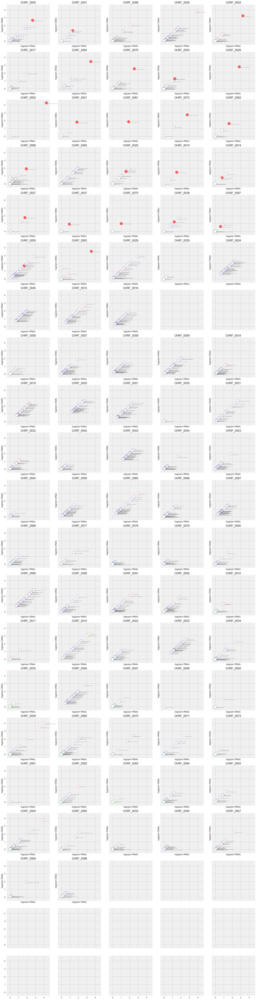

In [11]:
final_results = {}
top_microbes_file = open('./output/' + output_directory + '/top_microbes_by_patient.txt','w')

percent_represented_in_topX_RNA = []
percent_represented_in_topX_DNA = []

RNA_diversity = {}
DNA_diversity = {}

RNA_value = []
DNA_value = []
positive = []
pathogenic = []
virus = []
nrnt_model = []
groupid = []
microbe_id = []
microbe_id_genus = []
patient_id = []
ranks = []
nt_genusz_dna = []
nt_genusz_rna = []

RNA_value_test = []
DNA_value_test = []
positive_test = []
pathogenic_test = []
virus_test = []
nrnt_model_test = []
test_files = []

sensitivity_analysis_results = {}

cultured_fill = ['none',]
cultured_colors = ['blue','red']

fig, axarr = plt.subplots(21,5, figsize=(20, 92), sharex=True, sharey=True)#, facecolor='white')

row = 0
col = 0

f = open('./output/' + output_directory + '/raw_data_pathogen_scoring.txt','w')
do_not_continue = False
ranks_from_culture = {}

list_of_files = list(bacterial.keys())
prev_sample_tc = 0

for i in ordered_list_of_files:   # loop through all files
    print(i)

    sample_id = i.split('/')[-1].split('.')[0].upper()
    metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]   
    
    tc = true_classification.loc[[sample_id],:]['effective_group'][0]   # set group ID
    ranks_from_culture[i] = []

    if tc == 1 or tc == 4 or tc ==3 or tc ==2 or tc == 5:

        if(not do_not_continue):
            
            # this modifies the scatterplot point shape based on the group, 
            # currently setting all to circles
            group = 'o'  
            
            # in the plot of log(RNA rpM) x log(DNA rpM) we want to divide into sections based 
            # on sample adjuciation - all samples from Group 1 are grouped together, followed by 
            # all samples in G2, etc. This section creates a new line whenever the group switches.
            if tc == 1 and prev_sample_tc < tc:
                print('hi')
            if tc == 2 and prev_sample_tc < tc:
                row += 1
                col = 0
            if tc == 3 and prev_sample_tc < tc:
                row += 1
                col = 0
            if tc == 4 and prev_sample_tc < tc:
                row +=1 # 0
                col = 0

            bac = full[i] 

            if(bac.shape[0] > 0):
                bac = bac.reset_index()
                
                # sort the operating matrix by column RPM
                bac.sort_values(by='genus_NT_rpm RNA', inplace=True, ascending=False)   
                bac = bac.reset_index() #reindex([i for i in range(len(bac.index))])
                
                # Keep track of the percent of all microbial rpM that are represented in the 
                # top 15 microbes. This threshold was selected based on the fact that all 
                # culture-identified microbes were present w/in the top 15. Here we quantify
                # the total % microbial represnted by this subset.
                try:
                    percent_represented_in_topX_DNA.append(bac.head(n=topX)['genus_NT_rpm DNA']
                                                           .sum()/bac['genus_genus_NT_rpm DNA'].sum())
                except:
                    print("could not append DNA % in top 15")
                try:
                    percent_represented_in_topX_RNA.append(bac.head(n=topX)['genus_NT_rpm RNA']
                                                           .sum()/bac['genus_NT_rpm RNA'].sum())
                except:
                    print("could not append RNA % in top 15")
                
                # topX allows us to select the top N microbes (15 for the purpose of the study)
                bac = bac.head(n=topX) 
                print(bac)
                
                bac['genus_NT_rpm DNA scaled'] = (bac['genus_NT_rpm DNA']
                                                 /bac['genus_NT_rpm DNA'].sum())
                bac['genus_NT_rpm RNA scaled'] = (bac['genus_NT_rpm RNA']
                                                 /bac['genus_NT_rpm RNA'].sum())              
                bac.fillna(0)
                
                DNA_diversity[i.split('/')[4].split('.')[0]] = (1- simpson_di(dict(bac['genus_NT_rpm DNA'])))
                RNA_diversity[i.split('/')[4].split('.')[0]] = (1- simpson_di(dict(bac['genus_NT_rpm RNA'])))
                
                
                # this outputs the full topX microbes (DNA and RNA data) to .txt file .
                top_microbes_file = open('./output/' + output_directory + 
                                         '/top_microbes_by_patient.txt','a')
                top_microbes_file.write("\n----\n" + i + "\n\n")
                top_microbes_file.close()
                top_microbes_file = open('./output/' + output_directory + 
                                         '/top_microbes_by_patient.txt','a')
                bac.to_csv('./output/' + output_directory + 
                           '/top_microbes_by_patient.txt', sep='\t', mode='a')
                top_microbes_file.write("\n\n")
                top_microbes_file.close()
                
                grew_in_culture = []   # fill color
                is_pathogen = []       # edge color
                is_virus = []          # shape (square = virus, circle = bacteria/fungi)
                nrnt_pointsize = []    # NO LONGER APPLICABLE

                bac = bac.dropna(axis=0, how='all')

                rank_number_identified = 0
                for n in bac.index:
                    rank_number_identified += 1   # increment with each microbe

                    
                    # implementing a heuristic for assigning most likely 
                    # species to genus-level rpM
                    curr_genus = bac.loc[n]['name_x']    # default is DNA species...
                    species_colID = 'name_x'
                    
                    # ...but if RNA rM is greater, then set curr_genus to the RNA species
                    if bac.loc[n]['genus_NT_rpm DNA'] < bac.loc[n]['genus_NT_rpm RNA']:   
                        curr_genus = bac.loc[n]['name_y']
                        species_colID = 'name_y'

                    # TODO: Could remove this section - 
                    # no longer looking at NR:NT ratio for this paper
                    # if(with_nrnt_concordance):
                    if(True):
                        # get the genus to use as a tag for finding the concordance
                        #g = ' '.join(bac.loc[n]['genus_taxid'].split(' ')[0:-3])   
                        g = bac.loc[n]['genus_taxid'] 
                        try:
                            # try to append the NRNT point size
                            nrnt_pointsize.append(float(nrnt_values.loc[g]['prop'])) 
                            print("WEIRD...NRNT WAS FOUND: " + str(g))
                        except:   # if the NRNT value can't be found, just append zero...
                            # ...  cases in which it can't be found are when rM is extremely low
                            nrnt_pointsize.append(1)  #NO NRNT POINT SIZE

                    #
                    # set the facecolor of points based on classificaiton of microbe. Overall... 
                    # blue = non-pathogenic bacteria/fungi
                    # green = non-pathogenic virus
                    # red = pathogenic (bacteria, virus, or fungi)
                    #
                    
                    set_color = "darkblue"     # default blue
                    if (curr_genus in list_of_viruses_in_dictionary) or ('irus' in str(curr_genus)):  #if genus is any virus, green
                        set_color = "green"
                        is_virus.append("green")   
                    else:
                        is_virus.append('none')
                    # set red if pathogen, regardless of whether it was previously 
                    # set to green for "virus"; this means that viruses on list of pathogens
                    # will appear red, not green.

                    try:
                        if (curr_genus in full_respiratory_microbes_list) or (curr_genus.split(' ')[0] in full_respiratory_microbes_list):  
                            set_color = "red"
                    except:
                        if (curr_genus in full_respiratory_microbes_list):
                            set_color = "red"
                    
                    # to the vector of pathogenicity, append the color; red == pathogen
                    is_pathogen.append(set_color)  # "red") ADDED 7/6 to make all microbes "pathogens" 

                    
                    #
                    # set the fill color based on whether the microbe grew in culture
                    # colors are consistent with the outline colors when grew_in_culture is true,
                    # otherwise fill color is empty
                    # 
                    
                    #'''
                    if (tc == 1 or tc==2) and not (isinstance((metadata.loc[metadata_id]['organism']), float)): # this grew in culture
                        if bac.loc[n]['Species_Assignment'] in list(metadata.loc[metadata_id]['organism'].split(',')):      
                            ranks_from_culture[i].append(rank_number_identified)
                            grew_in_culture.append(set_color) 
                            #elif len(bac.loc[n]['Species_Assignment']) == 1 and sum([bac.loc[n]['Species_Assignment'] in i for i in list(metadata.loc[metadata_id]['organism'].split(','))]) > 0:
                            #ranks_from_culture[i].append(rank_number_identified)
                            #grew_in_culture.append(set_color) 
                        else:
                            grew_in_culture.append('white')     # this did not grow in culture
                    else:
                        #'''
                        # this was not in G1 or G2, therefore did not grow in culture 
                        grew_in_culture.append('white')    
                        
                    g = bac.loc[n]['genus_taxid']   # genus-level microbe ID
                    

                #
                # make plot of all microbes, split by individuals, weighted by nrnt concordance 
                #
        
                # this defines the plot structure - 5 columns, up to 21 rows 
                # (bc we have 100 samples)
                if row < 21 and col < 5: 
                
                    correct_species_names = []
                
                    # plot viruses a different shape
                    bac['is_pathogen'] = is_pathogen
                    bac['grew_in_culture'] = grew_in_culture
                    bac['nrnt_pointsize'] = nrnt_pointsize
                    bacv = bac[bac['category_name']=="Viruses"] 
                    baco = bac[bac['category_name']!="Viruses"] 
                    
                    
                    
                    axarr[row,col].scatter(np.log10((baco['genus_NT_rpm RNA']+1)),  
                           np.log10((baco['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=baco['is_pathogen'], 
                           facecolor = baco['grew_in_culture'], 
                           marker='o', s =[max(j*200,20) for j in baco['nrnt_pointsize']]) 
                           #,linewidth='1.2' )
                    axarr[row,col].scatter(np.log10((bacv['genus_NT_rpm RNA']+1)),  
                           np.log10((bacv['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=bacv['is_pathogen'], 
                           facecolor = bacv['grew_in_culture'], 
                           marker='s', s =[max(j*200,20) for j in bacv['nrnt_pointsize']]) 
                           #,linewidth='1.2' )

                    
                    '''
                    plt.scatter(np.log10((baco['genus_NT_rpm RNA']+1)),  
                           np.log10((baco['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=bacv['is_pathogen'], 
                           facecolor = baco['grew_in_culture'], 
                           marker='o', s =[max(j*200,20) for j in baco['nrnt_pointsize']] )
                    plt.show()
                    '''
                    
                    
                    # loop through microbes and annotate the scatterplot with text 
                    for n in bac.index:
                        curr_genus = bac.loc[n]['name_x']    # default is DNA species...
                        species_colID = 'name_x'
                        # ... but if RNA rM is greater, then curr_genus is the rna genus
                        if bac.loc[n]['genus_NT_rpm DNA'] < bac.loc[n]['genus_NT_rpm RNA']:    
                            curr_genus = bac.loc[n]['name_y']
                            species_colID = 'name_y'
                        #'''    
                        # annotate
                        axarr[row,col].annotate(bac.loc[n][species_colID], 
                                         (np.log10((bac.loc[n]['genus_NT_rpm RNA']+1)) + .1, 
                                         np.log10((bac.loc[n]['genus_NT_rpm DNA']+1)) - .1),
                                         fontsize=4, color='grey') 
                        
                        #'''
                        correct_species_names.append(bac.loc[n][species_colID])
                    

                    # set axis parameters and labels
                    #axarr[row,col].set_title(
                    #    'TA-'+i.split('/')[5].split('.')[0].split('-')[1], fontsize=14)
                    axarr[row,col].set_title(metadata_id, fontsize=14)
                    axarr[row,col].set_xticks(np.arange(0,4.5,1))
                    axarr[row,col].set_yticks(np.arange(0,4.5,1))
                    axarr[row,col].set_xlabel('log(rpm RNA)')
                    axarr[row,col].set_ylabel('log(rpm DNA)')
                    
                    #axarr[row,col].set_facecolor('white')

                    # if you have reached the last column of subplots, 
                    # move to the next row in subplot grid
                    if col == 4:
                        row += 1
                        col = 0
                    else:
                        col += 1

                    #
                    # CALCULATE/STRUCTURE VALUES TO BE PUT INTO LOGISTIC REGRESSION:
                    #
                       
                    #for sensitivity analysis with real model 
                    RNA_value = RNA_value + list(np.log10((bac['genus_NT_rpm RNA']+1)))  
                    DNA_value = DNA_value + list(np.log10((bac['genus_NT_rpm DNA']+1)))  
                    positive = positive + grew_in_culture
                    pathogenic = pathogenic + is_pathogen
                    virus = virus + is_virus
                    nrnt_model = nrnt_model + nrnt_pointsize
                    groupid = groupid + [tc for l in range(len(nrnt_pointsize))]
                    microbe_id = microbe_id  + correct_species_names
                    microbe_id_genus = microbe_id_genus + [bac['genus_taxid'][i] for 
                                                           i in range(len(bac['genus_taxid']))]
                    patient_id = patient_id + [i.split('/')[-1] for 
                                               l in range(len(nrnt_pointsize))]
                    nt_genusz_rna = nt_genusz_rna + list(bac['NT_zscore RNA'])
                    nt_genusz_dna = nt_genusz_dna + list(bac['NT_zscore DNA'])
                    ranks = ranks + [j for j in range(len(bac.index))]
                    
                    
            # bac.shape was < 1, so no microbes identified - fill these values with zero. 
            else:  
                
                if row < 21 and col < 5:  # no real data to plot
                    
                    # just set axis parameters and labels
                    #axarr[row,col].set_title(
                    #    'TA-'+i.split('/')[5].split('.')[0].split('-')[1], fontsize=14)
                    axarr[row,col].set_title(metadata_id, fontsize=14)
                    axarr[row,col].set_xticks(np.arange(0,4.5,1)) 
                    axarr[row,col].set_yticks(np.arange(0,4.5,1)) 
                    axarr[row,col].set_xlabel('log(rM RNA)')
                    axarr[row,col].set_ylabel('log(rM DNA)')
                    #axarr[row,col].set_axis_bgcolor('white')

                    # if you have reached the last column of subplots, 
                    # move to the next row in subplot grid
                    if col == 4:
                        row += 1
                        col = 0
                    else:
                        col += 1
                        
    else:
        print("Warning: what is going on??")
    prev_sample_tc = tc

plt.savefig('./output/' + output_directory + '/FigureS1.pdf', transparent=True)   # save figure to .pdf file

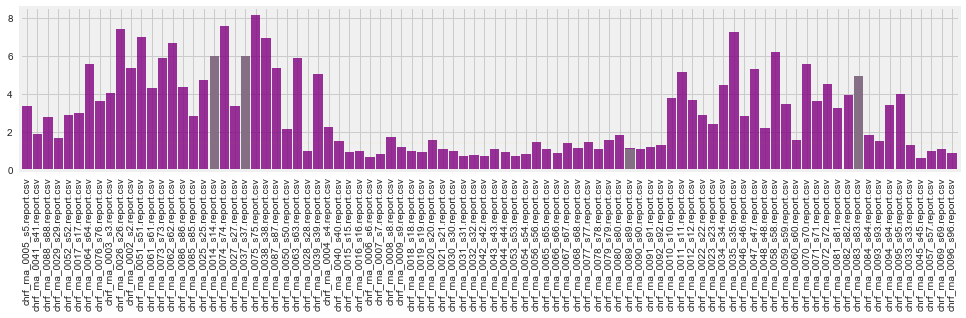

In [12]:
'''
rna_input = pd.read_csv(
    './data/' + data_directory +
    '/rna_input_070618.tsv',
    sep='\t',
    header=0,
    index_col=0)

'''
rna_input = metadata[['RNA_input', 'sample_name_RNA', 'effective_group']]
rna_input.index = list(metadata['sample_name_RNA'])
rna_input.dropna(inplace=True)

rna_input.index = [i.lower() + '.report.csv' for i in rna_input.index]
x = [i.split('/')[-1].split('.')[0]+'.report.csv' for i in list(ordered_list_of_files)]
rna_input = rna_input.loc[x]


# IMPUTE the RNA_input values for samples without reliable estimates.

rna_input_impute = rna_input.copy()
rna_input_impute['RNA_input'] = 0

unreliable_input = rna_input[rna_input['RNA_input']==0]
reliable_input = rna_input[rna_input['RNA_input']!=0]
for i in unreliable_input.index:
    eff_grp = rna_input.loc[i]['effective_group']
    imputed_input = reliable_input[reliable_input['effective_group'] == eff_grp]['RNA_input'].mean()
    rna_input_impute['RNA_input'][i] = imputed_input
    rna_input['RNA_input'][i] = imputed_input
    


# Plot the RNA input bargraph

plt.figure(figsize=(15,3))
log(rna_input['RNA_input']+1).plot(kind='bar',color='purple', width=.9, alpha = .8,figsize=(15,3))
log(rna_input_impute['RNA_input']+1).plot(kind='bar',color='gray', width=.9, alpha = .8,figsize=(15,3))
plt.axhline(y=1.4, linestyle=':', lw=.1, color='orange')
plt.savefig('./output/' + output_directory + '/rna_input_barplot.pdf' , bbox_inches='tight')


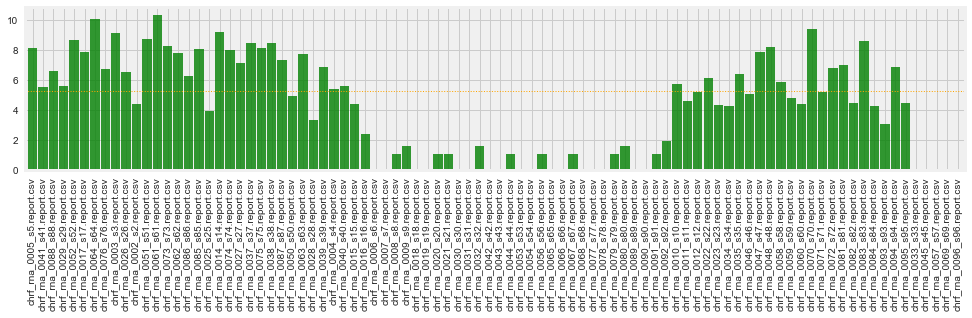

In [13]:
#print(metadata.columns)
tlc_input = metadata[['TLC (mm3)_RNA', 'sample_name_RNA', 'effective_group']]
tlc_input.index = list(metadata['sample_name_RNA'])
tlc_input.dropna(inplace=True)

tlc_input.index = [i.lower() + '.report.csv' for i in tlc_input.index]
x = [i.split('/')[-1].split('.')[0]+'.report.csv' for i in list(ordered_list_of_files)]
tlc_input = tlc_input.loc[x]


# IMPUTE the RNA_input values for samples without reliable estimates.

tlc_input_impute = tlc_input.copy()


# Plot the RNA input bargraph

plt.figure(figsize=(15,3))
log(tlc_input['TLC (mm3)_RNA']+1).plot(kind='bar',color='green', width=.9, alpha = .8,figsize=(15,3))
#log(tlc_input_impute['TLC (mm3)_RNA']+1).plot(kind='bar',color='gray', width=.9, alpha = .8,figsize=(15,3))
plt.axhline(y=log(200+1), linestyle=':', lw=1, color='orange')
plt.savefig('./output/' + output_directory + '/TLC_barplot.pdf' , bbox_inches='tight')


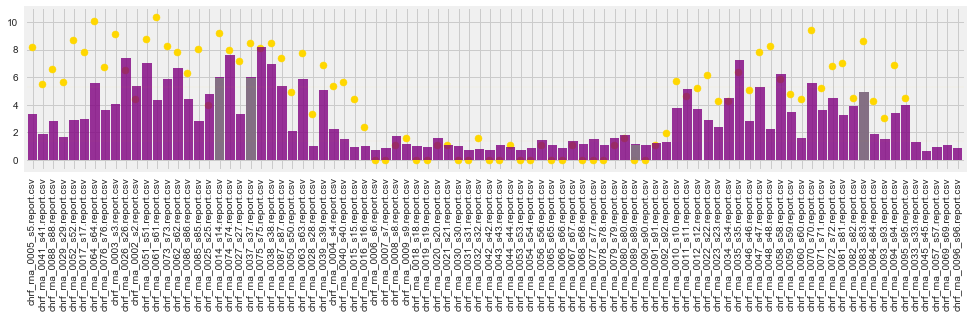

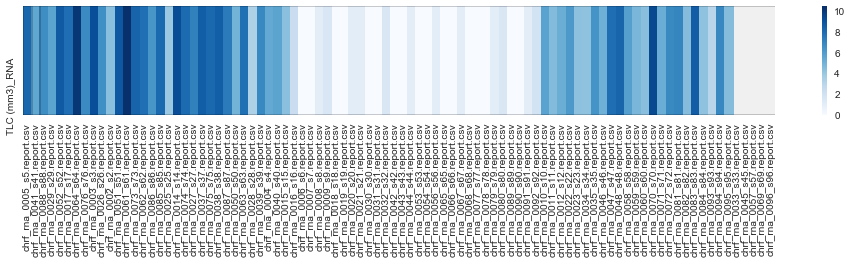

In [14]:
#log(rna_input['TLC (mm3)_RNA']+1).plot(color='green', alpha = .8,figsize=(15,3))#kind='line',color='green', width=.9, alpha = .8,figsize=(15,3))

plt.figure(figsize=(15,3))
log(rna_input['RNA_input']+1).plot(kind='bar',color='purple', width=.9, alpha = .8,figsize=(15,3))
plt.ylim=(0,12)
log(rna_input_impute['RNA_input']+1).plot(kind='bar',color='gray', width=.9, alpha = .8,figsize=(15,3))
plt.axhline(y=1.4, linestyle=':', lw=.1, color='orange')


plt.scatter([i-.1 for i in range(len(tlc_input['TLC (mm3)_RNA']))], log(tlc_input['TLC (mm3)_RNA']+1), color='gold')
plt.axhline(y=log(200+1), linestyle=':', lw=.1, color='gold')

plt.savefig('./output/' + output_directory + '/tlc_combo_barplot.pdf' , bbox_inches='tight')


plt.figure(figsize=(15,2))
ax = sns.heatmap(pd.DataFrame(log(tlc_input['TLC (mm3)_RNA']+1)).transpose(), cmap="Blues")#,cmap=cmap,vmin=0,vmax=12)#,row_colors='red')#,cbar=False)
ax.hlines([i for i in range(len(tlc_input.index))], *ax.get_xlim(),lw=.4)
ax.vlines([i for i in range(len(tlc_input.columns))], *ax.get_ylim(),lw=.4)
ax.tick_params(labelsize=10)
plt.savefig('./output/' + output_directory + '/tlc_combo_heatmap.pdf' , bbox_inches='tight')

In [15]:
log(tlc_input['TLC (mm3)_RNA']+1)

chrf_rna_0005_s5.report.csv      8.160804
chrf_rna_0041_s41.report.csv     5.525453
chrf_rna_0088_s88.report.csv     6.621406
chrf_rna_0029_s29.report.csv     5.638355
chrf_rna_0052_s52.report.csv     8.699681
chrf_rna_0017_s17.report.csv     7.863651
chrf_rna_0064_s64.report.csv    10.085851
chrf_rna_0076_s76.report.csv     6.758095
chrf_rna_0003_s3.report.csv      9.169623
chrf_rna_0026_s26.report.csv     6.552508
chrf_rna_0002_s2.report.csv      4.394449
chrf_rna_0051_s51.report.csv     8.779711
chrf_rna_0061_s61.report.csv    10.373522
chrf_rna_0073_s73.report.csv     8.294300
chrf_rna_0062_s62.report.csv     7.824446
chrf_rna_0086_s86.report.csv     6.311735
chrf_rna_0085_s85.report.csv     8.071219
chrf_rna_0025_s25.report.csv     3.970292
chrf_rna_0014_s14.report.csv     9.210440
chrf_rna_0074_s74.report.csv     8.006701
chrf_rna_0027_s27.report.csv     7.170888
chrf_rna_0037_s37.report.csv     8.517393
chrf_rna_0075_s75.report.csv     8.131825
chrf_rna_0038_s38.report.csv     8

The previous cell collected the % of total reads per million that were covered by the top N microbes, per patient on both RNA- and DNA-seq. This analysis presents statistics on the distribution of percent rpM represented.

# Set-up Data from LR and RB Models

> "For both models, microbes identified by clinician-ordered diagnostics in LRTI+C+M patients and all viruses with established respiratory pathogenicity, were considered pathogens (n=12 in derivation cohort and n=26 in validation cohort, Table S1). Any additional microbes identified by NGS were considered commensals (n = 155 in derivation cohort, n=174 in validation cohort)."

This code creates the main data structure that will be used to implement the rules-based and logistic regression models - a dataframe with one line per sample containing 
- RNAvalue
- DNAvalue
- groupID
- rank
- microbeID
- patient
- pathogenicity
- virus status
- and whether the microbe was identified in culture.

In [16]:
# Parse out the relevant features from Figure S1 - generated in main analysis above.
sensitivity_DF = pd.DataFrame.from_dict({'RNAvalue':RNA_value,
                                         'DNAvalue':DNA_value,
                                         'groupID':groupid,
                                         'positive':positive,
                                         'pathogenic':pathogenic,
                                         'nrnt':nrnt_model,
                                         'ranks':ranks,
                                         'virus':virus,
                                         'microbe':microbe_id,
                                         'microbe_genus':microbe_id_genus, 
                                         'patient':patient_id, 
                                         'nt_Z_rna':nt_genusz_rna,
                                         'nt_Z_dna':nt_genusz_dna}, orient='columns')

X = sensitivity_DF[['RNAvalue','DNAvalue','nrnt','groupID','ranks','microbe',
                    'patient','microbe_genus','nt_Z_rna','nt_Z_dna']]
X[['pathogenic_red']] = sensitivity_DF[['pathogenic']] == 'red'
X[['pathogenic_green']] = sensitivity_DF[['virus']] == 'green'
X[['pathogenic_darkblue']] = sensitivity_DF[['pathogenic']] == 'darkblue'
X['positive'] = sensitivity_DF[['positive']]!="white"#"none"

# Full training dataset
X.fillna(0,inplace=True)
Y = X[['positive']]
Y = Y['positive'].tolist()

# Separate out by group membership for training and analysis of True Positive / True Negative
X_g1 = X[X['groupID'] == 1]
print(X_g1.shape)
X_g2 = X[X['groupID'] == 2]
print(X_g2.shape)
X_g3 = X[X['groupID'] == 3]
print(X_g3.shape)
X_g4 = X[X['groupID'] == 4]
print(X_g4.shape)
X_g1g4 = pd.concat([X_g1, X_g4], axis=0)

# generate the outcome vectors based on whether microbe was identified by standard microbiology
Y_g1 = X_g1[['positive']]
Y_g1 = Y_g1['positive'].tolist()
Y_g2 = X_g2[['positive']]
Y_g2 = Y_g2['positive'].tolist()
Y_g3 = X_g3[['positive']]
Y_g3 = Y_g3['positive'].tolist()
Y_g4 = X_g4[['positive']]
Y_g4 = Y_g4['positive'].tolist()
Y_g1g4 = X_g1g4[['positive']]
Y_g1g4 = Y_g1g4['positive'].tolist()

X.to_csv('./output/' + output_directory + '/microbe_model_data.csv')  # save full dataset to .csv
X.head() # demo of training data

(373, 14)
(0, 14)
(282, 14)
(545, 14)


,RNAvalue,DNAvalue,nrnt,groupID,ranks,microbe,patient,microbe_genus,nt_Z_rna,nt_Z_dna,pathogenic_red,pathogenic_green,pathogenic_darkblue,positive
0,2.669224,2.669224,1,1,0,Enterobacter hormaechei,chrf_rna_0005_s5.csv,547,99.0,99.0,True,False,False,True
1,1.842609,1.842609,1,1,1,Lactobacillus crispatus,chrf_rna_0005_s5.csv,1578,17.7,17.7,False,False,True,False
2,1.613842,1.613842,1,1,2,Citrobacter freundii,chrf_rna_0005_s5.csv,544,99.0,99.0,False,False,True,False
3,0.857332,0.857332,1,1,3,Fusobacterium nucleatum,chrf_rna_0005_s5.csv,848,6.0,6.0,False,False,True,False
4,0.612784,0.612784,1,1,4,Pluralibacter gergoviae,chrf_rna_0005_s5.csv,1330546,59.8,59.8,False,False,True,False


In [17]:
# separate G1/G4 data further into training and test sets 
# these sample names were identified by random selection of host RNA-seq data based on RNA-seq batches.
X_g1_train = X_g1[X_g1['patient'].isin(training_sample_names)]
X_g4_train = X_g4[X_g4['patient'].isin(training_sample_names)]
X_g1g4_train = pd.concat([X_g1_train,X_g4_train])
Y_g1_train = X_g1_train['positive'].tolist()
Y_g4_train = X_g4_train['positive'].tolist()

X_g1_test = X_g1[~X_g1['patient'].isin(training_sample_names)]
X_g4_test = X_g4[~X_g4['patient'].isin(training_sample_names)]
X_g1g4_test = pd.concat([X_g1_test,X_g4_test])
Y_g1_test = X_g1_test['positive'].tolist()
Y_g4_test = X_g4_test['positive'].tolist()

print("Training data contains: " + str(X_g1g4_train.shape[0]) + 
      " total microbes from 20 patients (in the LRTI+C/+M and LRTI-NEG training set), of which " + 
      str(X_g1g4_train[X_g1g4_train['positive']==True].shape[0]) + 
      " microbes are considered POSITIVE (grew in culture).")
print("The test data contains: " + str(X_g1g4_test.shape[0]) + 
      " total microbes from all remaining patients in the validation cohort, of which " + 
      str(X_g1g4_test[X_g1g4_test['positive']==True].shape[0]) + 
      " microbes are considered POSITIVE (grew in culture).")

Training data contains: 0 total microbes from 20 patients (in the LRTI+C/+M and LRTI-NEG training set), of which 0 microbes are considered POSITIVE (grew in culture).
The test data contains: 918 total microbes from all remaining patients in the validation cohort, of which 23 microbes are considered POSITIVE (grew in culture).


## Execute Rules-Based Model (RBM) for distinguishing between 'pathogens' and 'commensals'

> "In the RBM, respiratory microbes from each patient were assigned an abundance score based on the sum of log(RNA-Seq) and log(DNA-Seq) genus reads per million (rpm) (Table S3). Microbes were then ranked by this score, and the largest differential between sequentially ranked taxa was used as a threshold to isolate the group of highest-scoring microbes within each patient (Fig2A, Fig S1). These high scoring microbes plus all RNA viruses detected at > 0.1 rpm were captured as putative pathogens by the RBM if present in an a. priori developed index of established lower respiratory pathogens derived from landmark surveillance studies and clinical guidelines (Table S2B)"

Plot the RNA x DNA projection for all microbes - those identified by the RBM are filled, those identified by standard clinical microbiology are red.

In [18]:


def get_split(list_of_values):  #returns the index
    splits = {}
    max_split = 0
    max_split_id = 0
    split_list = []
    for i in range(len(list_of_values)):
        if i == 0:
            splits[i] = 0
            split_list.append(0)
        else:
            splits[i] = -1 * (list_of_values[i] - list_of_values[i-1] )
            split_list.append(splits[i])

        if splits[i] > max_split:
            max_split = splits[i]
            max_split_id = i

    return max_split_id
def apply_rule_based_method_cluster(input_data, input_res, groupID, output_filename, title=None, annotate_plots=False,rbm_method_plot=False):

    rbm1_patient = []
    rbm1_genus = []
    rbm1_microbe = []

    s = int(np.round(len(set(input_data['patient']))/5)+1)

    if rbm_method_plot:
        fig, axarr = plt.subplots(s,5, figsize=(20, s*4), sharex=True, sharey=True)
        row = 0
        col = 0

    for i in list(set(input_data['patient'])):#[0:3]:
        new_adds = 0
        #print(i)

        sub = input_data[input_data['patient']==i]
        sub['rna+dna'] = sub['RNAvalue'] + sub['DNAvalue']
        sub.sort_values(by='rna+dna', ascending=False, inplace=True)

        #ADD POTENTIAL BACTERIAL MICROBES
        subB = sub[sub['pathogenic_green'] == False] #cannot be a virus

        size_of_top_clust = get_split(list(subB['rna+dna']))
        # this was added on 12/28 to deal with cases in which only 1 bacterial microbe is present
        if(size_of_top_clust < 1):
            size_of_top_clust = 1 # there should always be at least 1 microbe in top cluster (if only 1 microbe present)


        ## NEW PLOTTING FUNCTION 2/1
        #plt.figure(figsize=[3,3])
        if rbm_method_plot:
            axarr[row,col].scatter([i for i in range(len(subB['rna+dna']))],subB['rna+dna'],color=[['darkblue','red'][int(i)] for i in subB['pathogenic_red']])
            axarr[row,col].axvline(x=size_of_top_clust - .5, color='r', linestyle='-',lw=.4)
            axarr[row,col].set_title(i)
            axarr[row,col].set_xlim(-1,15)
            axarr[row,col].set_ylim(-1,12)
            axarr[row,col].set_xticks(np.arange(0,15,1)) #MODS 2/1
            axarr[row,col].set_yticks(np.arange(0,12,1)) #MODS 2/1
            for l in range(len(subB.index)):
                axarr[row,col].annotate(subB.iloc[l]['microbe'],(l + .1,subB.iloc[l]['rna+dna']-.1),
                                 fontsize=8, color='grey')
            if col == 4:
                row += 1
                col = 0
            else:
                col += 1


        #print(size_of_top_clust)
        top = subB.head(n=size_of_top_clust)
        top = top[top['pathogenic_red'] == True]
        #print(top)
        for j in range(len(top.index)):
            rbm1_genus.append(str(top['microbe_genus'].iloc[j]))
            rbm1_microbe.append(str(top['microbe'].iloc[j]))
            new_adds += 1

        possible_viruses = sub[[(sub.loc[j]['pathogenic_green'] == True and sub.loc[j]['pathogenic_red'] == True) for j in sub.index]]
        possible_viruses = possible_viruses[possible_viruses['RNAvalue'] > np.log10(.1 + 1)] # RNAvalue is log10(RNA rpm + 1), and we want to keep viruses with rpm > .1
        if(len(possible_viruses.index) > 0):
            res = possible_viruses.head(n=1)
            for j in range(len(res.index)):
                rbm1_genus.append(str(res['microbe_genus'].iloc[j]))
                rbm1_microbe.append(str(res['microbe'].iloc[j]))
                new_adds += 1

        rbm1_patient = rbm1_patient + [i for n in range(new_adds)]

    rbm_g1 = pd.DataFrame.from_dict({'microbe': rbm1_microbe,'patient':rbm1_patient,'microbe_genus':rbm1_genus})
    rbm_g1.drop_duplicates(inplace=True)

    if groupID == 2:
        c = ['blue','blue']
    else:
        c = ['blue','red']

    if rbm_method_plot:
        plt.savefig(output_filename+"_methodplot.pdf")
        plt.show()

    #print([c[int(i)] for i in input_res])

    plt.figure(figsize=[8,8])
    a = [rbm_g1.iloc[i]['microbe'] + "-" + str(rbm_g1.iloc[i]['patient']) for i in range(len(rbm_g1))]
    match = [(str(input_data.iloc[i]['microbe']) + "-" + input_data.iloc[i]['patient'] in a) for i in range(len(input_data.index))]
    plt.scatter(input_data['RNAvalue'],input_data['DNAvalue'],
               edgecolor=[c[int(input_data.loc[i]['positive'])]
                       if input_data[input_data['patient'] == input_data.loc[i]['patient']]['positive'].sum() < 2
                       or c[int(input_data.loc[i]['positive'])] == 'blue'
                       or input_data.loc[i]['RNAvalue'] == max(input_data[(input_data.patient == input_data.loc[i]['patient']) & (input_data.positive == True)]['RNAvalue'])
                       else 'orange' for i in input_data.index],
                s=[85 if match[i] == 1 else 50 for i in range(len(match)) ],#linewidth='1.2',
                facecolor = [c[input_res[i]] if match[i] == 1 else 'white' for i in range(len(match)) ], alpha=.7)
                #facecolor=[c[int(Y_g2[i])] if predicted[:,1][i] > probability_threshold else 'white' for i in range(len(Y_g2)) ],alpha=.6) #s=predicted[:,1]*200
    
    if(annotate_plots):
        for i in range(len(input_res)):
            #if(predicted[:,1][i] > probability_threshold):
            if input_res[i] or match[i] == 1: #if the microbe was True in input_res
                try:
                    sp = input_data.iloc[i]['microbe'].split(' ')
                except:
                    sp = 'NA'
                pa = input_data.iloc[i]['patient'].split('-')[1]
                plt.annotate(sp[0][0] + '. ' + sp[1] + ' - ' + pa,(input_data.iloc[i]['RNAvalue'] + .1,input_data.iloc[i]['DNAvalue']-.1),
                             fontsize=5, color='grey')

    #plt.xlim((-.2, 5.5))
    #plt.ylim((-.2, 5.5))
    if not title == None:
        plt.title(title)
    else:
        plt.title("Group " + str(groupID) + " - Rule Based Method")
    #plt.axis((-1,12,-1,12))
    plt.xlabel('log( RNA rpM )' )
    plt.ylabel('log( DNA rpM )' )
    plt.savefig(output_filename + ".pdf")

    return rbm_g1

Group 1 RBM Results:


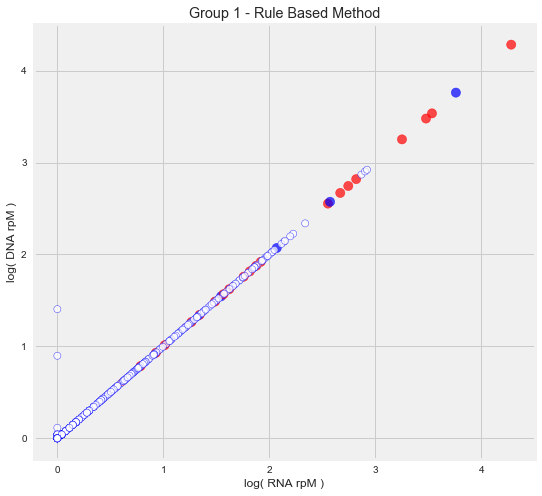

Group 2 RBM Results:


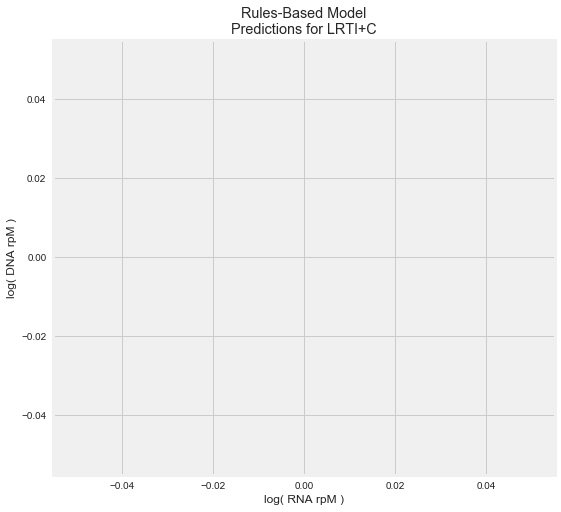

Group 3 RBM Results:


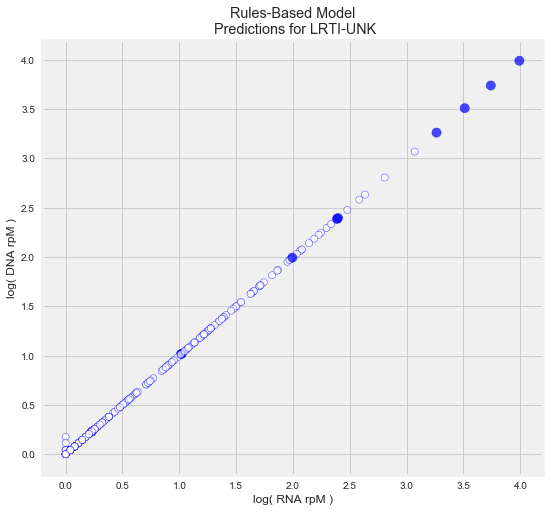

Group 4 RBM Results:


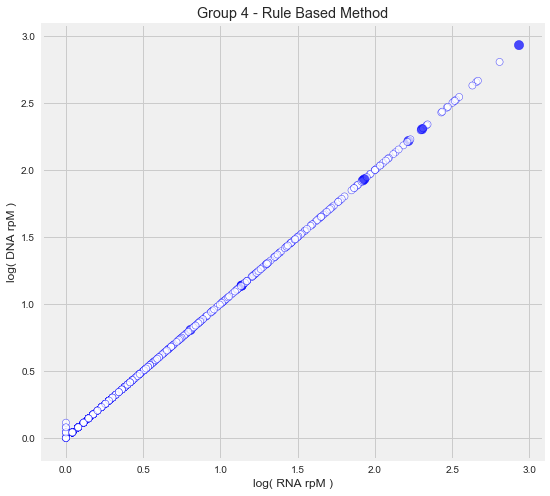

'\n# Evaluate RBM sensitivity against culture results\n# NOTE: this sensitivity calculation is at the per-patient level (as opposed to per-microbe); \n# OUTDATED.\nprint("Group 1 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g1,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 2 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g2,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 3 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g3,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 4 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g4,list_of_files, metadata, \n    true_classification, full, output_directory)\n'

In [19]:
annotate_plots = False # do not want to write microbe names on the plots

# run RBM on Group 1 and Group 4 to generate the combined prediction Figure 2A
# We don't care about training and test sets in the RBM because each sample is 
# processed entirely independently

print("Group 1 RBM Results:") # Group 1 Only
rbm_g1 = apply_rule_based_method_cluster(X_g1, 
                                                            Y_g1, 
                                                            1, 
                                                            './output/' + output_directory +
                                                            '/rbm_1', 
                                                            rbm_method_plot=False)
rbm_g1.to_csv('./output/' + output_directory + '/RBM_G1.csv')
plt.show()

print("Group 2 RBM Results:") # Group 2 Only
rbm_g2 = apply_rule_based_method_cluster(
    X_g2, 
    Y_g2,
    2,
    './output/' + output_directory + '/FigureS3A',
    title="Rules-Based Model\n Predictions for LRTI+C ",
    rbm_method_plot=False)
rbm_g2.to_csv('./output/' + output_directory + '/RBM_G2.csv')
plt.show()

print("Group 3 RBM Results:") # Group 3 Only
rbm_g3 = apply_rule_based_method_cluster(
    X_g3,                                                         
    Y_g3, 
    3, 
    './output/' + output_directory + '/FigureS3C', 
    title="Rules-Based Model\n Predictions for LRTI-UNK", 
    rbm_method_plot=False)
rbm_g3.to_csv('./output/' + output_directory + '/RBM_G3.csv')
plt.show()

print("Group 4 RBM Results:") # Group 4 Only
rbm_g4 = apply_rule_based_method_cluster(
    X_g4, 
    Y_g4, 
    4, 
    './output/' + output_directory + '/rbm_4', 
    rbm_method_plot=False)
rbm_g4.to_csv('./output/' + output_directory + '/RBM_G4.csv')
plt.show()

# rbm_g1 - rbm_g4 results are saved and appended to output TableS3.

'''
# Evaluate RBM sensitivity against culture results
# NOTE: this sensitivity calculation is at the per-patient level (as opposed to per-microbe); 
# OUTDATED.
print("Group 1 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g1,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 2 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g2,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 3 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g3,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 4 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g4,list_of_files, metadata, 
    true_classification, full, output_directory)
'''

# Train and Evaluate Logistic Regression Model (LRM) 

First, for distinguishing between 'pathogens' and 'commensals'; then, for separating LRTI+C+M and no-LRTI patients.

> "We thus employed machine learning to distinguish respiratory pathogens from commensals using a logistic regression model (LRM) trained on microbes detected in derivation cohort patients using the predictor variables of: RNA-Seq rpm, DNA-Seq rpm, rank by RNA-Seq rpm, established LRTI pathogen (yes/no), and virus (yes/no). These features were selected to preferentially favor highly abundant organisms with established pathogenicity in the lung, but still permit detection of uncommon taxa that could represent putative pathogens. "

# Training v. Test Set - LR Analysis 

## Assess Model Stability:
Run LR model for 1000 rounds of cross-validation within the Derivation Cohort, further splitting the data intoa training set = 70% and test set = 30% at each iteration.

> "To evaluate LRM performance, we first performed 1000 rounds of cross-validation in which we randomly sub-divided the derivation cohort into training (70%) and test (30%) sets during each round, which yielded an average AUC of 0.93 +/- 0.08 standard deviations."

### Pathogen v. Commensal LRM model applied to Test Set and LRTI+C and unk-LRTI patient groups

> "We found that both the RBM and the LRM identified previously occult putative pathogens in patients with clinically adjudicated LRTI but negative microbiologic testing (LRTI+C), as well as new potential co-infecting pathogens in the LRTI+C+M subjects (Figs 3, S2, Table S3). Putative new pathogens were identified in 21 (62%) of LRTI+C subjects using the RBM, and 21 (62%) via the LRM (Fig S2, Table S3). Both methods enabled a microbiologic diagnosis in a greater number of LRTI-positive subjects compared to clinician-ordered diagnostics (78% vs 43% for both RBM  and LRM (p < 1.00 x10-4 by McNemar's test, respectively) (Fig 3)."

How to interpret the following plots:
- IF THE EDGE IS RED, it was identified in culture (and should be filled in, true positive)
- IF a red edge is not filled in, then it is a false negative.
- IF an edge is blue, then it was not identified in culture (and should not be filled in, true negative)
- IF a blue circle is filled in then it is a false positive.

'\n\n# unk-LRTI PREDICTIONS\npredicted = lr.predict_proba(X_g3[training_variables]) \nplt.figure(figsize=[8,8])\nplt.scatter(X_g3[\'RNAvalue\'],X_g3[\'DNAvalue\'],\n            edgecolor=[c[int(i)] for i in Y_g3],\n            s=[max(i*200,20) for i in predicted[:,1]],\n            #linewidth=\'1.2\',\n            facecolor=[c[int(Y_g3[i])] if predicted[:,1][i] > \n                       PROBABILITY_THRESHOLD else \'none\' for i in range(len(Y_g3)) ],\n            alpha=.6)\nxlim((-.2, 4.5))\nylim((-.2, 4.5))\nif(annotate_plots):\n    for i in range(len(Y_g3)):\n        if True:\n            try:\n                sp = X_g3.iloc[i][\'microbe\'].split(\' \')\n            except: \n                sp = \'NA\'\n            pa = X_g3.iloc[i][\'patient\'].split(\'-\')[1]\n            plt.annotate(sp[0][0] + \'. \' + sp[1] + \' - \' + pa,\n                         (X_g3.iloc[i][\'RNAvalue\'] + .1,\n                          X_g3.iloc[i][\'DNAvalue\']-.1), \n                         fontsize=7

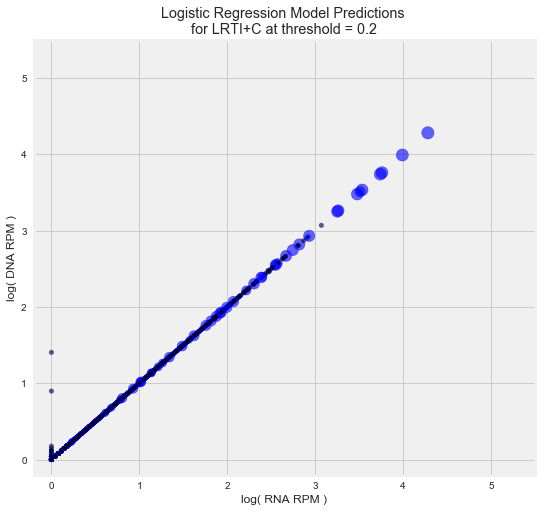

In [20]:
# PLOT THE WEIGHTED PROJECTION OF EACH GROUP'S MICROBES 
# (WEIGHTED by THE PROBABILITY OUTPUT BY LINEAR MODEL)

'''

# create fresh linear model; large C to run non-regularized regression
lr = linear_model.LogisticRegression(C=1000000)
training_variables = ['RNAvalue','DNAvalue','pathogenic_red','pathogenic_green','ranks']

# Train on all Group 1 and Group 4 patients
lr = lr.fit(X_combo[training_variables],Y_combo)

print("LRM Model Coefficients for final pathogen v. commensal trained model:")
print(training_variables)
print(lr.coef_)

# save the combined model to a pickle file 
pickle.dump(lr, open('./output/' + output_directory + '/mBAL_g1g4combo_logRegModel', 'wb'))  

'''

#lr = pickle.load( open( "/Users/kkalantar/Documents/Research/MBAL/miniBAL_study/output/042618/mBAL_g1g4combo_logRegModel", "rb" ) )
lr = pickle.load( open( "/Users/kkalantar/Documents/Research/MBAL/miniBAL_study/output/071918_RNA/mBAL_g1g4combo_logRegModel", "rb" ) )
training_variables = ['RNAvalue','pathogenic_red','ranks'] #'DNAvalue','pathogenic_green',
PROBABILITY_THRESHOLD = .2 #7 #.36 #.2

#
# TRAIN ON ALL TEST SAMPLES FOR BOTH PATHOGEN V. COMMENSAL MODEL AND PATIENT MICROBE MODEL
#

c = ['blue','red'] # for G1 and G4 projection plot 
                   # (where some microbes were identified by clinical microbiology)
c2 = ['blue','red'] # for G2 and G3 projection pplots



annotate_plots = False 
c = ['blue','blue']

# Plot predicted probabilities for group 2 patients' microbes
predicted = lr.predict_proba(X[training_variables])
plt.figure(figsize=[8,8])
plt.scatter(X['RNAvalue'],X['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y)) ],
            alpha=.6) 

xlim((-.2, 5.5))
ylim((-.2, 5.5))
if(annotate_plots):
    for i in range(len(Y)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X.iloc[i]['RNAvalue'] + .1,X.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')     
plt.title("Logistic Regression Model Predictions \nfor LRTI+C at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3B.pdf')
patient_by_microbe_predicted_g2 = pd.DataFrame.from_dict({
    'microbe':[X.iloc[i]['microbe'] for i in range(len(Y))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X.iloc[i]['patient'] for i in range(len(Y))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X.iloc[i]['microbe_genus'] for i in range(len(Y)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})

# append the group 2 pathogen v. commensal model to the original data matrix
X['score'] = predicted[:,1]


'''
# establish the test set
X_g1g4_test = pd.concat([X_g1_test,X_g4_test])
Y_g1g4_test = list(X_g1g4_test['positive'])

print("\n # of Pathogens v. Commensals in Training and Test sets, respectively:")
print(Counter(Y_combo['positive']))
print(Counter(Y_g1g4_test))

# Plot predicted probabilities for group 1 TEST SET patients' microbes
predicted = lr.predict_proba(X_g1g4_test[training_variables])
X_g1g4_test['score'] = predicted[:,1]  # append the predicted probabilities to the data matrix

# PLOT: RNA v. DNA plot with microbes shown with probabilities.
plt.figure(figsize=[8,8])

# visualize the test set in RNA rM by DNA rM space;
plt.scatter(X_g1g4_test['RNAvalue'],
            X_g1g4_test['DNAvalue'],
            edgecolor=[c[int(X_g1g4_test.loc[i]['positive'])] 
                       if X_g1g4_test[X_g1g4_test['patient'] == 
                                      X_g1g4_test.loc[i]['patient']]['positive'].sum() < 2 
                       or c[int(X_g1g4_test.loc[i]['positive'])] == 'blue' 
                       or X_g1g4_test.loc[i]['score'] == max(
                           X_g1g4_test[(X_g1g4_test.patient == X_g1g4_test.loc[i]['patient']) 
                                       & (X_g1g4_test.positive == True)]['score']) 
                       else 'orange' for i in X_g1g4_test.index],
            s=[max(i*600,3) for i in X_g1g4_test['score']],
            linewidth='1.2',
            facecolor=[c[int(Y_g1g4_test[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g1g4_test)) ],
            alpha=.7) 

# add the scatterplot of predicted TRAINING microbes in RNA rM by DNA rM space;
plt.scatter(X_combo['RNAvalue'],
            X_combo['DNAvalue'],
            edgecolor=[c[int(X_combo.loc[i]['positive'])] 
                       if X_combo[X_combo['patient'] == 
                                  X_combo.loc[i]['patient']]['positive'].sum() < 2 
                       or c[int(X_combo.loc[i]['positive'])] == 'blue' 
                       or X_combo.loc[i]['score'] == max(
                           X_combo[(X_combo.patient == X_combo.loc[i]['patient'])
                                   & (X_combo.positive == True)]['score']) 
                       else 'orange' for i in X_combo.index],
            s=[max(i*600,3) for i in X_combo['score']],
            linewidth='1.2',
            facecolor=[c2[int(X_combo.iloc[i]['positive'])] if X_combo.iloc[i]['score'] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(X_combo['positive'])) ],
            alpha=.4)

xlim((-.2, 4.5))
ylim((-.2, 4.5))
plt.title(
    "Logistic Regression Model Predictions \nfor LRTI+C/M and LRTI-NEG at probability score threshold = " + 
    str(PROBABILITY_THRESHOLD))
plt.xlabel("log( RNA rpM )")
plt.ylabel("log( DNA rpM )")
plt.savefig('./output/' + output_directory + '/Figure2D.pdf')

if(annotate_plots):
    for i in range(len(Y_g1g4_test)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X_g1g4_test.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X_g1g4_test.iloc[i]['RNAvalue'] +
                          .1,X_g1g4_test.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, color='grey')     
    
plt.show()


# save the predicted probabilities for each microbe to write to file downstream
patient_by_microbe_predicted_g1g4_test = pd.DataFrame.from_dict({
    'microbe': [X_g1g4_test.iloc[i]['microbe'] for i in range(len(Y_g1g4_test))
         if predicted[:,1][i] > PROBABILITY_THRESHOLD ],
    'patient':[X_g1g4_test.iloc[i]['patient'] for i in range(len(Y_g1g4_test))
               if predicted[:,1][i] > PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g1g4_test.iloc[i]['microbe_genus'] for
                     i in range(len(Y_g1g4_test))if predicted[:,1][i] > 
                                   PROBABILITY_THRESHOLD ]})

print("\n\n")
'''

#
# Predictions for Group 2 (LRTI+C) and Group 3 (unk-LRTI) patients
#

# LRTI+C PREDICTIONS

'''
annotate_plots = False 
c = ['blue','blue']

# Plot predicted probabilities for group 2 patients' microbes
predicted = lr.predict_proba(X_g2[training_variables])
plt.figure(figsize=[8,8])
plt.scatter(X_g2['RNAvalue'],X_g2['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y_g2],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y_g2[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g2)) ],
            alpha=.6) 

xlim((-.2, 5.5))
ylim((-.2, 5.5))
if(annotate_plots):
    for i in range(len(Y_g2)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X_g2.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X_g2.iloc[i]['RNAvalue'] + .1,X_g2.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')     
plt.title("Logistic Regression Model Predictions \nfor LRTI+C at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3B.pdf')
patient_by_microbe_predicted_g2 = pd.DataFrame.from_dict({
    'microbe':[X_g2.iloc[i]['microbe'] for i in range(len(Y_g2))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X_g2.iloc[i]['patient'] for i in range(len(Y_g2))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g2.iloc[i]['microbe_genus'] for i in range(len(Y_g2)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})

# append the group 2 pathogen v. commensal model to the original data matrix
X_g2['score'] = predicted[:,1]
'''


'''

# unk-LRTI PREDICTIONS
predicted = lr.predict_proba(X_g3[training_variables]) 
plt.figure(figsize=[8,8])
plt.scatter(X_g3['RNAvalue'],X_g3['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y_g3],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y_g3[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g3)) ],
            alpha=.6)
xlim((-.2, 4.5))
ylim((-.2, 4.5))
if(annotate_plots):
    for i in range(len(Y_g3)):
        if True:
            try:
                sp = X_g3.iloc[i]['microbe'].split(' ')
            except: 
                sp = 'NA'
            pa = X_g3.iloc[i]['patient'].split('-')[1]
            plt.annotate(sp[0][0] + '. ' + sp[1] + ' - ' + pa,
                         (X_g3.iloc[i]['RNAvalue'] + .1,
                          X_g3.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')  
plt.title("Logistic Regression Model Predictions \nfor LRTI-UNK at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3D.pdf')
patient_by_microbe_predicted_g3 = pd.DataFrame.from_dict({
    'microbe':[X_g3.iloc[i]['microbe'] for i in range(len(Y_g3))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X_g3.iloc[i]['patient'] for i in range(len(Y_g3))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g3.iloc[i]['microbe_genus'] for i in range(len(Y_g3)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})
X_g3['score'] = predicted[:,1]

'''




In [21]:
#print(lr.coef_)
print(dict(zip(['RNAvalue','pathogenic_red','ranks'],lr.coef_[0]))) #'DNAvalue','pathogenic_green',

{'RNAvalue': 0.39684791245504575, 'pathogenic_red': 3.320453453284086, 'ranks': -0.6342353000867571}


In [22]:
X_withscores = X #X_g2 #pd.concat([X_g1g4_train,X_g1g4_test,X_g2,X_g3])

# add the clinical values    
X_withscores['Clin+'] = ['Y' if i else 'N' for i in list(X_withscores['positive'])]

# add one to ranks to make them more standard notation
X_withscores['ranks'] = X_withscores['ranks'] + 1

# append LRM predictions 
X_withscores['LRM+'] = ['Y' if i > PROBABILITY_THRESHOLD else 'N' for 
                        i in list(X_withscores['score'])]


# append the RBM predictions
all_RBM = pd.concat([rbm_g1,rbm_g2,rbm_g3,rbm_g4])
rbm_pos = []
for i in X_withscores.index:
    p = X_withscores.loc[i]['patient']
    m = X_withscores.loc[i]['microbe']#_genus']
    a = list(all_RBM[all_RBM['patient']==p]['microbe'])#_genus'])
    if m in a:
        rbm_pos.append('Y')
    else:
        rbm_pos.append('N')
X_withscores['RBM+'] = rbm_pos    

X_withscores['Study ID'] = [i.split('-')[0] for i in list(X_withscores['patient'])]
X_withscores['keep'] = [list(X_withscores.loc[i][['Clin+','LRM+','RBM+']]).count('Y') > 0 for 
                        i in X_withscores.index]

lrti_cat_dict = {1:'LRTI+C/+M', 2:'LRTI+C',3:'unk-LRTI',4:'no-LRTI',5:'water'}
X_withscores['LRTI Category'] = [lrti_cat_dict[i] for i in list(X_withscores['groupID'])]        
X_withscores.sort_values(by='Study ID',inplace=True)
X_withscores.head(n=10)

,RNAvalue,DNAvalue,nrnt,groupID,ranks,microbe,patient,microbe_genus,nt_Z_rna,nt_Z_dna,...,pathogenic_green,pathogenic_darkblue,positive,score,Clin+,LRM+,RBM+,Study ID,keep,LRTI Category
117,0.000000,0.000000,1,1,2,Gammapapillomavirus 1,chrf_rna_0002_s2.csv,325455,0.0,100.0,...,True,False,False,0.010700,N,N,N,chrf_rna_0002_s2.csv,False,LRTI+C/+M
116,4.282062,4.282062,1,1,1,Streptococcus pneumoniae,chrf_rna_0002_s2.csv,1301,99.0,99.0,...,False,False,True,0.755341,Y,Y,Y,chrf_rna_0002_s2.csv,True,LRTI+C/+M
114,0.000000,0.000000,1,1,13,Tobacco leaf curl betasatellite,chrf_rna_0003_s3.csv,-201993640,0.0,1.2,...,False,True,False,0.000010,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
112,0.000000,0.000000,1,1,11,Torque teno virus,chrf_rna_0003_s3.csv,-200687329,99.0,99.0,...,True,False,False,0.000036,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
111,0.041393,0.041393,1,1,10,Hahella chejuensis,chrf_rna_0003_s3.csv,158481,1.7,1.7,...,False,True,False,0.000069,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
109,0.176091,0.176091,1,1,8,Parabacteroides merdae,chrf_rna_0003_s3.csv,375288,1.4,1.4,...,False,True,False,0.000258,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
108,0.176091,0.176091,1,1,7,Pectobacterium carotovorum,chrf_rna_0003_s3.csv,122277,1.6,1.6,...,False,True,False,0.000486,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
113,0.000000,0.000000,1,1,12,Torque teno midi virus 1,chrf_rna_0003_s3.csv,687333,0.0,100.0,...,True,False,False,0.000019,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
106,0.380211,0.380211,1,1,5,Bifidobacterium bifidum,chrf_rna_0003_s3.csv,1678,1.9,1.9,...,False,True,False,0.001873,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M
105,0.477121,0.477121,1,1,4,Lysobacter antibioticus,chrf_rna_0003_s3.csv,68,1.4,1.4,...,False,True,False,0.003663,N,N,N,chrf_rna_0003_s3.csv,False,LRTI+C/+M


116    0.755341
103    0.330855
0      0.619459
179    0.504536
170    0.228261
115    0.633417
188    0.531383
191    0.449377
198    0.326479
15     0.490180
215    0.043609
118    0.537118
63     0.672251
122    0.543031
126    0.517929
235    0.696507
83     0.691767
123    0.626514
183    0.290161
194    0.457582
89     0.608520
132    0.547248
205    0.276262
Name: score, dtype: float64

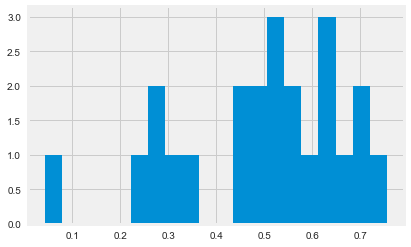

In [23]:
plt.hist(X_withscores[X_withscores['Clin+'] == "Y"]['score'], bins=20)
X_withscores[X_withscores['Clin+'] == "Y"]['score']

In [24]:
X_withscores[X_withscores['pathogenic_green']==True]
X_withscores[X_withscores['microbe']=='Chikungunya virus']


,RNAvalue,DNAvalue,nrnt,groupID,ranks,microbe,patient,microbe_genus,nt_Z_rna,nt_Z_dna,...,pathogenic_green,pathogenic_darkblue,positive,score,Clin+,LRM+,RBM+,Study ID,keep,LRTI Category
930,3.262712,3.262712,1,3,1,Chikungunya virus,chrf_rna_0012_s12.csv,11019,99.0,99.0,...,True,False,False,0.673218,N,Y,Y,chrf_rna_0012_s12.csv,True,unk-LRTI
590,0.000000,0.041393,1,4,19,Chikungunya virus,chrf_rna_0032_s32.csv,11019,0.0,4.3,...,True,False,False,0.000006,N,N,N,chrf_rna_0032_s32.csv,False,no-LRTI
272,0.000000,0.000000,1,1,4,Chikungunya virus,chrf_rna_0039_s39.csv,11019,0.0,1.3,...,True,False,False,0.077649,N,N,N,chrf_rna_0039_s39.csv,False,LRTI+C/+M
1109,2.387034,2.387034,1,3,1,Chikungunya virus,chrf_rna_0071_s71.csv,11019,99.0,99.0,...,True,False,False,0.592731,N,Y,Y,chrf_rna_0071_s71.csv,True,unk-LRTI
1166,3.740118,3.740118,1,3,1,Chikungunya virus,chrf_rna_0094_s94.csv,11019,99.0,99.0,...,True,False,False,0.713457,N,Y,Y,chrf_rna_0094_s94.csv,True,unk-LRTI


In [25]:
# This finalizes the output for TableS3B (Publication version)

table3B = X_withscores[X_withscores['keep']][['Study ID',
                                              'LRTI Category', 
                                              'microbe', 
                                              'Clin+', 
                                              'LRM+', 
                                              'RBM+',
                                              'RNAvalue',
                                              'DNAvalue',
                                              'ranks',
                                              'pathogenic_red',
                                              'pathogenic_green',
                                              'score',
                                              'nt_Z_rna',
                                              'nt_Z_dna']]

adding_to_df = []
for i in set(list(X_withscores['Study ID'])):
    if i not in list(table3B['Study ID']):
        adding_to_df.append(
            [i, str(list(X_withscores[X_withscores['Study ID']==i]['LRTI Category'])[0])] + 
            [None for i in range(12)])
        
df2 = pd.DataFrame(adding_to_df, columns=table3B.columns)
x = table3B.append(df2)
table3B = x

table3B.columns = ['Study ID',
                   'LRTI Category', 
                   'Microbe', 
                   'Clin+', 
                   'LRM+', 
                   'RBM+',
                   'log10( RNA-seq genus rpM )',
                   'log10( DNA-seq genus rpM )',
                   'Rank','Respiratory Pathogen?',
                   'Virus?',
                   'LRM Score',
                   'RNA Z-score',
                   'DNA Z-score']

table3B.sort_values(by=['Study ID','Rank'], inplace=True)
table3B_1 = table3B[table3B['LRTI Category'] == 'LRTI+C/+M']
table3B_2 = table3B[table3B['LRTI Category'] == 'LRTI+C']
table3B_3 = table3B[table3B['LRTI Category'] == 'unk-LRTI']
table3B_4 = table3B[table3B['LRTI Category'] == 'no-LRTI']

t3 = pd.concat([table3B_1,table3B_2,table3B_4,table3B_3])
t3.tail(n=10)
t3.to_csv('./output/' + output_directory + '/TableS3Bfinal.csv',index=False)

## Preliminary version of Figure 3 - combining all methods of pathogen prediction

This is used to rapidly assess the microbial predictions, however it DID NOT end up in the manuscript due to the difficulty protraying the take-home message.

in except
[8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 12, 12, 12, 12, 12]
['CHRF_0005', 'CHRF_0041', 'CHRF_0088', 'CHRF_0029', 'CHRF_0052', 'CHRF_0017', 'CHRF_0064', 'CHRF_0076', 'CHRF_0003', 'CHRF_0026', 'CHRF_0002', 'CHRF_0051', 'CHRF_0061', 'CHRF_0073', 'CHRF_0062', 'CHRF_0086', 'CHRF_0085', 'CHRF_0025', 'CHRF_0014', 'CHRF_0074', 'CHRF_0027', 'CHRF_0037', 'CHRF_0075', 'CHRF_0038', 'CHRF_0087', 'CHRF_0050', 'CHRF_0063', 'CHRF_0028', 'CHRF_0039', 'CHRF_0004', 'CHRF_0040', 'CHRF_0015', 'CHRF_0016', 'CHRF_0006', 'CHRF_0007', 'CHRF_0008', 'CHRF_0009', 'CHRF_0018', 'CHRF_0019', 'CHRF_0020', 'CHRF_0021', 'CHRF_0030', 'CHRF_0031', 'CHRF_0032', 'CHRF_0042', 'CHRF_0043', 'CHRF_0044', 'CHRF_0053', 'CHRF_0054', 'CHRF_0056', 'CHRF_0065'

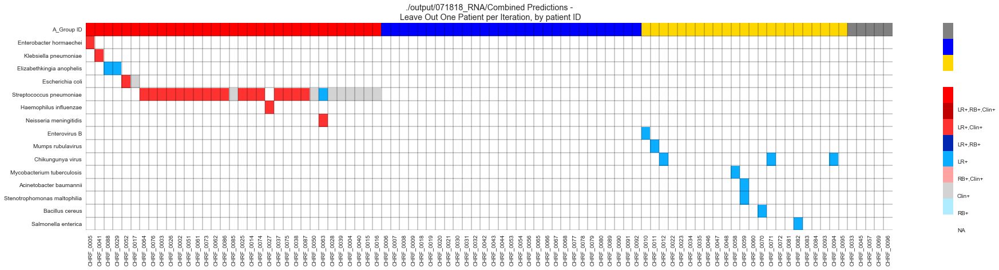

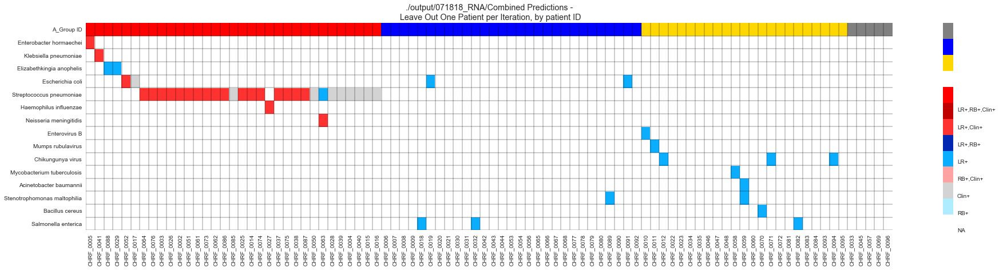

In [26]:

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap

gcombos = []

# TRYING TO CREATE COMBO HEATMAP THAT WILL TAKE IN THE INPUTS FROM ALL G1, G4, G2/3 and output the color-coded heatmap
# NOVEMBER 27

def create_prediction_heatmap_combo_overlap(input_rbm_data, input_lr_data, original_matrix, filename, groupID, true_classification, output_directory, metadata, training_sample_names, output_filename, print_output = False, collapse=True, diversity = None, DIVERSITY_THRESHOLD=1):

    input_rbm_data.to_csv('./output/' + output_directory + '/TableS6A.csv')
    input_lr_data.to_csv('./output/' + output_directory + '/TableS6B.csv')

    # new colors - using shade to indicate group, color to indicate clin +
    # WHITE, RB only (light blue), clin only (light grey), RB + Clin (light red), LR only (med blue), LR + RM (dark blue), LR + Clin (med red), LR + RB + Clin (dark red)
    colors = ['white',
              '#AFECFF',
              'lightgrey',
              '#FFA2A2',
              '#0BAEFF',
              '#0026B2',
              '#FF3232',
              '#C00000',
             'red','white','gold','blue','grey'] # trying to make the above colors more distinct

    CustomCmap = matplotlib.colors.ListedColormap(colors)
    yay_v = 0

    d = pd.DataFrame(0, index=np.arange(len(set(input_lr_data['microbe']))), columns=[i.split('.')[0].lower()+'.report.csv' for i in list(set(original_matrix['patient']))])
    d.index = set(input_lr_data['microbe'])
    #print(d)

    #loop through every patient and create a new column for each patient
    #add all group 1s
    g1s_train = []
    g1s_test = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 1:
                if(i.lower()+'.report.csv' in training_sample_names):
                    g1s_train.append(i.lower()+'.report.csv')
                else:
                    g1s_test.append(i.lower()+'.report.csv')
                #g1s.append(i+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 4s
    g4s_train = []
    g4s_test = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 4:
                if(i.lower()+'.report.csv' in training_sample_names):
                    g4s_train.append(i.lower()+'.report.csv')
                else:
                    g4s_test.append(i.lower()+'.report.csv')
                #g4s.append(i+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 2s
    g2s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 2:
                g2s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 3s
    g3s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 3:
                g3s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]

    #add all group 5s
    g5s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 5:
                g5s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    #print('HIIIIII')
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]

    #print(metadata.head())
    #print(input_rbm_data['patient'].head())
    #print(metadata[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0])
    
    
    
    '''
    # ADD VALUES FOR RB method
    for i in input_rbm_data.index:
        print(input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv')
        print(input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv' in list(diversity.index))
        print(diversity.index)
        print(diversity.head())
        print(diversity.loc[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'])
        if diversity.loc[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv']['input'] > DIVERSITY_THRESHOLD:
            d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] = 1
            orgs = metadata[metadata['sample_name_RNA'] == input_rbm_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]
            #print(orgs)
            if(type(orgs) == type('string')):
                if input_rbm_data.iloc[i]['microbe'] in orgs.split(','):
                    yay_v += 1
                    d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] = d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] + 2

    '''
    
        # ADD VALUES FOR LR method
    for i in input_lr_data.index:
        #print(i)
        #print(input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv')
        #print(input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv' in list(diversity.index))
        
        
        if diversity.loc[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'] > DIVERSITY_THRESHOLD:
        
            try:
                #print(d.columns)
                #print(input_lr_data.iloc[i]['patient'])
                #print(input_lr_data.iloc[i]['microbe'])
                d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] + 4   #try to just add to existing values
            except:
                #NEED TO ADD THE ROW
                new_index = [ v for v in d.index] + [input_lr_data.iloc[i]['microbe']]
                d.loc[len(d)]=[0 for i in range(len(d.columns))]
                d.index = new_index
                d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = 4   # if the value has not existed before, add to the dataframe

            orgs = metadata[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]   # loop through all the organisms
            if(type(orgs) == type('string')):
                if input_lr_data.iloc[i]['microbe'] in orgs.split(','):
                    yay_v += 1
                    #print(d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']])
                    if d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] not in [3,7]:  # if the organism is confirmed, but has not previously been clinically confirmed then...add clinical to it
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] + 2

    # LOOP THROUGH AND ADD CLINICAL GENERA
    #print("???")
    #print(len(set(input_lr_data.index)))
    #print(metadata.shape)

    for i in metadata.index:#input_lr_data.index:
        #print(i)
        index = metadata.loc[i]['sample_name_RNA'].lower()+'.report.csv'
        #print(index)
        
        #print(metadata.loc[i]['organism'])
        #print()
        orgs = metadata.loc[i]['organism']#[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]
        if(type(orgs) == type('string')):
            #print(input_lr_data.iloc[i]['patient'])
            #print(orgs)
            '''
            for o in orgs.split(','):
                #list_of_species = list(set(input_lr_data.loc[input_lr_data['microbe_genus']==o]['microbe']).union(set(input_lr_data.loc[input_lr_data['microbe_genus']==o]['microbe'])))
                list_of_species = list(set(input_lr_data.loc[input_lr_data['microbe']==o]['microbe']).union(set(input_lr_data.loc[input_lr_data['microbe']==o]['microbe'])))
                print(list_of_species)
                a_species_was_found = False
                for s in list_of_species:
                    if not a_species_was_found:
                        try:
                            if d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][s] > 0:
                                a_species_was_found = True
                        except:
                            continue

                #print(a_species_was_found)

                if not a_species_was_found:
                    if sum([int(o == v ) for v in  d.index]) > 0:
                        print(o)
                        print(i)
                        print(input_lr_data.head())
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][o] = 2
                    else:
                        new_index = [ v for v in d.index] + [o]
                        d.loc[len(d)]=[0 for i in range(len(d.columns))]

                        d.index = new_index
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][o] = 2

            '''
            for o in orgs.split(','):
                #print(o)
                try:
                    #print('indise Try')
                    #print(d[index][o])
                    if d[index][o] > 0:
                        a_species_was_found = True
                    else:
                        d[index][o] = 2
                except:
                    print('in except')
                    new_index = [ v for v in d.index] + [o]
                    d.loc[len(d)]=[0 for i in range(len(d.columns))]
                    d.index = new_index
                    d[index][o] = 2




    #gcombos = g1s_train + g1s_test + g4s_train +  g4s_test + g2s + g3s + g5s
    #print("GCOMBOS")
    #print(gcombos)
    gcombos = [i.split('/')[-1].split('.')[0] + '.report.csv' for i in ordered_list_of_files]
    
    d = d[gcombos] # this sorts the columns in order of [group1] [group4]

    #'''
    groupid_names = [i.split('/')[-1].split('.')[0].upper() for i in ordered_list_of_files]
    groupids = []
    for i in groupid_names:
        groupids.append(
            metadata[metadata['sample_name_RNA'] == i]['effective_group'][0] + 7
        )
    d.loc['A_Group ID'] = groupids
    print(groupids)
    #'''
    
    
    #reset names to remove .report.csv notation
    new_col_names = []
    for i in d.columns:
        new_col_names.append(i.split('.')[0])
    d.columns = new_col_names




    # Apply some collapsing for the indices
    if(collapse):
        strep_viridans_group = ['Streptococcus pseudopneumoniae ( 257758 )','Streptococcus sp. VT 162 ( 1419814 )',
                                'Streptococcus salivarius ( 1304 )','Streptococcus mitis ( 28037 )',
                                'Streptococcus pseudopneumoniae ( 257758 )','Streptococcus anginosus ( 1328 )']
        strep_preprocessed_names = []
        #print(d.index)
        for i in d.index:
            if(i in strep_viridans_group):
                strep_preprocessed_names.append('Streptococci viridans Group ( XXX )')
            elif('coronavirus' in i):
                strep_preprocessed_names.append('Human coronavirus species ( XXX )')
            else:
                strep_preprocessed_names.append(i)  # strep pneumo and strep genera (clinical) will be merged

        d.index = strep_preprocessed_names
        first_values = [' '.join(i.split(' ')[0:-4]) if i.count(' ') > 3 else ' '.join(i.split(' ')[0:-3]) for i in d.index]
        d.index = first_values


        for j in d.columns:
            for k in set(first_values):
                #print(k)
                l = list(d[j][d.index==k])
                #print(l)
                if 2 in l and 3 in l:
                    # this is bad - it will collapse incorrectly and appear the BM and LR matched (score = 5),
                    # when in reality it was a collapse of RB+Clin (3) and Clin+ (3) again - need to modify the cases post-hoc.
                    #print([3] + [0 for i in range(len(l)-1)])
                    d[j][d.index==k] = [3] + [0 for i in range(len(l)-1)]





        d = d.groupby(d.index).sum()

        post_mod_index = []  # MODIFICATIONS TO UPDATE NAME OF STREP AND STAPH TO BE CLEAR
        for i in d.index:
            if(i == 'Streptococcus'):
                post_mod_index.append('Streptococcus pneumoniae')
            elif(i == 'Staphylococcus'):
                post_mod_index.append('Staphylococcus aureus')
            elif(i == 'Human respiratory syncytial'):
                post_mod_index.append('Human RSV')
            else:
                post_mod_index.append(i)

        d.index = post_mod_index

    


    # sort the indices by alphabetical order
    new_d = d.sort_index(axis=0)
    d = new_d
    d = d[d.sum(axis=1) > 0]
    
    
    manual_sorting = ['A_Group ID',
               'Enterobacter hormaechei',
              'Klebsiella pneumoniae',
              'Elizabethkingia anophelis',
              'Escherichia coli',
              'Streptococcus pneumoniae',
              'Haemophilus influenzae',
              'Neisseria meningitidis',
              'Enterovirus B',
              'Mumps rubulavirus',
              'Chikungunya virus',
              'Mycobacterium tuberculosis',
              'Acinetobacter baumannii',
              'Stenotrophomonas maltophilia',
              'Bacillus cereus',
              'Salmonella enterica']
    
    d = d.loc[manual_sorting]
    
    new_columns = ['_'.join([c.split('_')[0],c.split('_')[2]]).upper() for c in d.columns]
    #new_cols_temp = ['TA-' + str(c.split('-')[1]) for c in d.columns]  #convert names to TA-XXX notation
    #new_columns = [i[0:6] for i in new_cols_temp]  #get rid of TRNA from the one sample that has weird naming convention
    print(new_columns)
    d.columns = new_columns




    fig_height = (d.shape[0]/4.8)*2
    #fig_width = d.shape[1]/4.8
    fig_width = (d.shape[1]/6.4)*2

    #d.to_csv('LRcombo.csv')

    if print_output:
        print(d.head())

    #colors = ['white','#4AA2B6','lightgrey','#04819E','#69DE56','#F93846','#1DD300','#F90012']
    #ordered_colors = ['white','lightgrey','deepskyblue','blue','yellow','gold','orange','red']

    cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))


    plt.figure(figsize=(fig_width,fig_height))
    #ax = sns.heatmap(d,cmap=CustomCmap,vmin=0,vmax=7,cbar=False)
    ax = sns.heatmap(d,cmap=cmap,vmin=0,vmax=12)#,row_colors='red')#,cbar=False)
    ax.hlines([i for i in range(len(d.index))], *ax.get_xlim(),lw=.4)
    ax.vlines([i for i in range(len(d.columns))], *ax.get_ylim(),lw=.4)
    ax.tick_params(labelsize=10)
    colorbar = ax.collections[0].colorbar
    colorbar.set_ticks([i for i in range(len(colors))])
    colorbar.set_ticks([0,2,1,3,4,6,5,7])
    colorbar.set_ticklabels(['NA','Clin+','RB+','RB+,Clin+','LR+','LR+,Clin+','LR+,RB+','LR+,RB+,Clin+'])
    #colorbar.set_ticklabels(['NA','RB+','Clin+','RB+,Clin+','LR+','LR+,RB+','LR+,Clin+','LR+,RB+,Clin+'])

    plt.title( filename + ", by patient ID")
    plt.savefig('./output/' + output_directory + '/' + output_filename , bbox_inches='tight')

    return d



lr_results = pd.concat([ 
                        patient_by_microbe_predicted_g2]) #,patient_by_microbe_predicted_g4_test, 
lr_results.reset_index(inplace=True)
c = pd.concat([rbm_g1,rbm_g4,rbm_g2,rbm_g3])
c.reset_index(inplace=True)

X_full = pd.concat([X_g1,X_g4,X_g2,X_g3])

# this representation enables easy viewing of the overlap btwn clinical and predicted results
# unfortunately, the published TableS2 does not highlight this aspect of the data as well, 
# so I am maintaining this graphic here.
#
d = create_prediction_heatmap_combo_overlap(c,lr_results,X_full, 
                                            './output/' +  output_directory + 
                                              '/Combined Predictions -\n Leave Out One Patient per Iteration',
                                               [1,4,2,3],
                                                               true_classification[true_classification.index.notnull()], 
                                                               output_directory, 
                                                               metadata, 
                                                               training_sample_names,
                                                               'FigureS3_TrainTest.pdf', 
                                                               print_output = False, 
                                                               collapse=False,
                                                               diversity = log(rna_input['RNA_input']+1),
                                                                DIVERSITY_THRESHOLD = 1.4)# pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1),
                                                               #DIVERSITY_THRESHOLD=.6)
print("DONE WITH THE FIRST HEATMAP")

d = create_prediction_heatmap_combo_overlap(c,lr_results,X_full, 
                                            './output/' +  output_directory + 
                                              '/Combined Predictions -\n Leave Out One Patient per Iteration',
                                               [1,4,2,3],
                                                               true_classification[true_classification.index.notnull()], 
                                                               output_directory, 
                                                               metadata, 
                                                               training_sample_names,
                                                               'FigureS3_TrainTest_nodivthresh.pdf', 
                                                               print_output = False, 
                                                               collapse=False,
                                            diversity = log(rna_input['RNA_input']+1),
                                            DIVERSITY_THRESHOLD = 0
                                           #diversity = pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1),
                                                               )

In [ ]:
true_classification

In [78]:
ct_values = metadata[['CT value from qPCR_RNA']].fillna(0)
ct_values[ct_values['CT value from qPCR_RNA']==' Negative'] = 0
ct_values.index = [i.lower() for i in list(metadata['sample_name_RNA'])]

plt.figure(figsize=(15,2))
float_values = [-1*float(i) for i in list((ct_values.loc[list(d.columns)])['CT value from qPCR_RNA'])]
ct_plot = (pd.Series(dict(zip(d.columns,float_values))).loc[list(d.columns)]).plot(kind='bar', color='dodgerblue', width=.9, alpha = .5,ylim=[-50,0])
plt.savefig('./output/' + output_directory + '/CT_barplot.pdf' , bbox_inches='tight')

KeyError: "None of [['CHRF_0005', 'CHRF_0041', 'CHRF_0088', 'CHRF_0029', 'CHRF_0052', 'CHRF_0017', 'CHRF_0064', 'CHRF_0076', 'CHRF_0003', 'CHRF_0026', 'CHRF_0002', 'CHRF_0051', 'CHRF_0061', 'CHRF_0073', 'CHRF_0062', 'CHRF_0086', 'CHRF_0085', 'CHRF_0025', 'CHRF_0014', 'CHRF_0074', 'CHRF_0027', 'CHRF_0037', 'CHRF_0075', 'CHRF_0038', 'CHRF_0087', 'CHRF_0050', 'CHRF_0063', 'CHRF_0028', 'CHRF_0039', 'CHRF_0004', 'CHRF_0040', 'CHRF_0015', 'CHRF_0016', 'CHRF_0006', 'CHRF_0007', 'CHRF_0008', 'CHRF_0009', 'CHRF_0018', 'CHRF_0019', 'CHRF_0020', 'CHRF_0021', 'CHRF_0030', 'CHRF_0031', 'CHRF_0032', 'CHRF_0042', 'CHRF_0043', 'CHRF_0044', 'CHRF_0053', 'CHRF_0054', 'CHRF_0056', 'CHRF_0065', 'CHRF_0066', 'CHRF_0067', 'CHRF_0068', 'CHRF_0077', 'CHRF_0078', 'CHRF_0079', 'CHRF_0080', 'CHRF_0089', 'CHRF_0090', 'CHRF_0091', 'CHRF_0092', 'CHRF_0010', 'CHRF_0011', 'CHRF_0012', 'CHRF_0022', 'CHRF_0023', 'CHRF_0034', 'CHRF_0035', 'CHRF_0046', 'CHRF_0047', 'CHRF_0048', 'CHRF_0058', 'CHRF_0059', 'CHRF_0060', 'CHRF_0070', 'CHRF_0071', 'CHRF_0072', 'CHRF_0081', 'CHRF_0082', 'CHRF_0083', 'CHRF_0084', 'CHRF_0093', 'CHRF_0094', 'CHRF_0095', 'CHRF_0033', 'CHRF_0045', 'CHRF_0057', 'CHRF_0069', 'CHRF_0096']] are in the [index]"

<Figure size 1080x144 with 0 Axes>

[]
0.6803447113113357


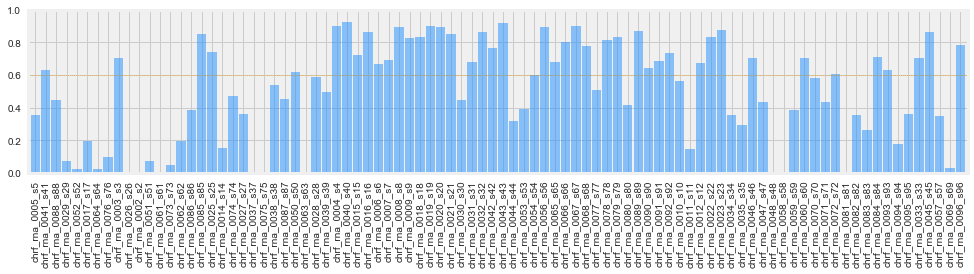

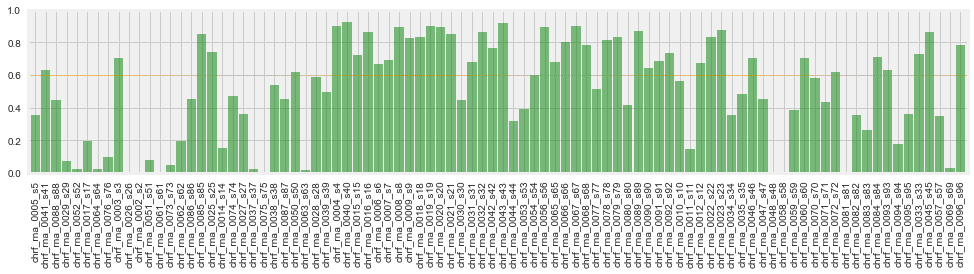

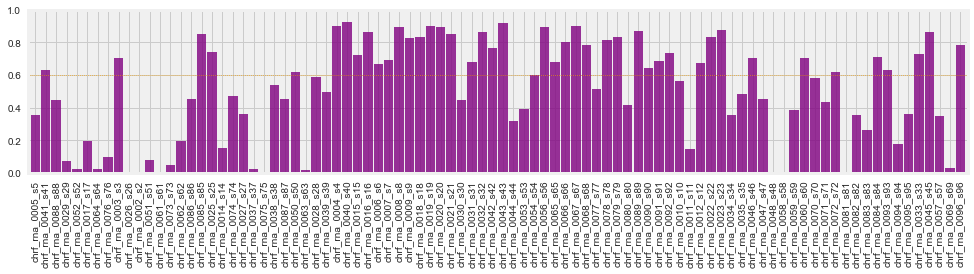

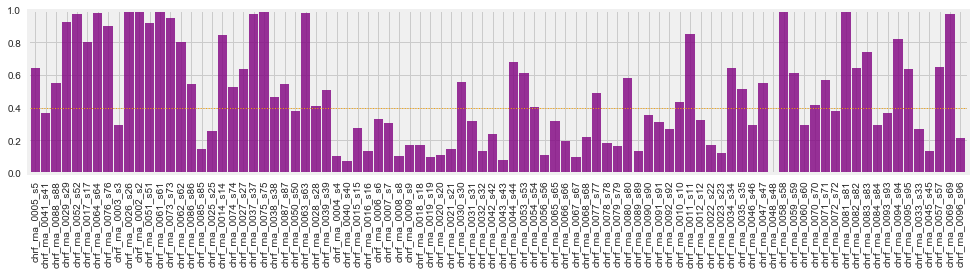

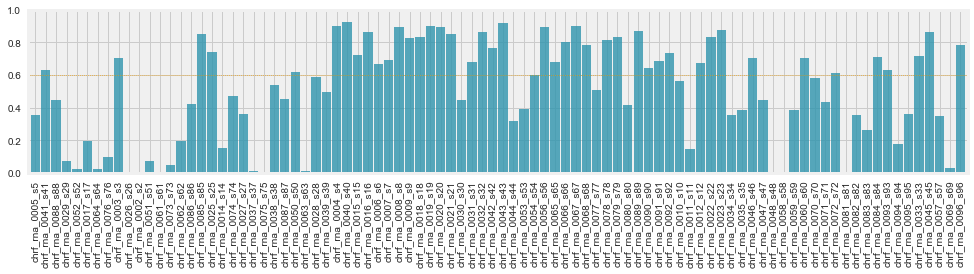

In [39]:
print(gcombos)

plt.figure(figsize=(15,3))
rna_div_plot = pd.Series(RNA_diversity).loc[list(d.columns)].plot(kind='bar', color='dodgerblue', width=.9, alpha = .5,ylim=[0,1])
#dna_div_plot = pd.Series(DNA_diversity).loc[list(d.columns)].plot(kind='bar', color='green', width=.9, alpha = .5)
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/rna_div_barplot.pdf' , bbox_inches='tight')

plt.figure(figsize=(15,3))
#rna_div_plot = pd.Series(RNA_diversity).loc[list(d.columns)].plot(kind='bar', color='dodgerblue', width=.9, alpha = .5)
dna_div_plot = pd.Series(DNA_diversity).loc[list(d.columns)].plot(kind='bar', color='green', width=.9, alpha = .5,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/dna_div_barplot.pdf' , bbox_inches='tight')


plt.figure(figsize=(15,3))
pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1).loc[list(d.columns)].plot(kind='bar', color='purple', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/max_div_barplot.pdf' , bbox_inches='tight')

plt.figure(figsize=(15,3))
(1-pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1)).loc[list(d.columns)].plot(kind='bar', color='purple', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.4, linestyle=':', lw=1, color='orange')
plt.savefig('./output/' + output_directory + '/max_div_barplot.pdf' , bbox_inches='tight')


plt.figure(figsize=(15,3))
pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1).loc[list(d.columns)].plot(kind='bar', color='#2e94ad', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/mean_div_barplot.pdf' , bbox_inches='tight')

print(pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1).loc[list(d.columns)].loc['chrf_rna_0065_s65'])